In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.sparse import spdiags
from scipy.sparse.linalg import spsolve
from scipy.signal import find_peaks,peak_widths
from scipy.integrate import trapz
from pybaselines import whittaker
import string
import re
import csv
import json

# Parameters to Define

In [35]:
experiment_folder = "../../../data/CE_data/25_01_24_Substrate_tests_1/"

0.1774695312264369
0.20118838173945897
0.15912035991160506
0.15163822503765773
0.10013606714811835
0.09385416119265756
0.364603744891116
0.250015640112196
272.03903475885227
0.1475108094929388
0.2577253613299319
0.1443775915954311
0.2519436361349756
0.10557696643334785
0.1770206193054701
0.2583333979244577
0.2256937748630435
0.16054932862605287
0.14962408155848622
0.3486454095236872
0.2514746403912162
0.15046085754453054
0.3816163480449879
0.19763938599228334
0.18429089668662427
0.3067828038908552
0.19873265331429416
0.13753849243256988
0.12763937393215616
0.4457892483911974
0.7485760552154394
0.10215422809754103
0.2325073658551509
0.278250684595386
0.12037700306897908
0.14807267892498224
0.16285815634873785
0.21065653520897115
0.2180886268748162
0.25586247425337905
0.24423359495830071
8.278570685464596
0.5115212987421275
0.23203910479535225
0.21424269622998662
0.279447405520377
0.12724151889667554
0.27819336423100627
0.18470813339183056
0.16151460723991656
0.23480048013860988
0.134093

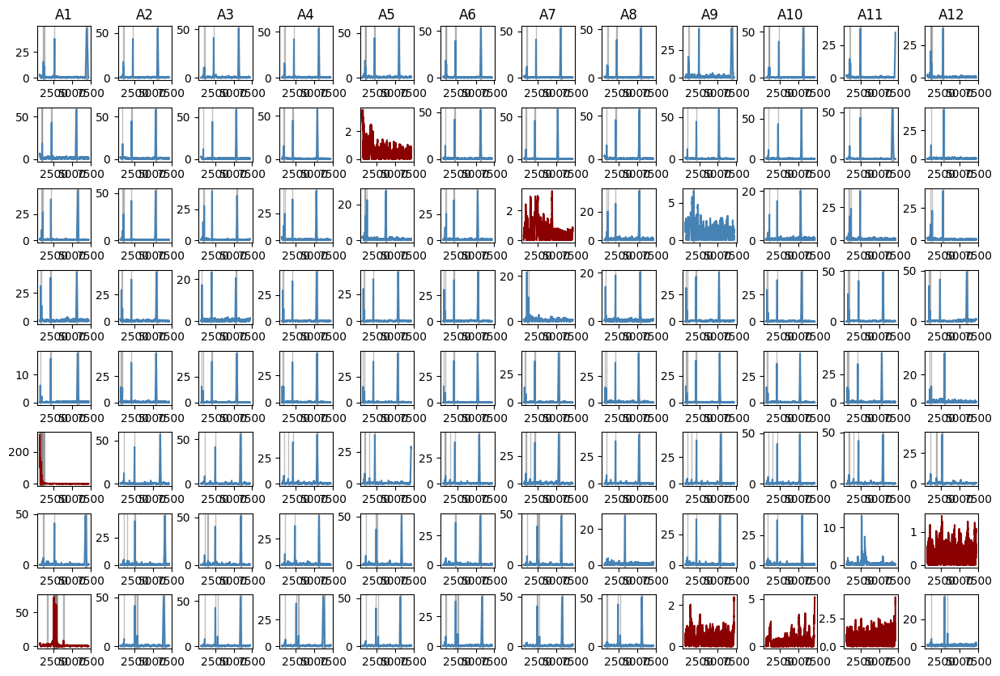

A1


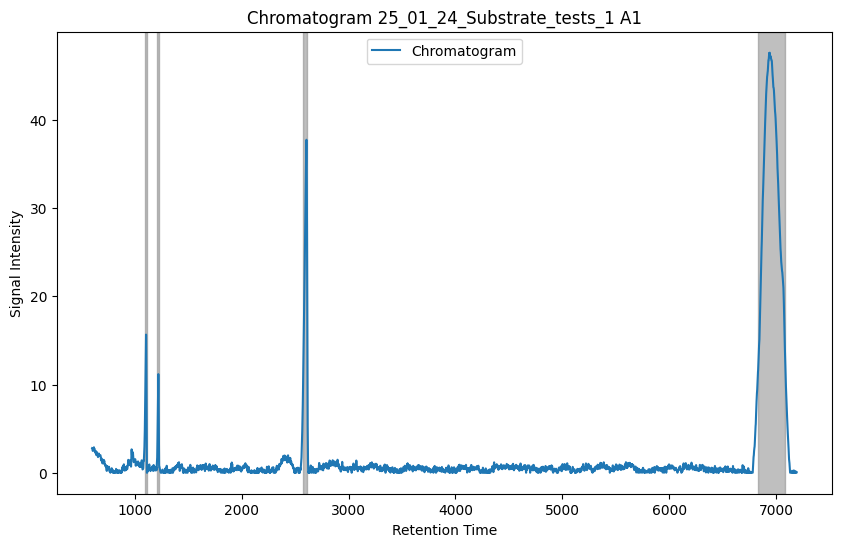

A2


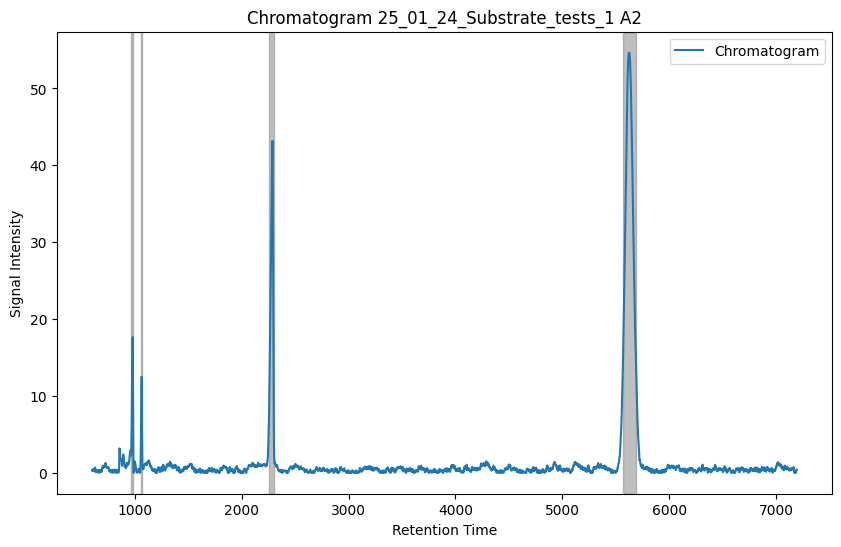

A3


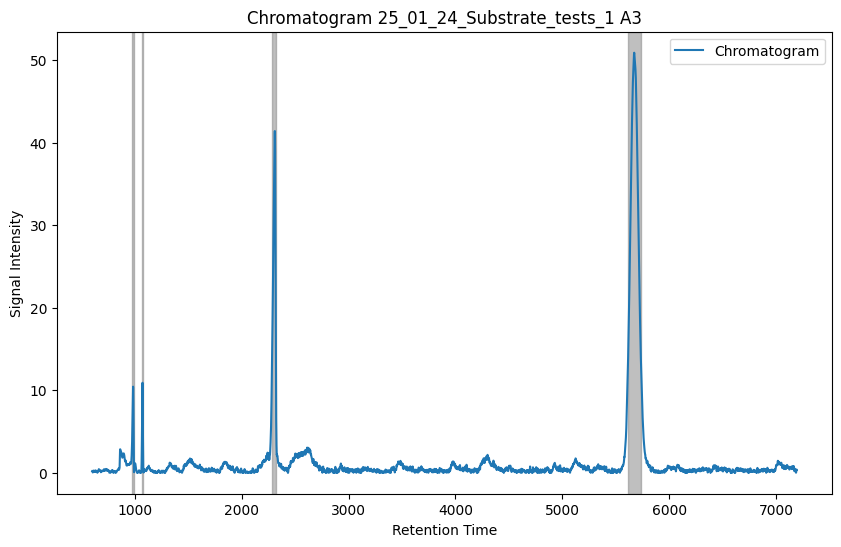

A4


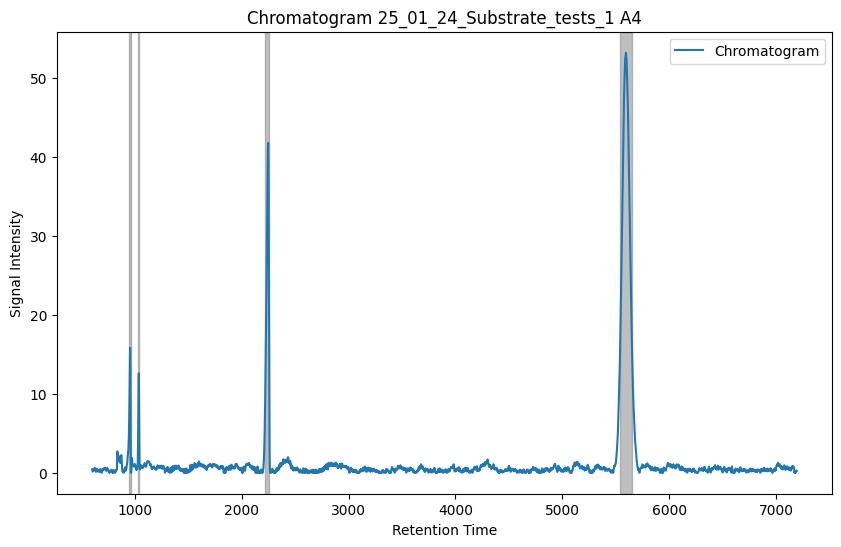

A5


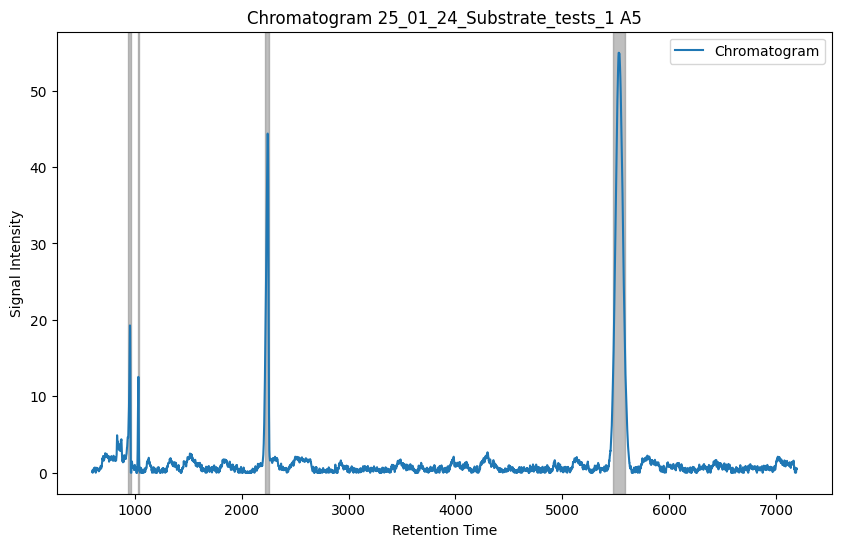

A6


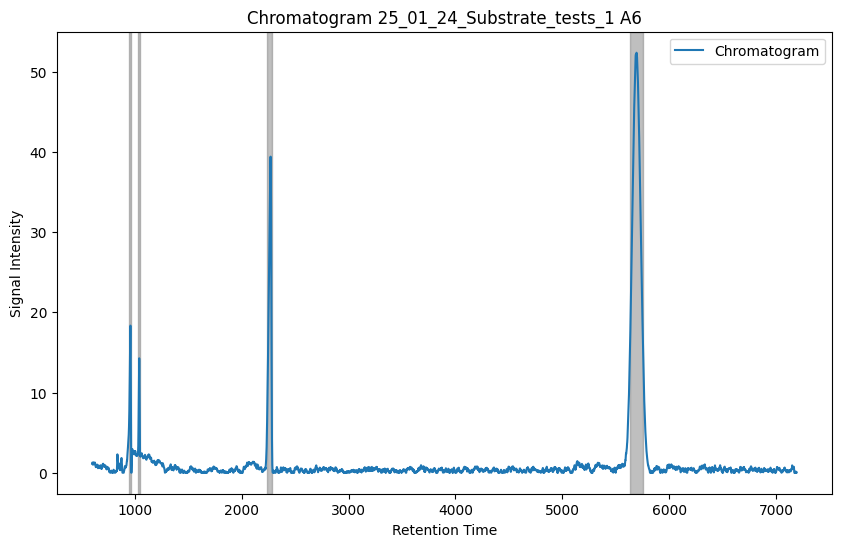

A7


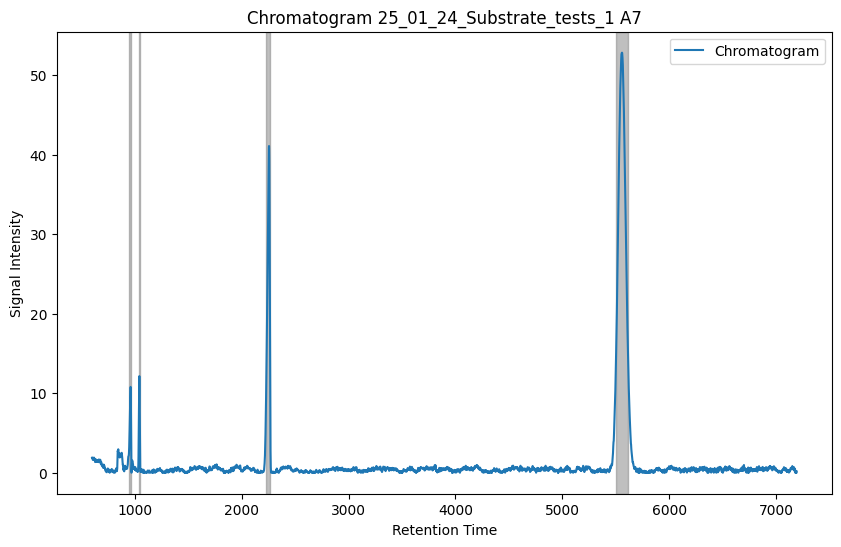

A8


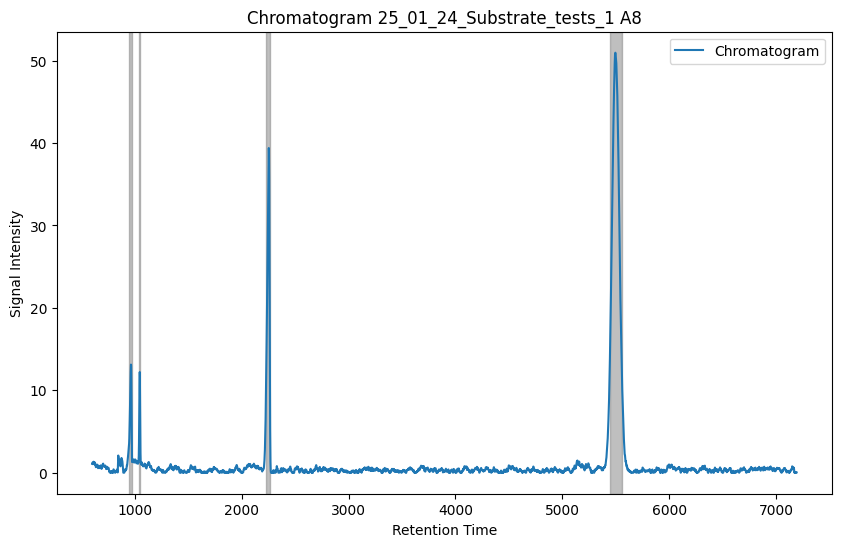

A9


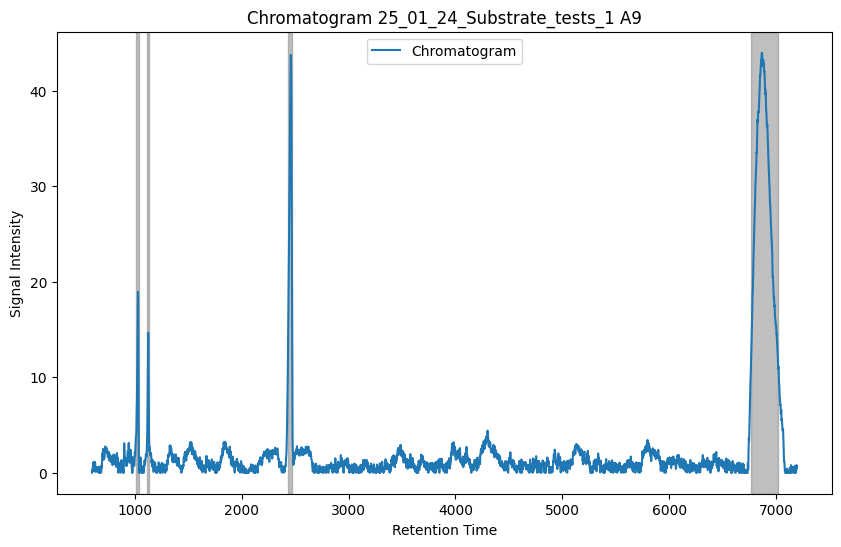

A10


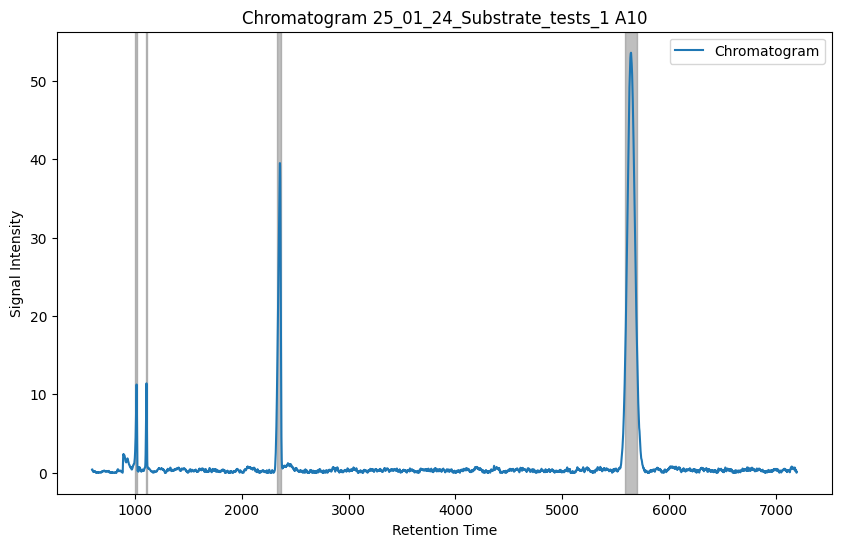

A11


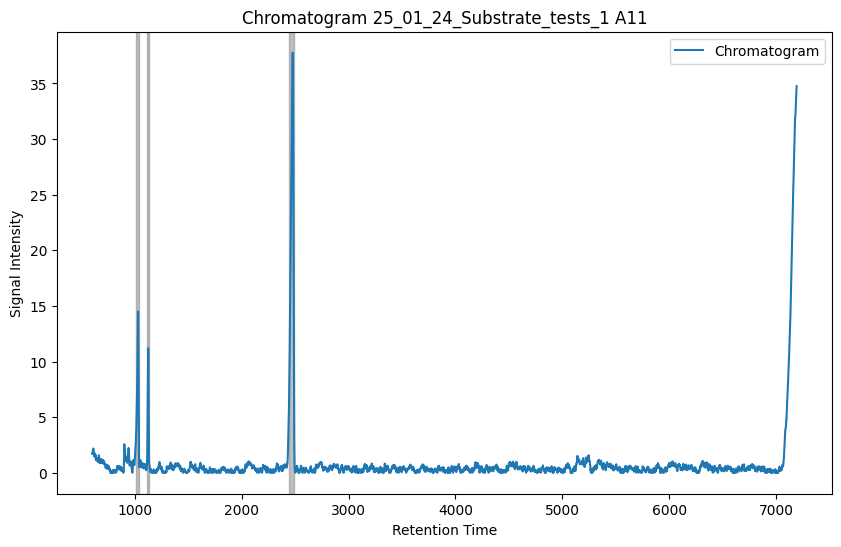

A12


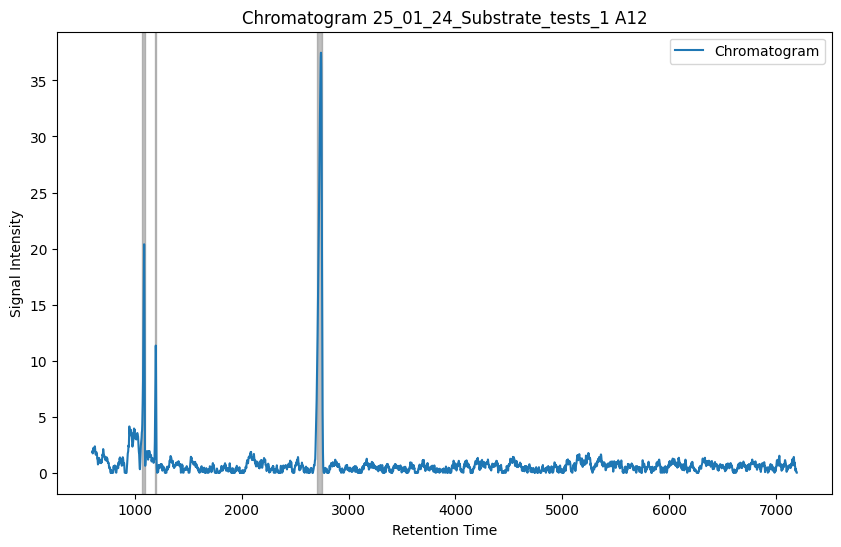

B1


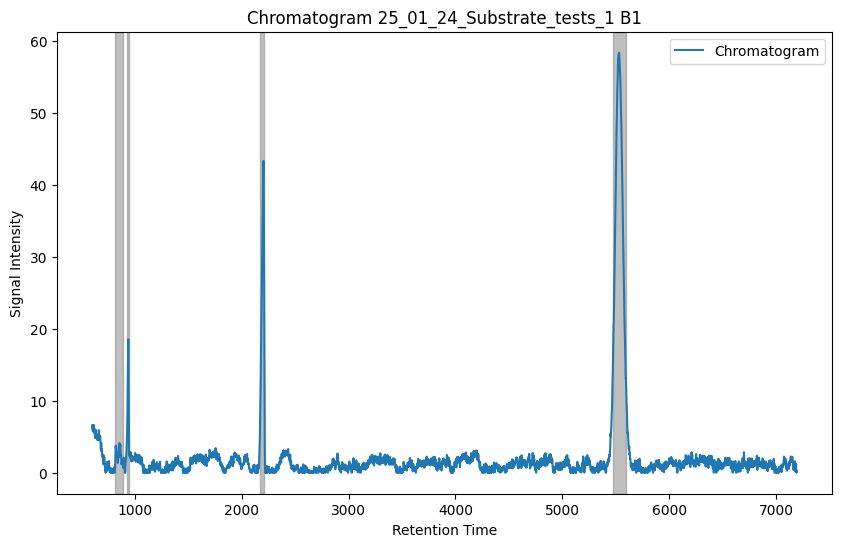

B2


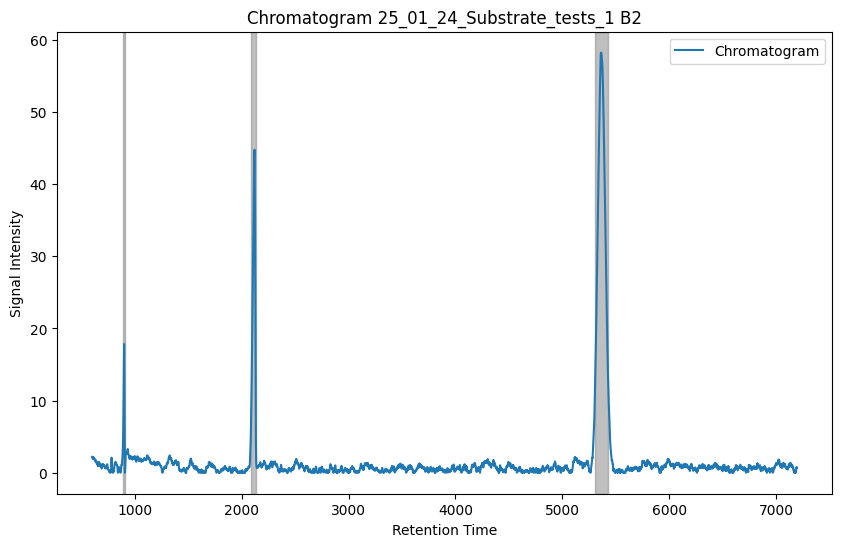

B3


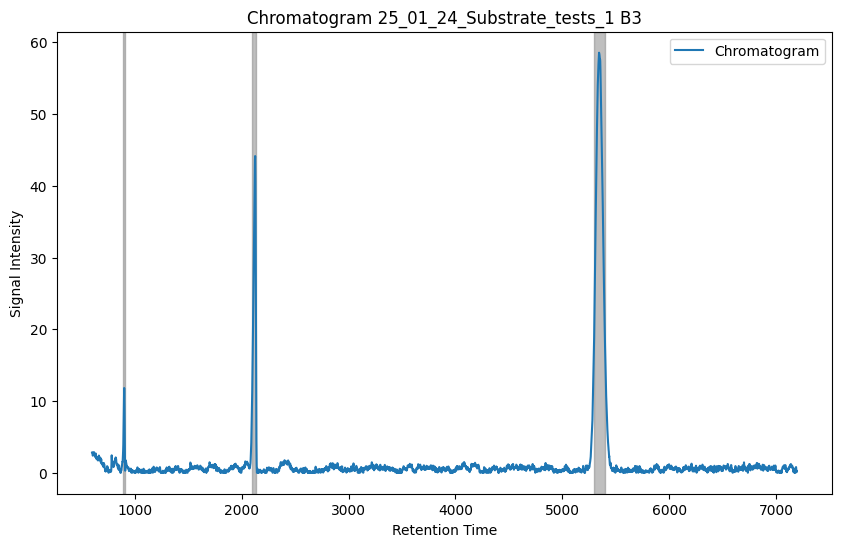

B4


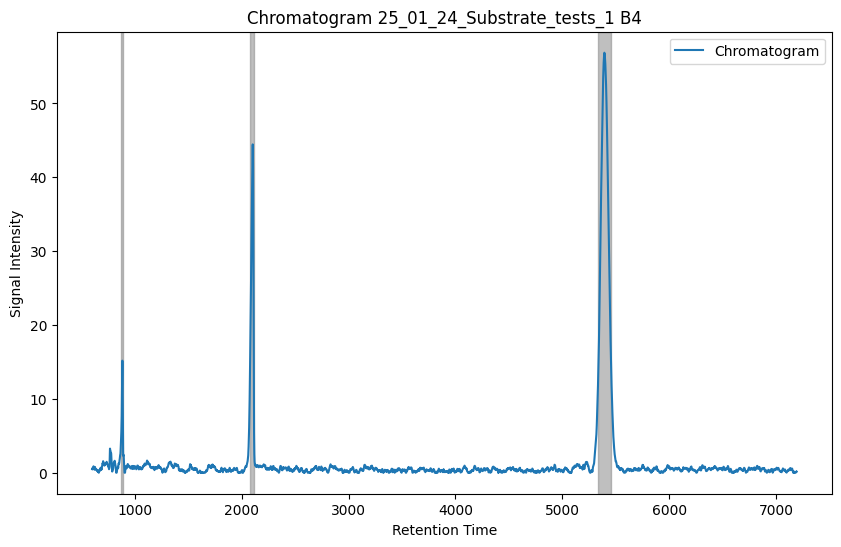

B5


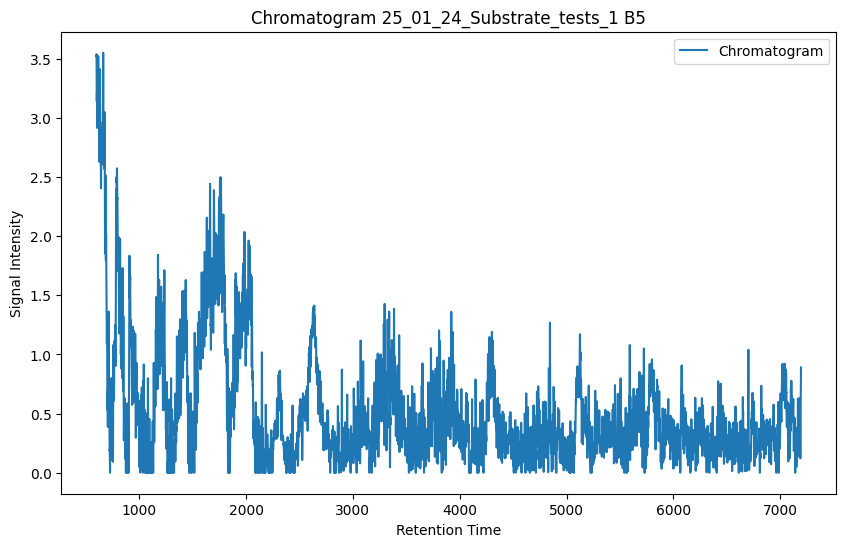

B6


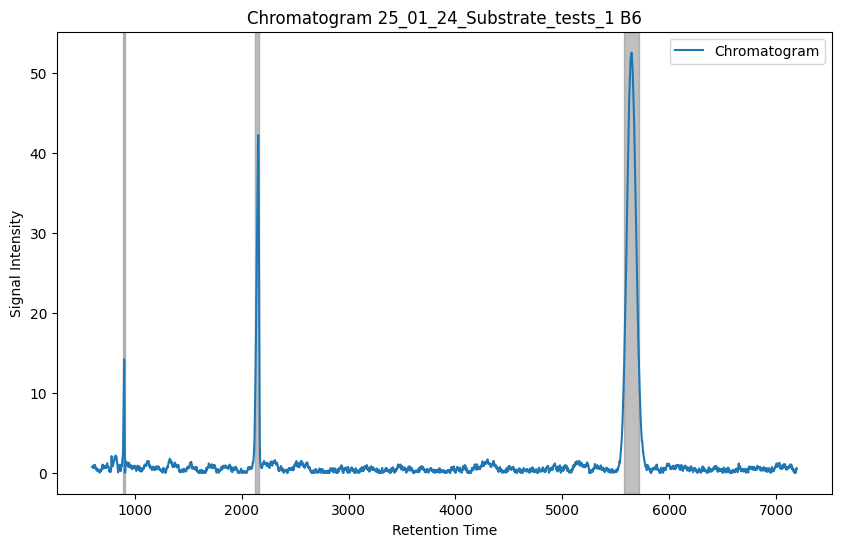

B7


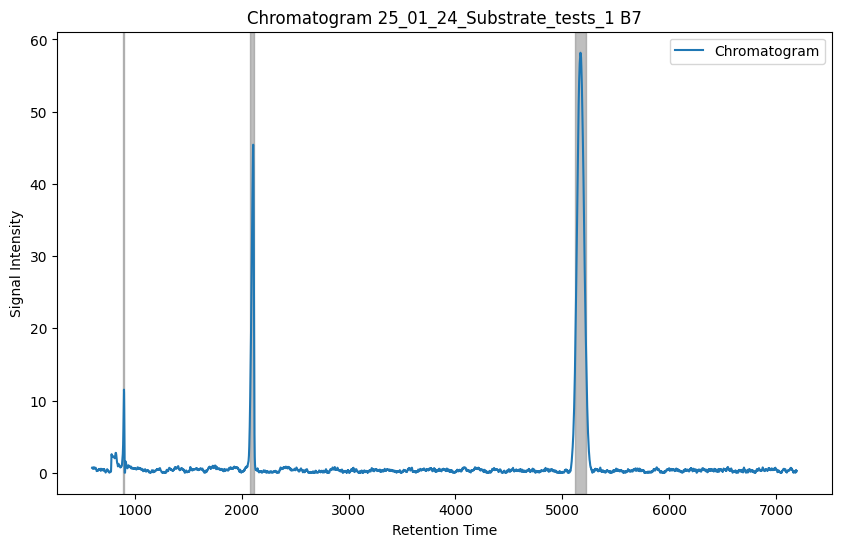

B8


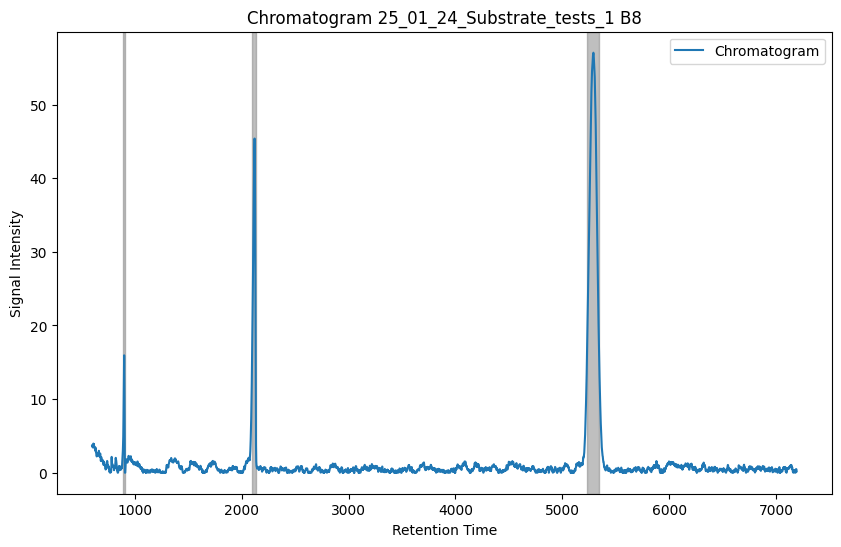

B9


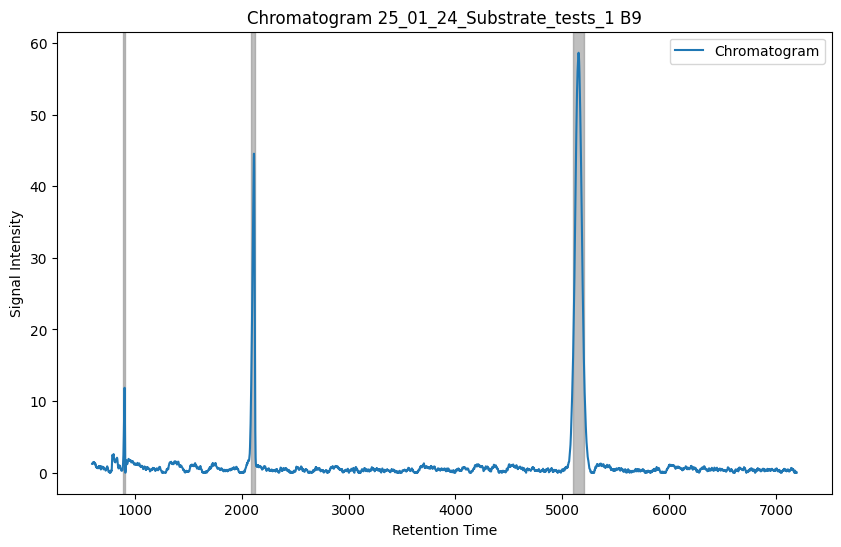

B10


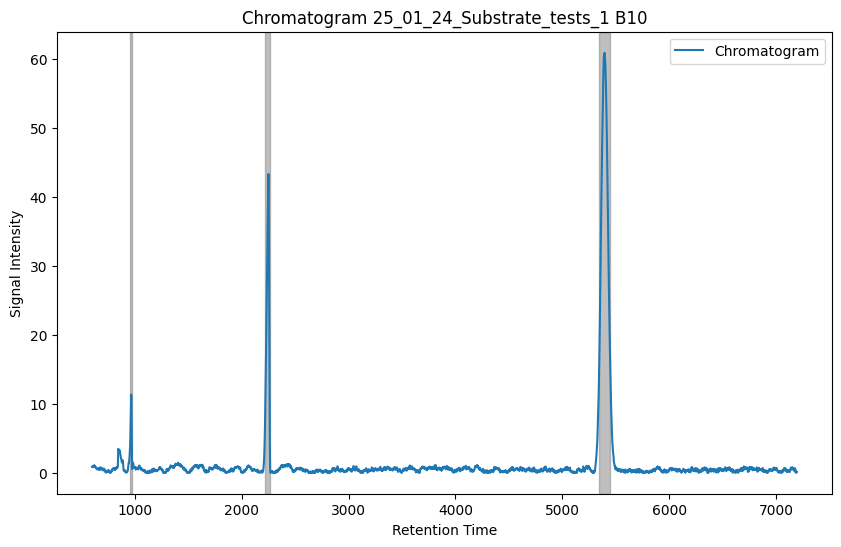

B11


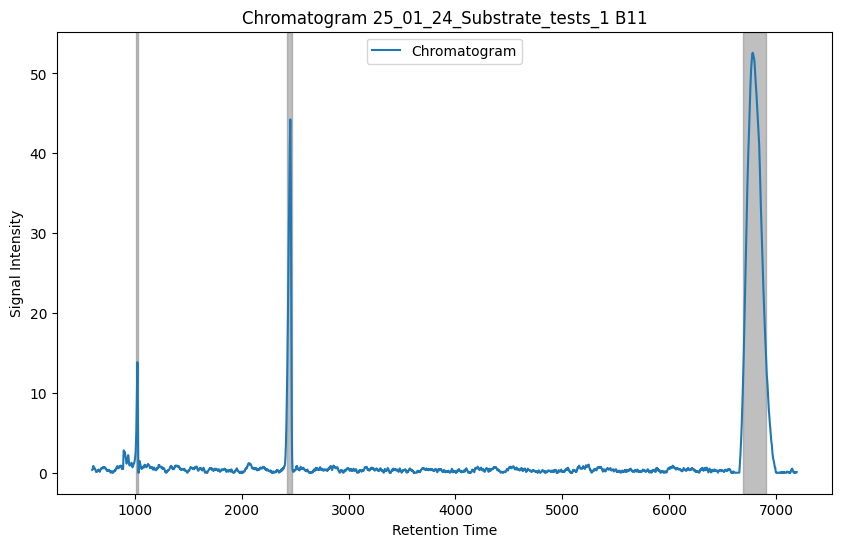

B12


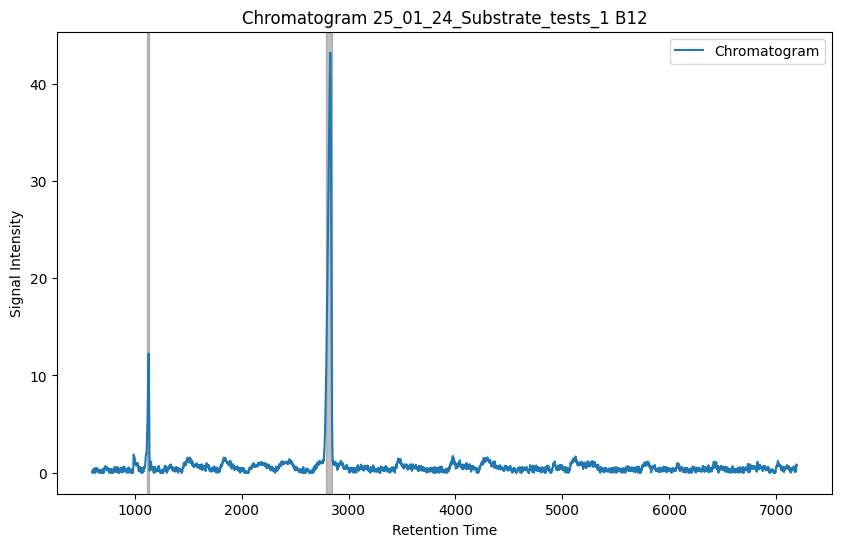

C1


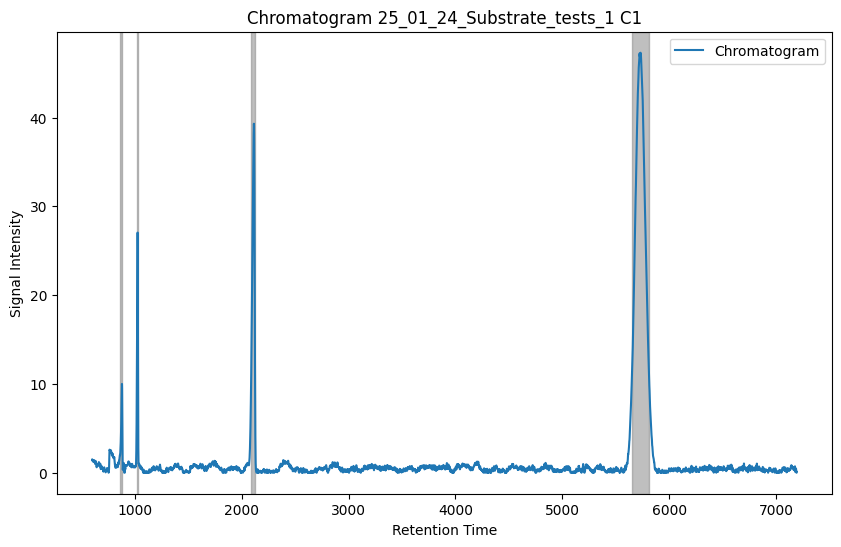

C2


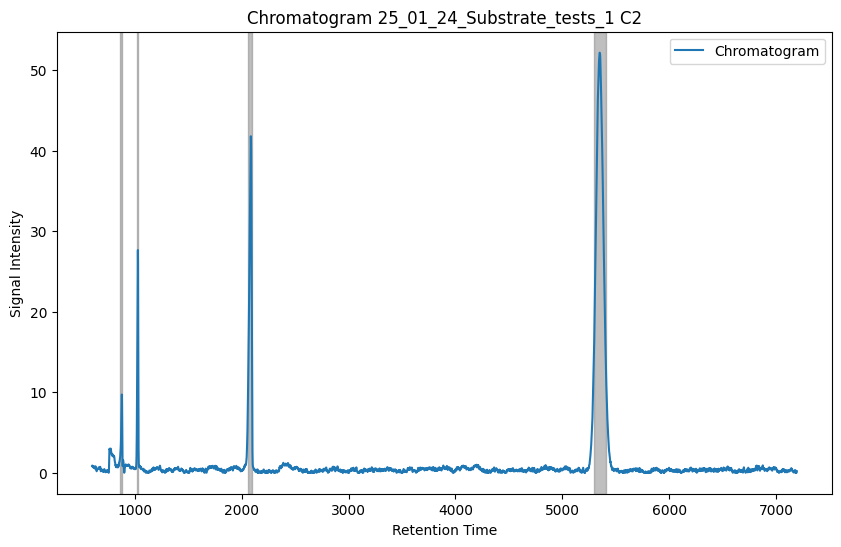

C3


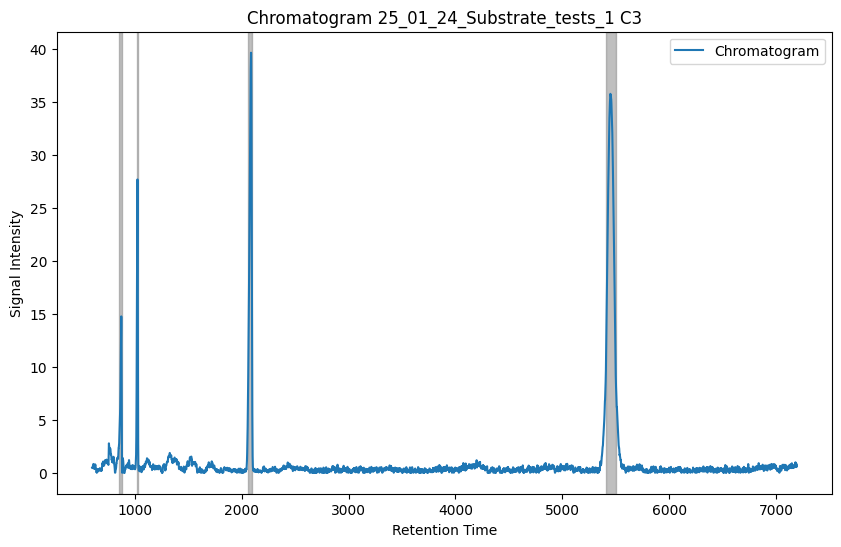

C4


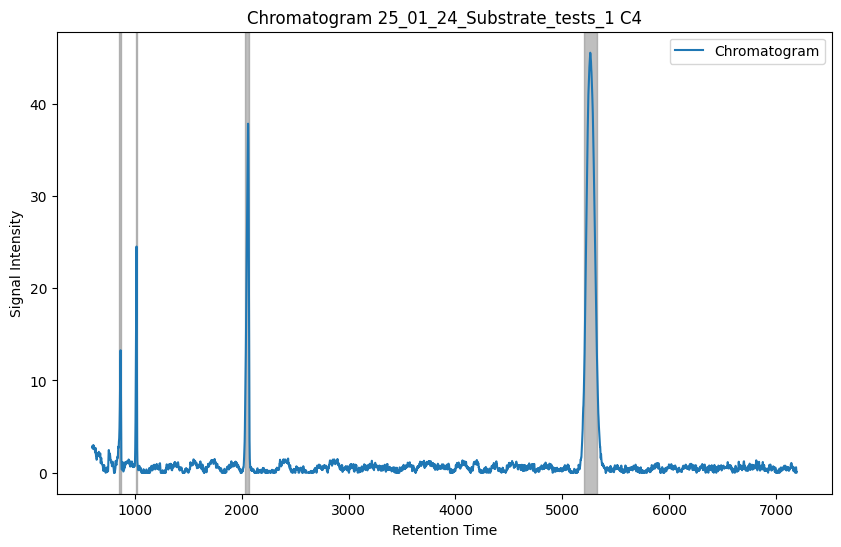

C5


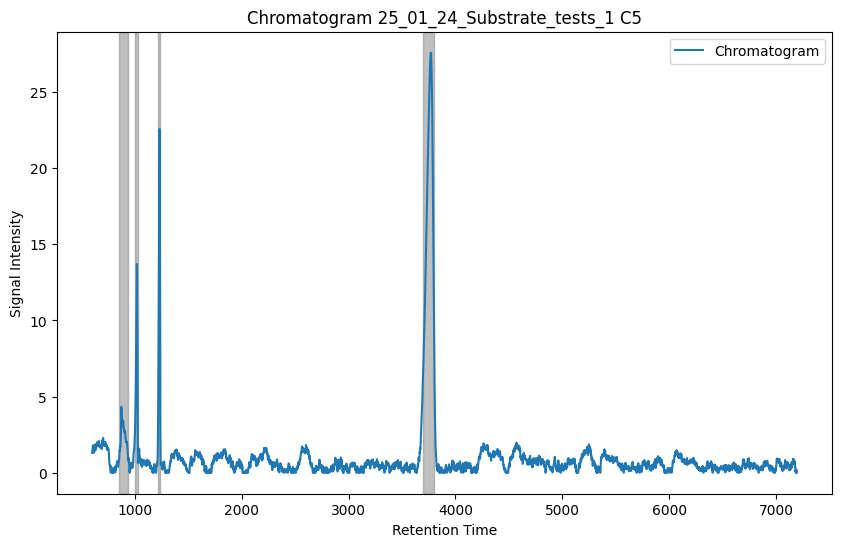

C6


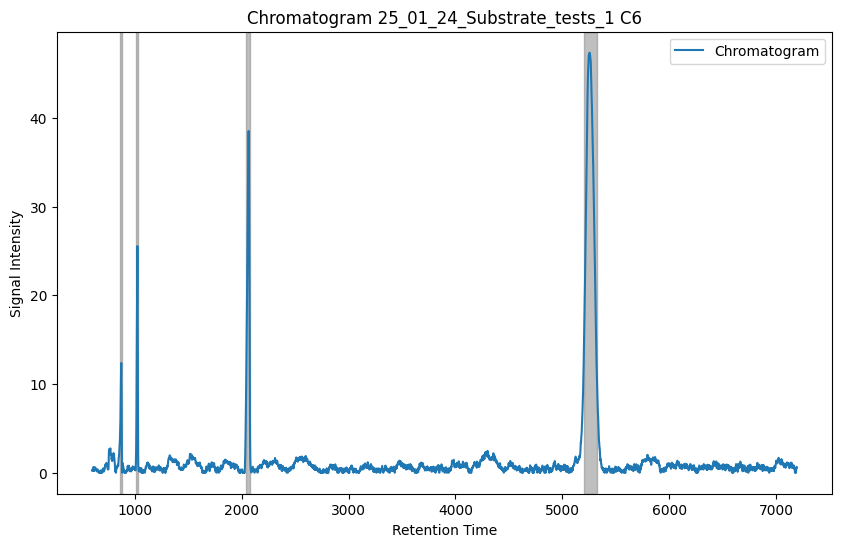

C7


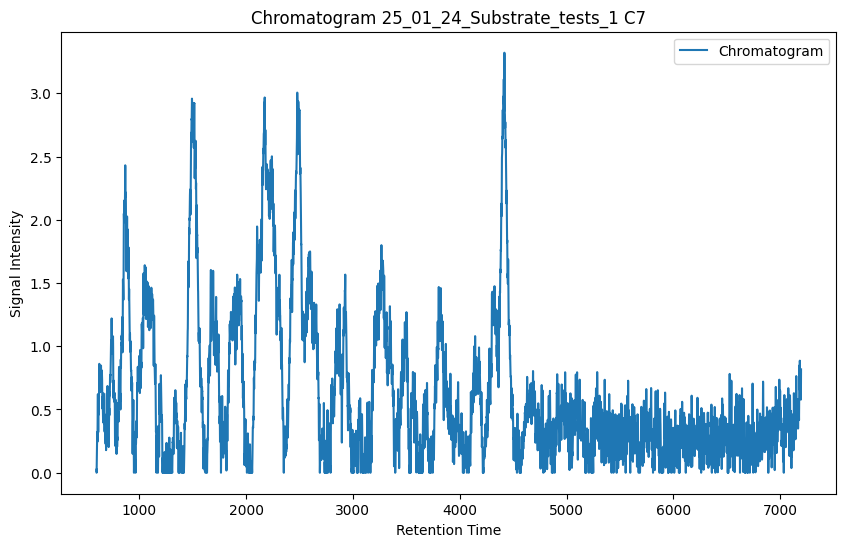

C8


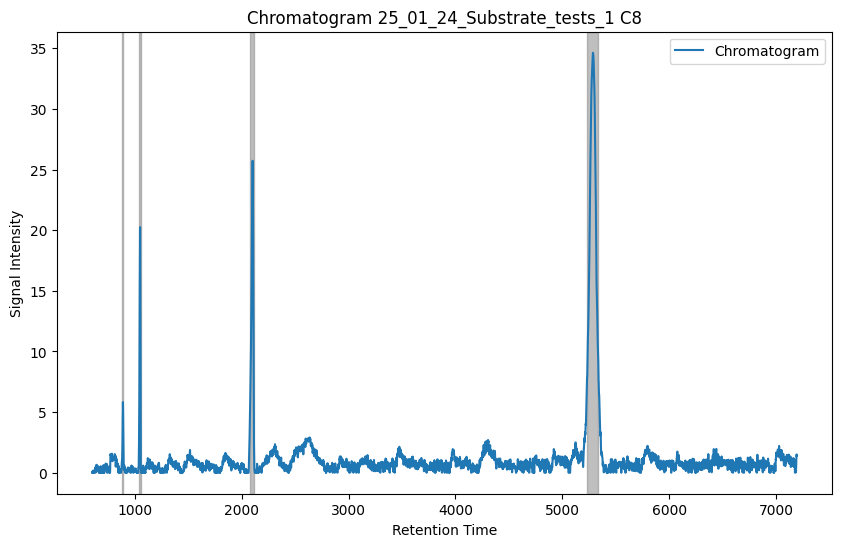

C9


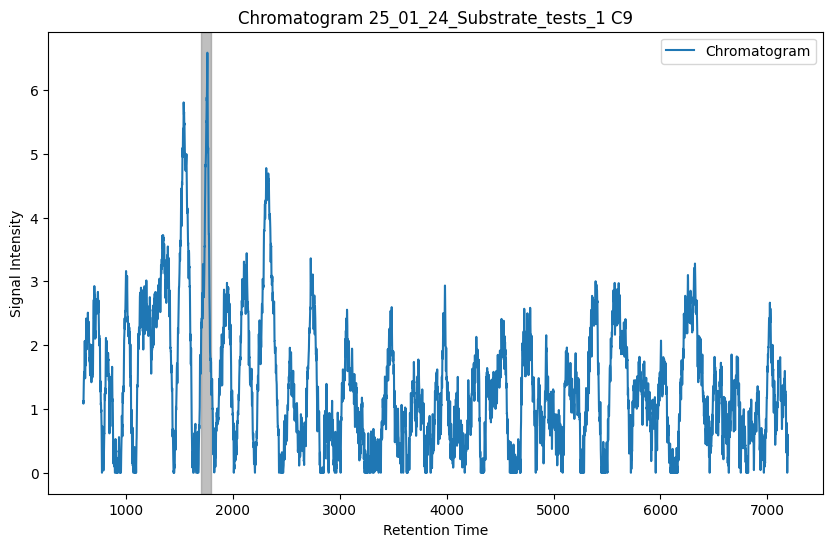

C10


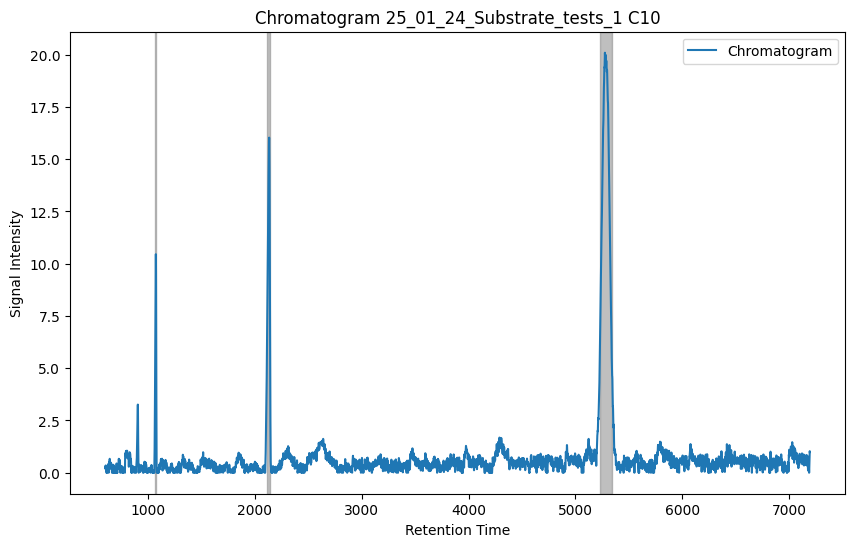

C11


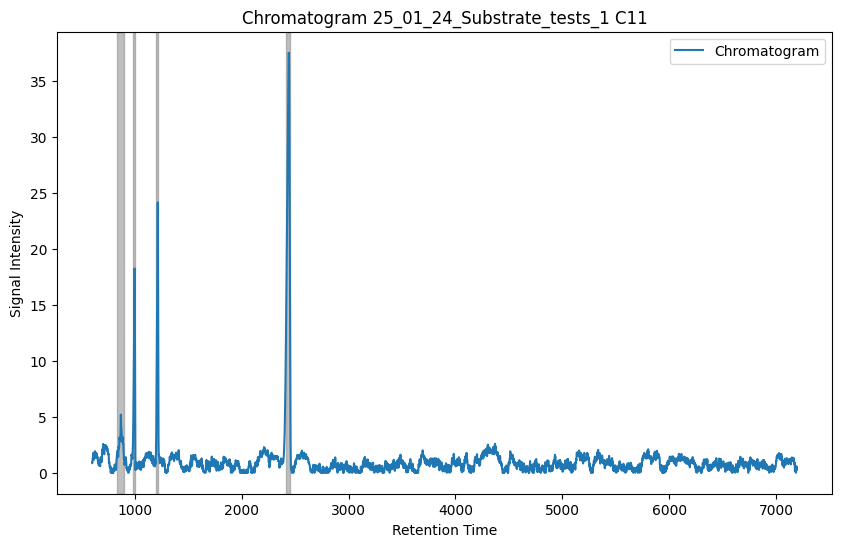

C12


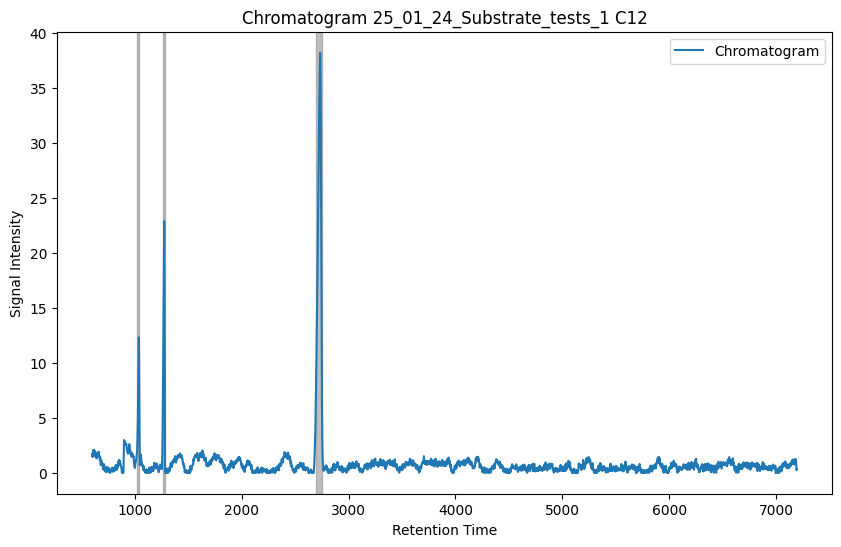

D1


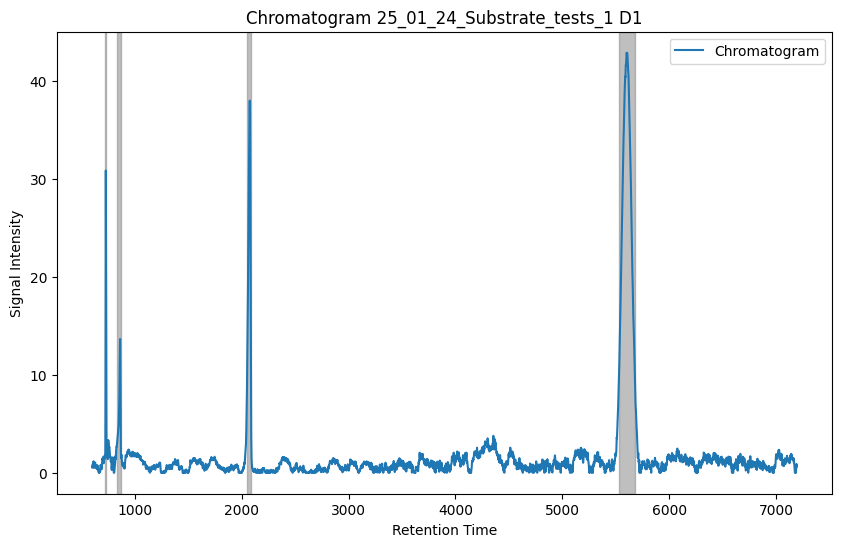

D2


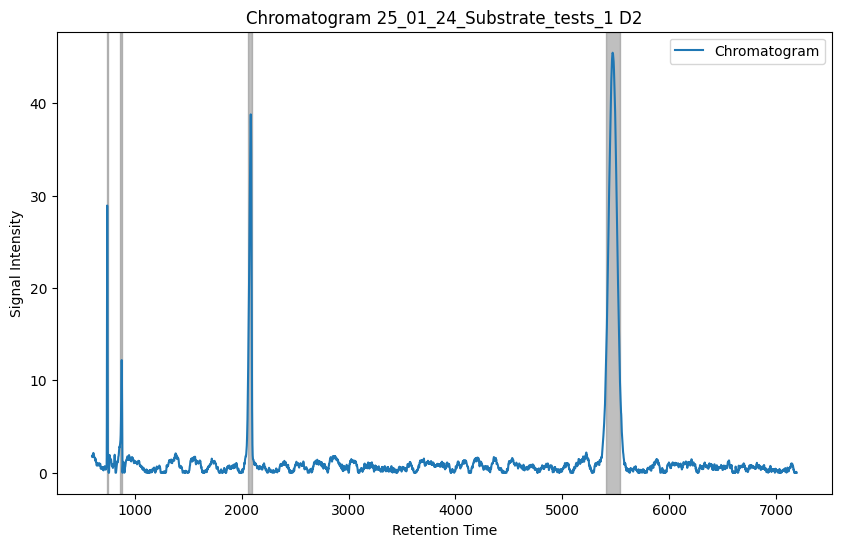

D3


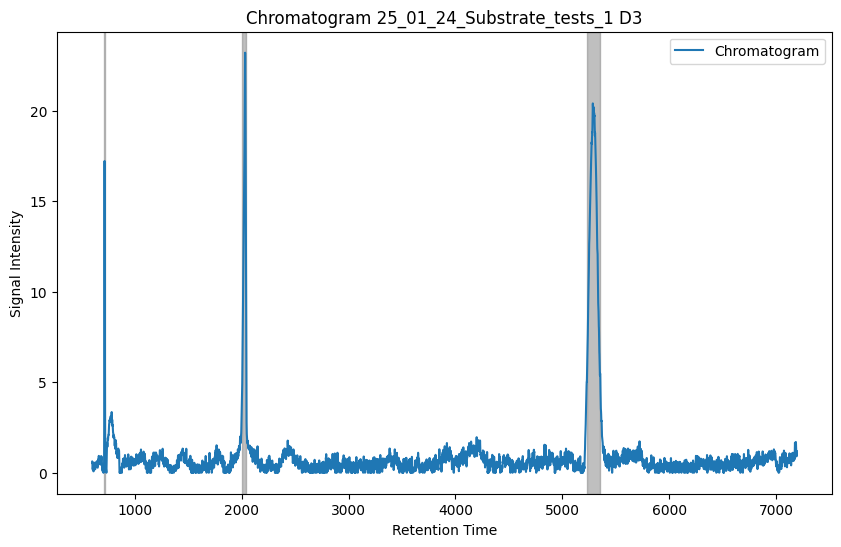

D4


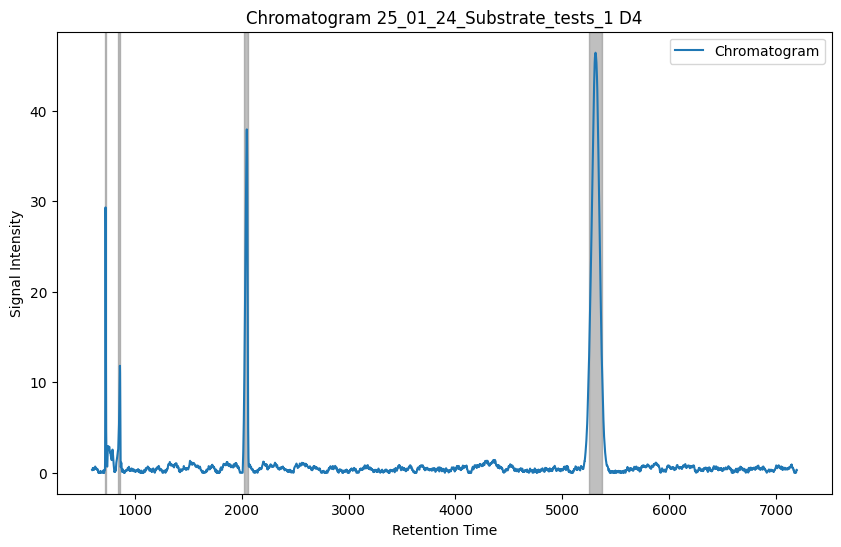

D5


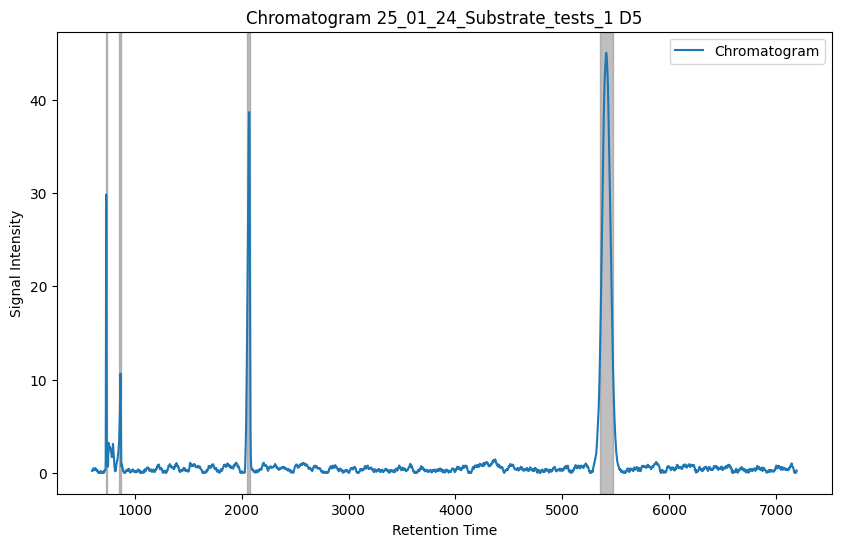

D6


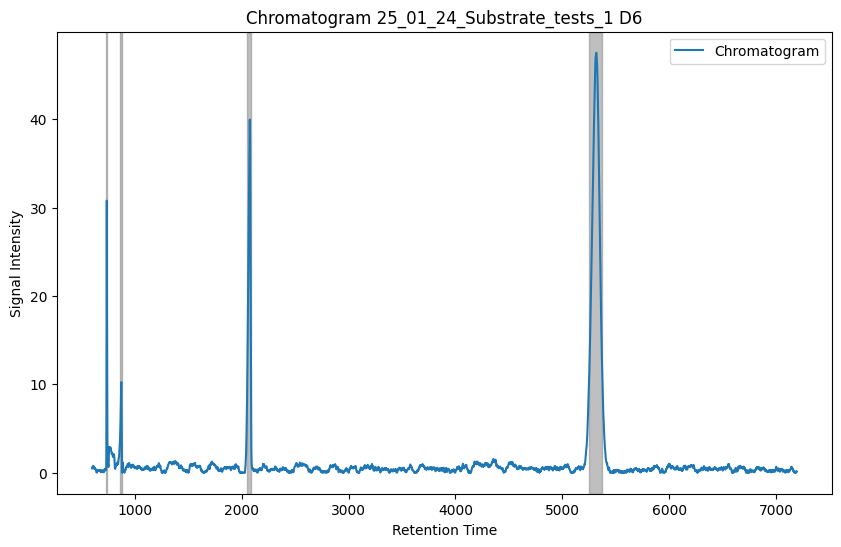

D7


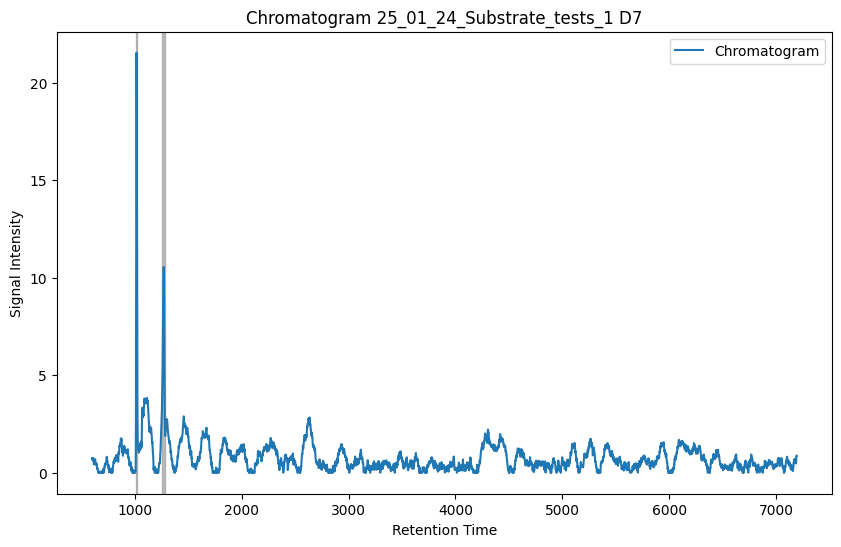

D8


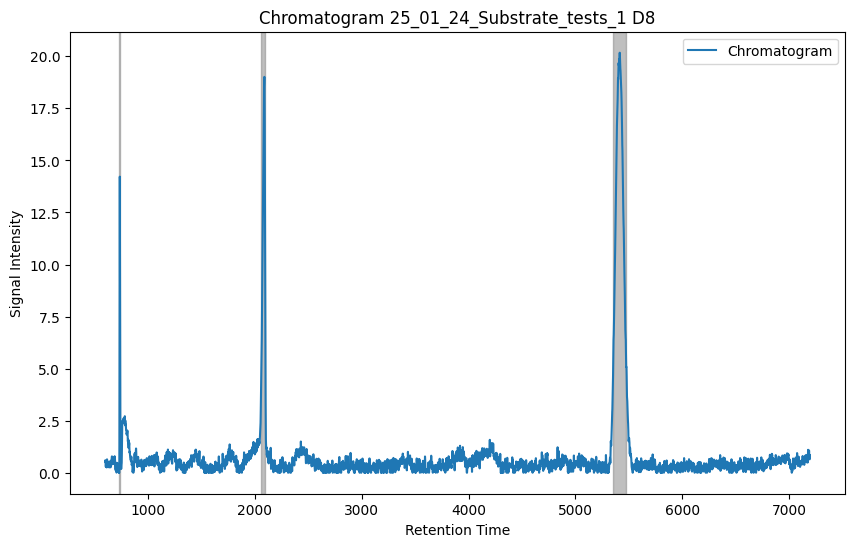

D9


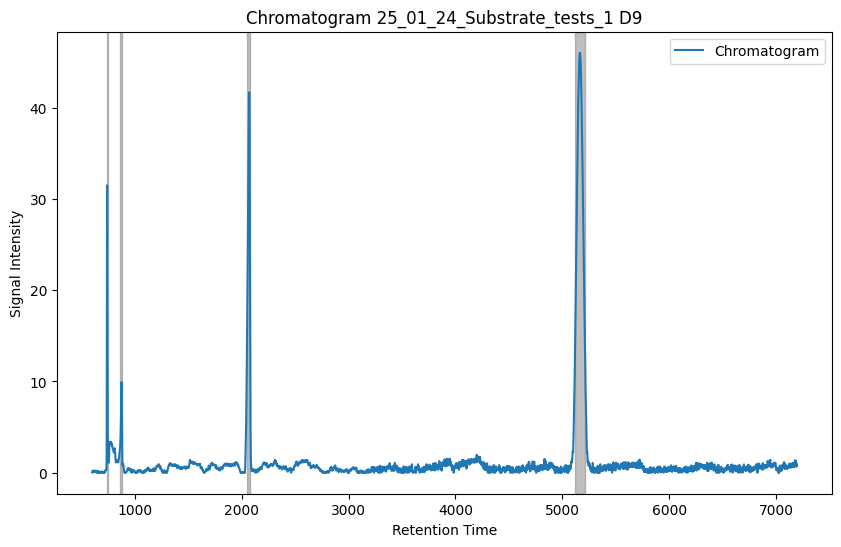

D10


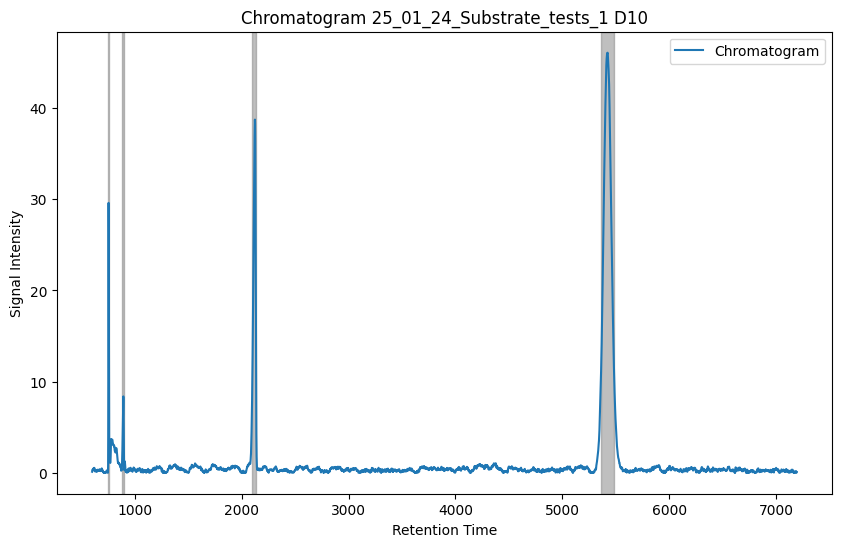

D11


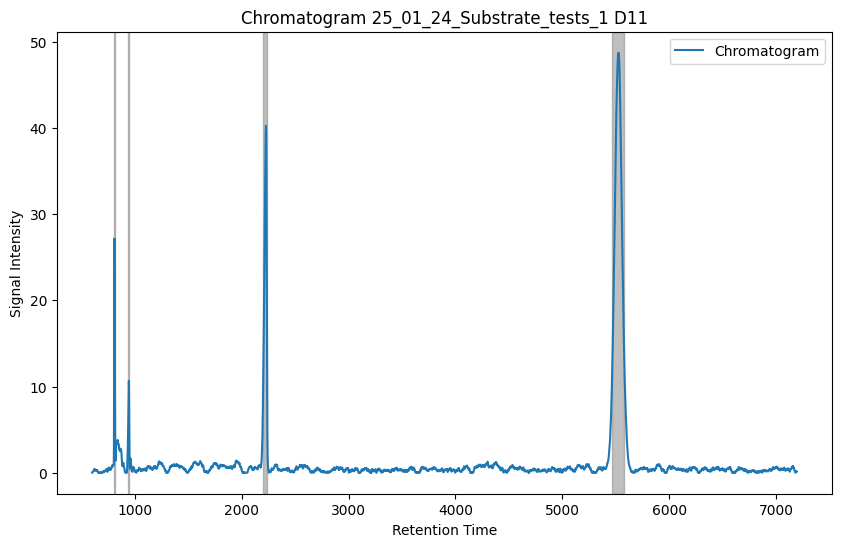

D12


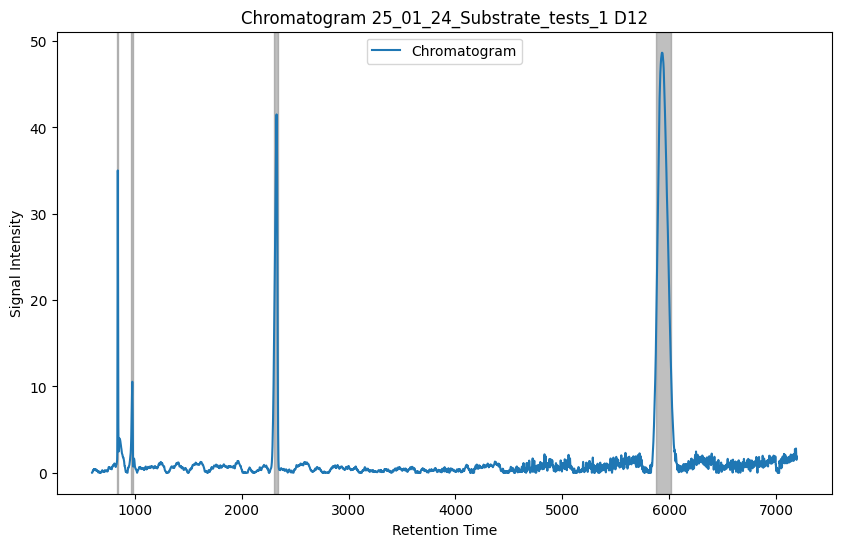

E1


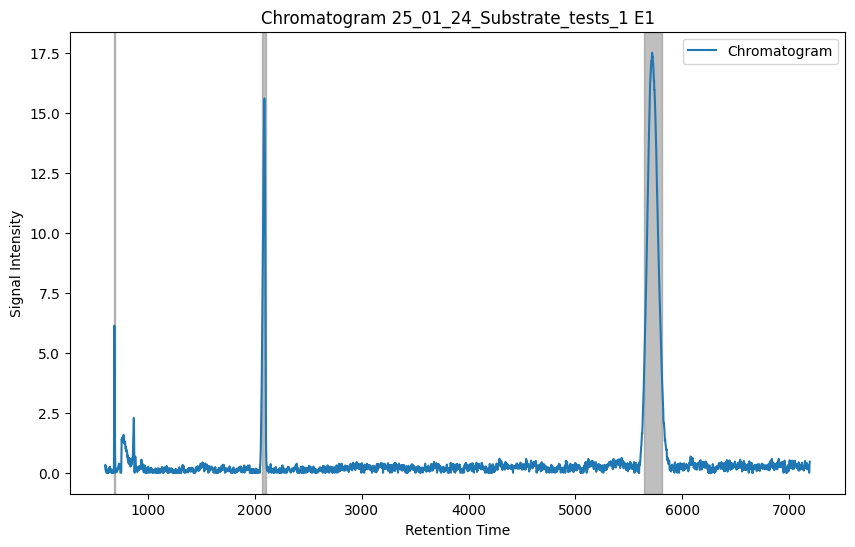

E2


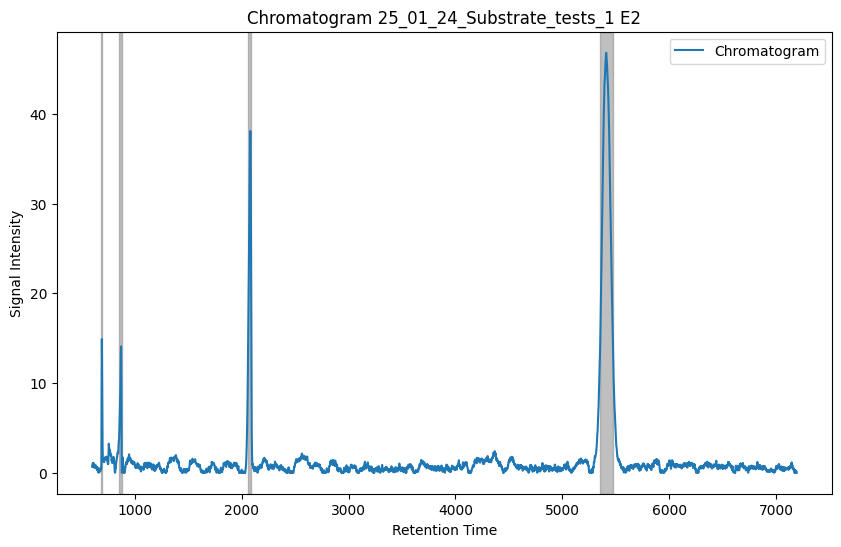

E3


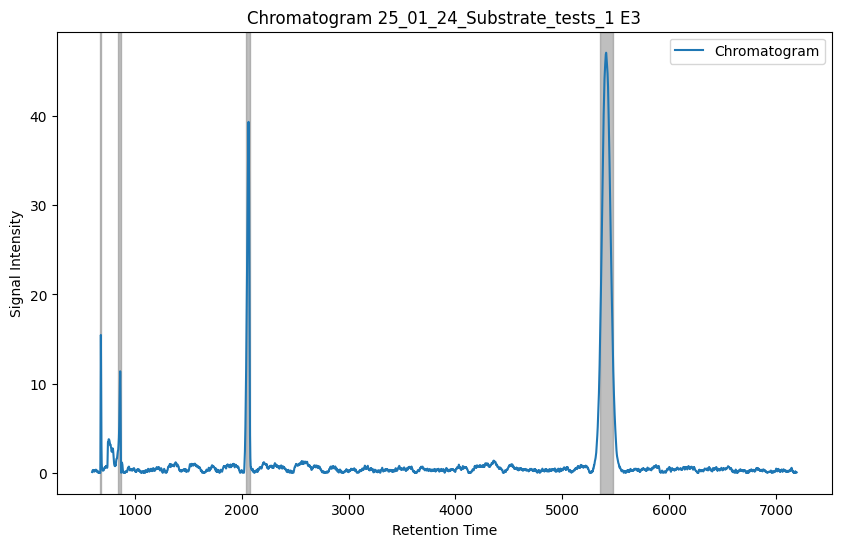

E4


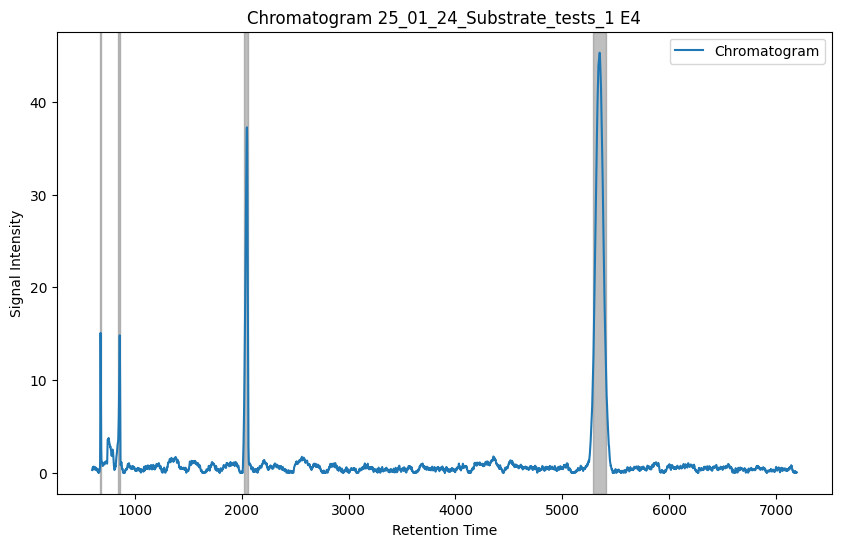

E5


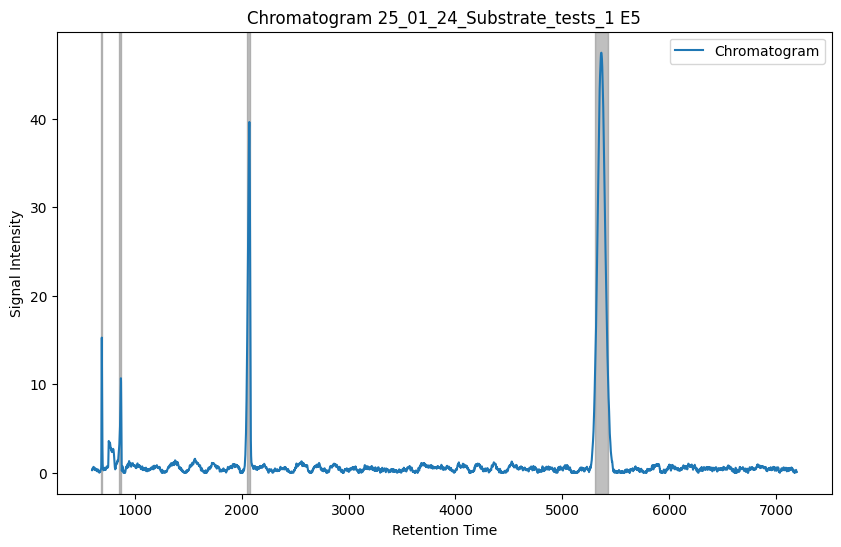

E6


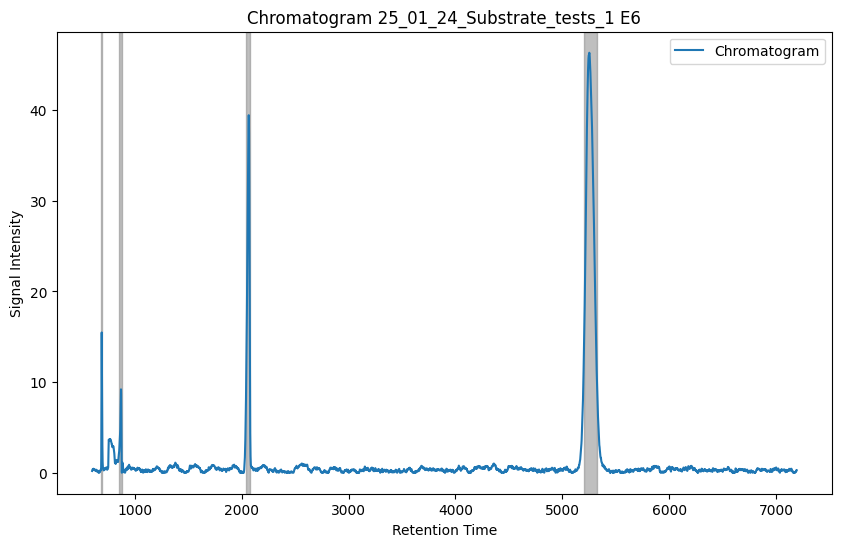

E7


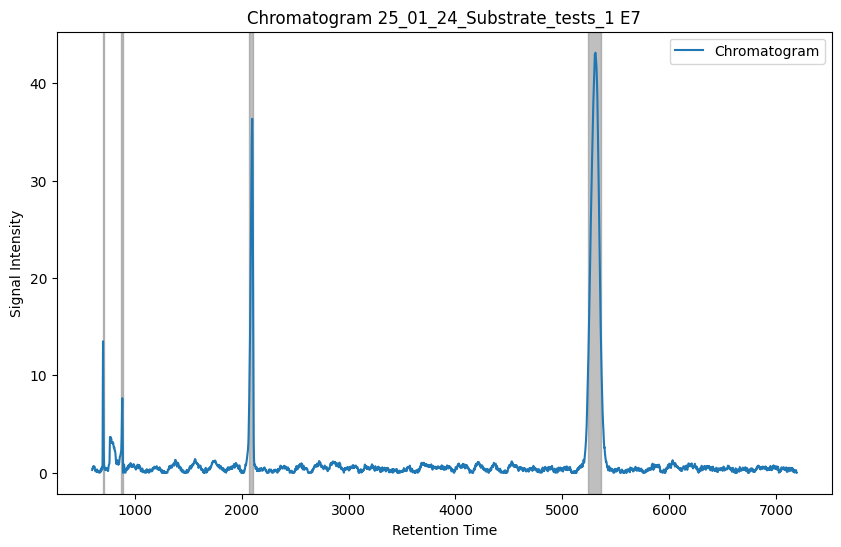

E8


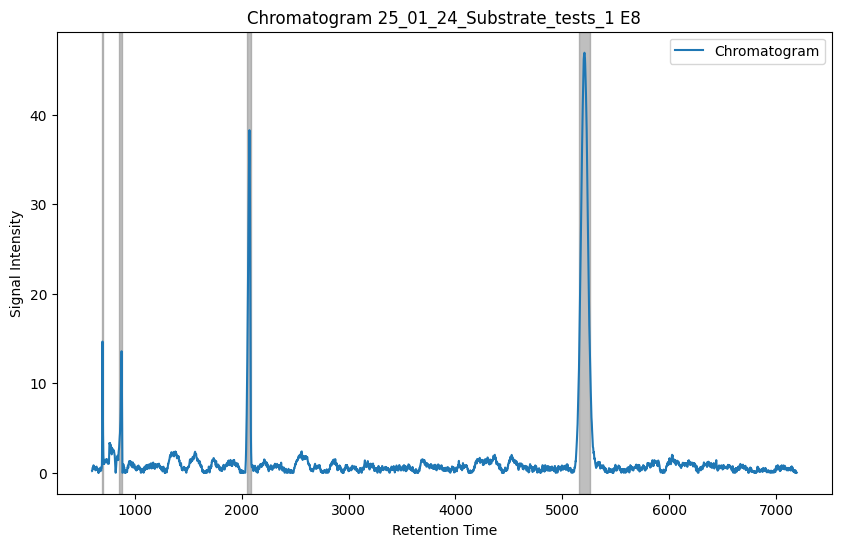

E9


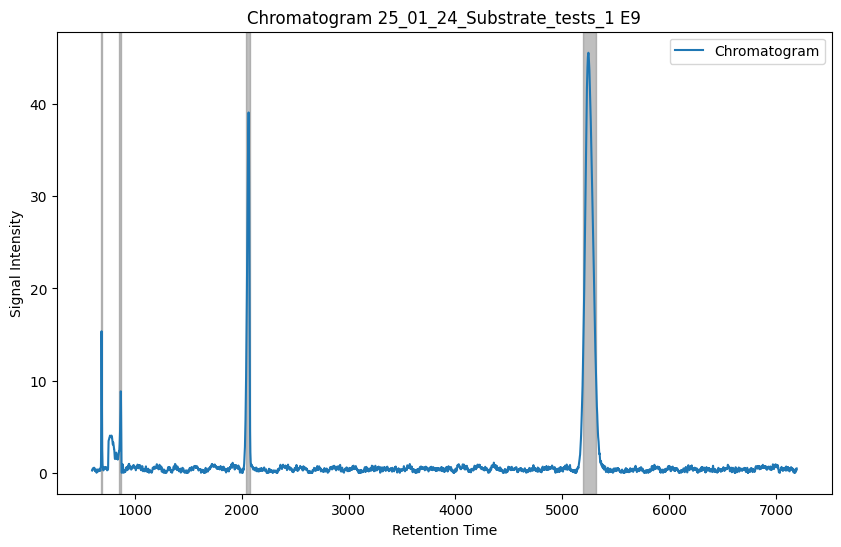

E10


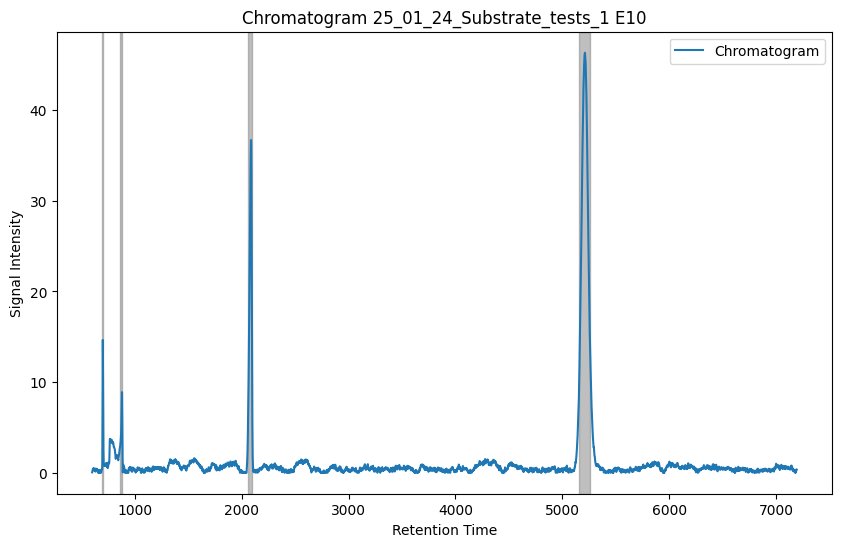

E11


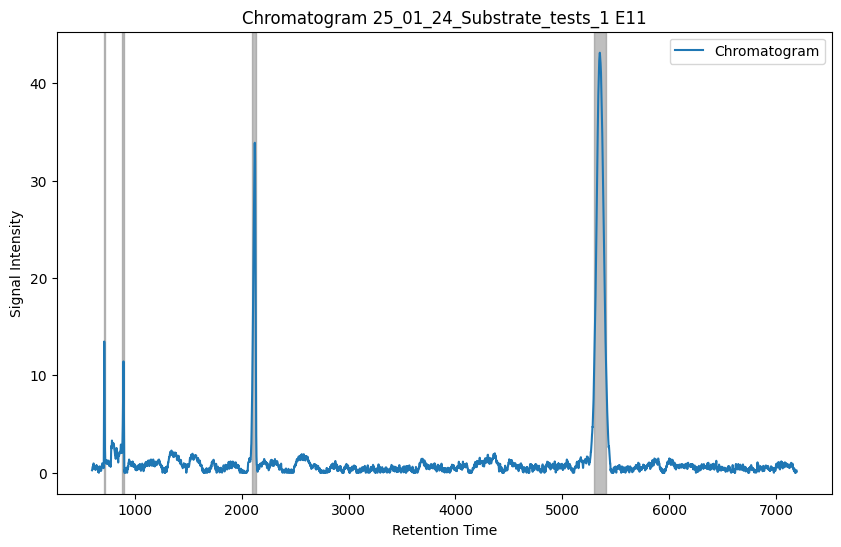

E12


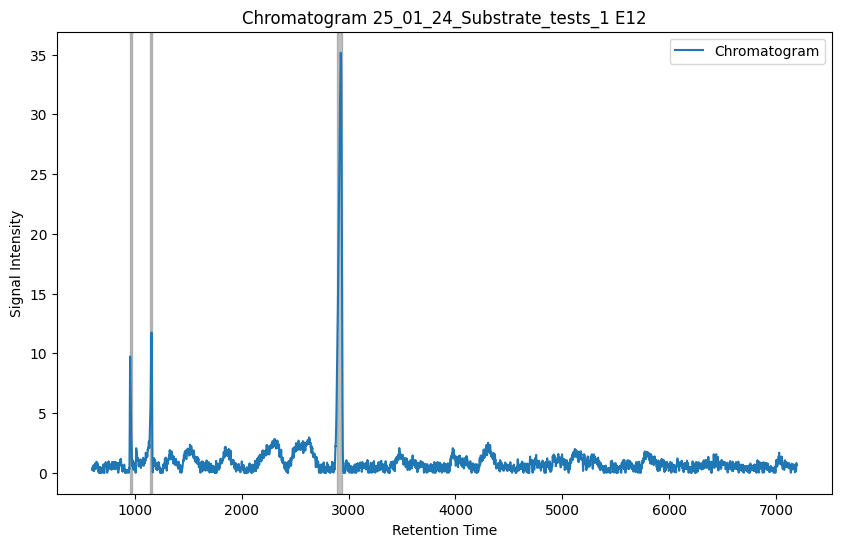

F1


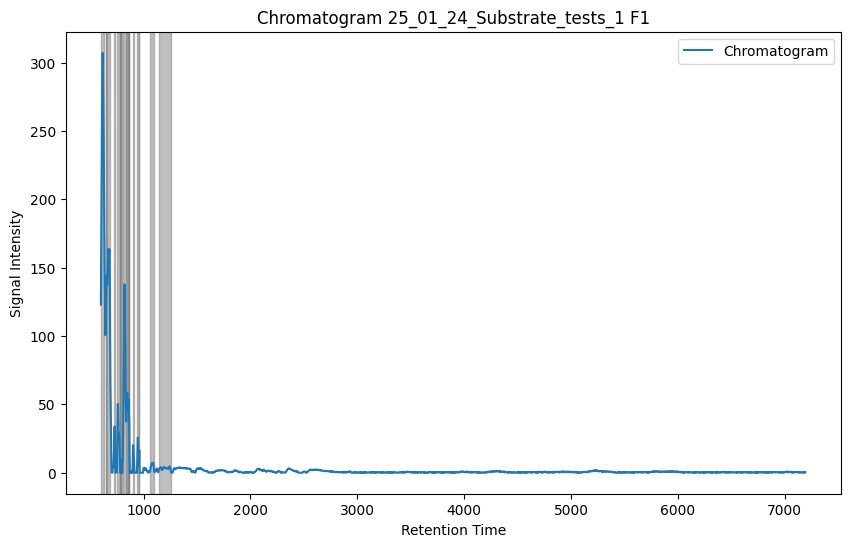

F2


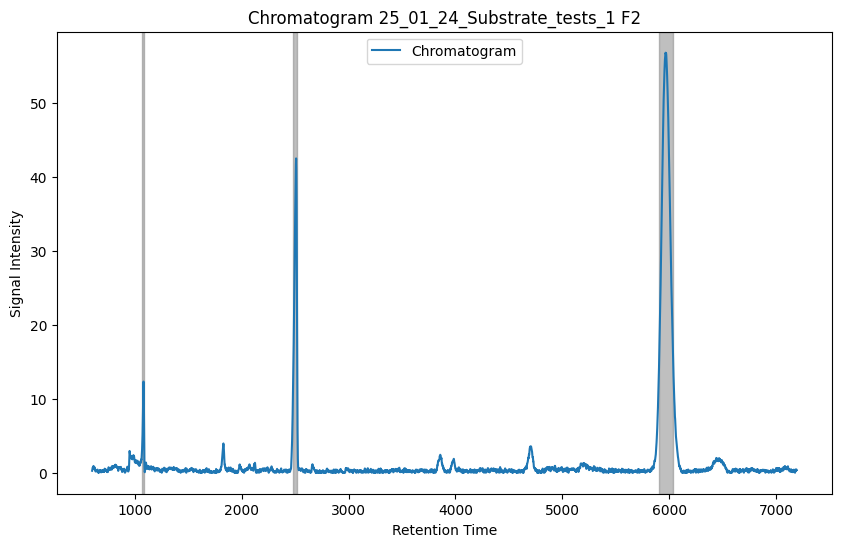

F3


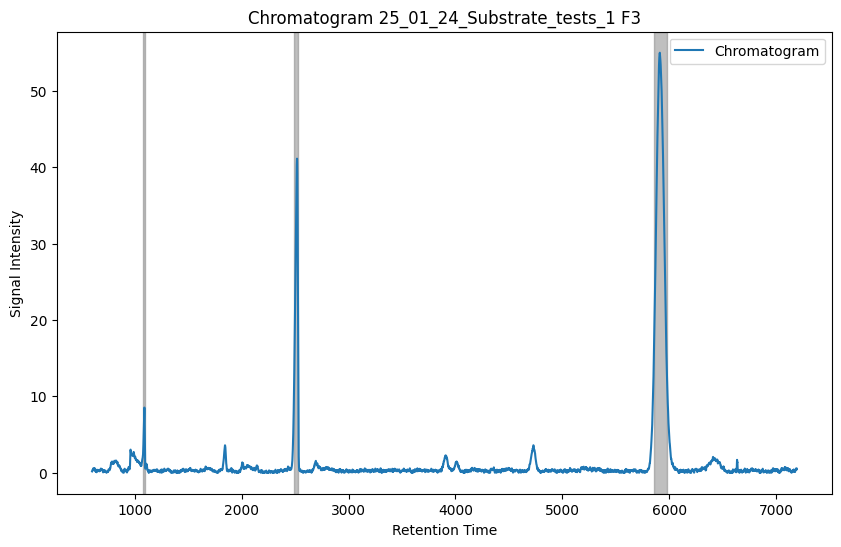

F4


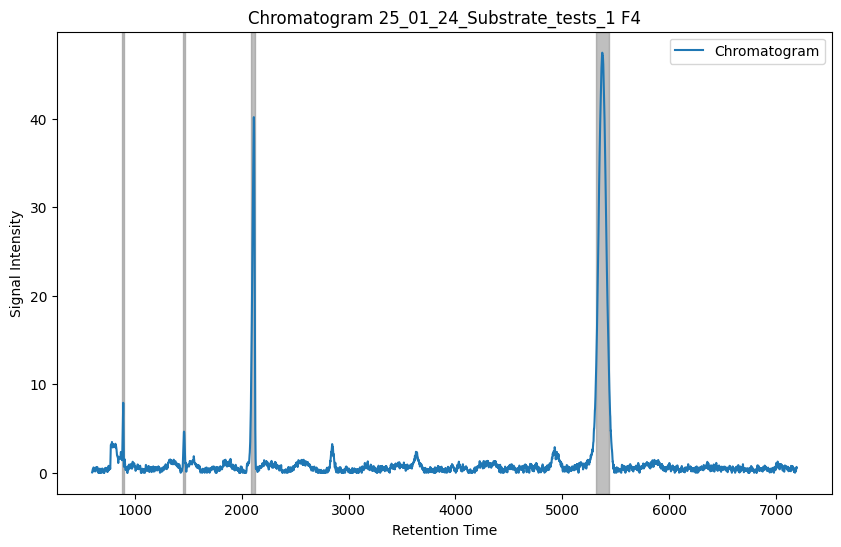

F5


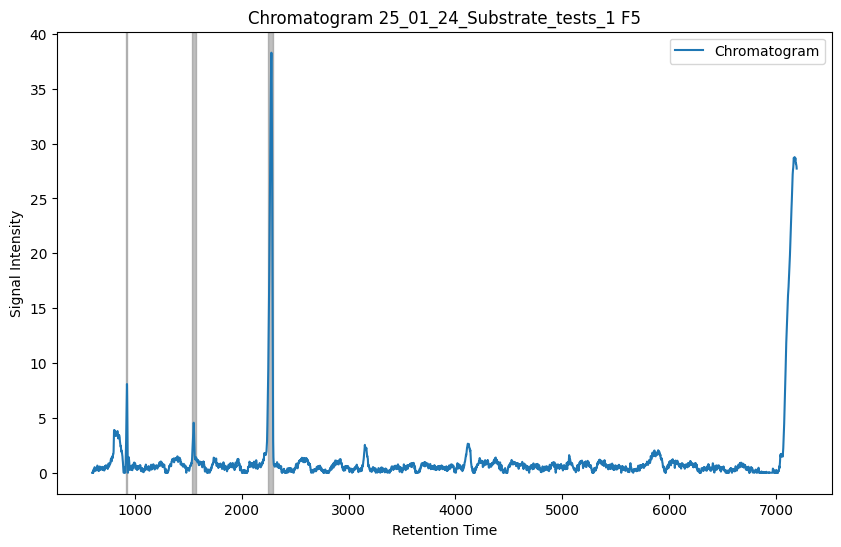

F6


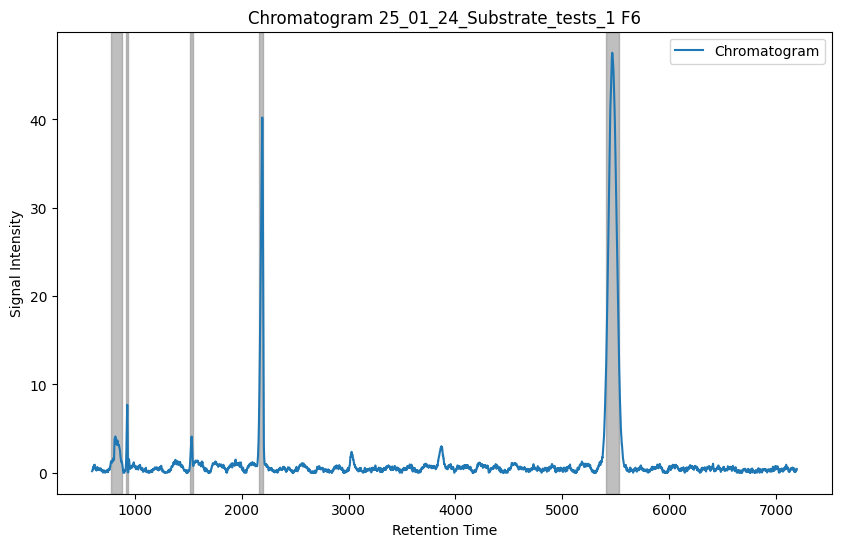

F7


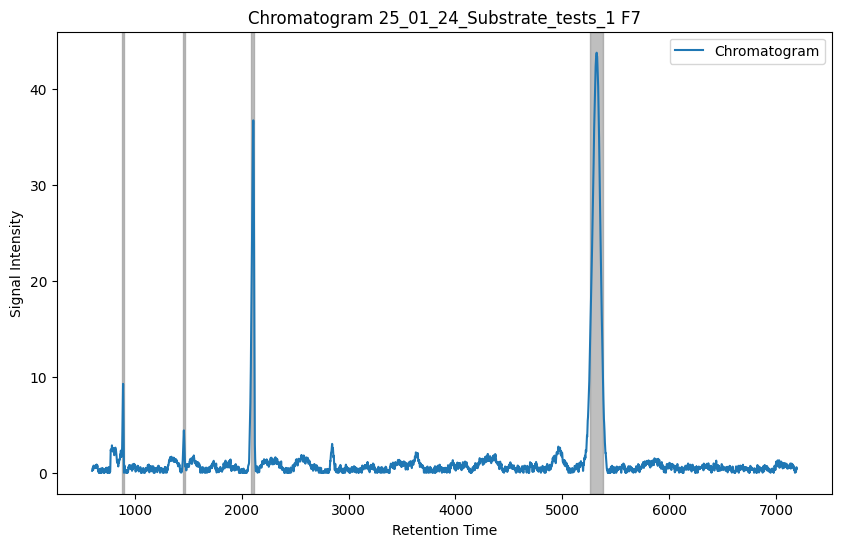

F8


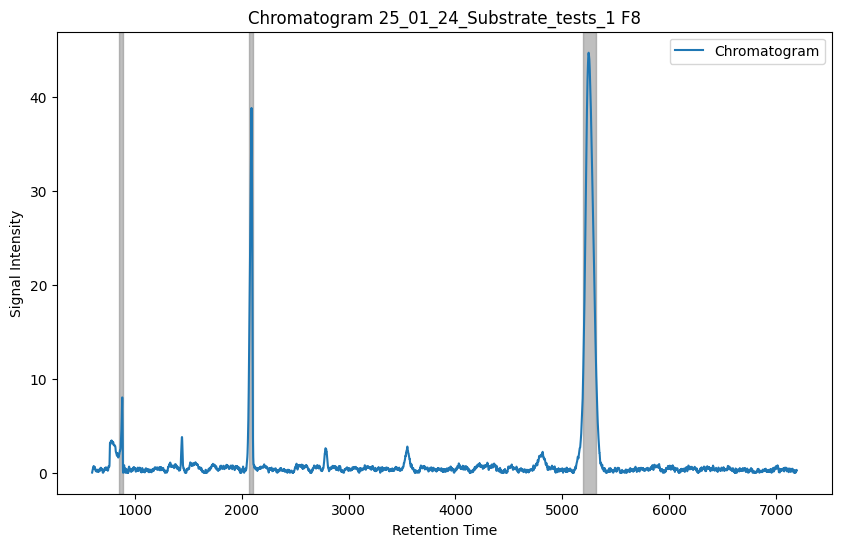

F9


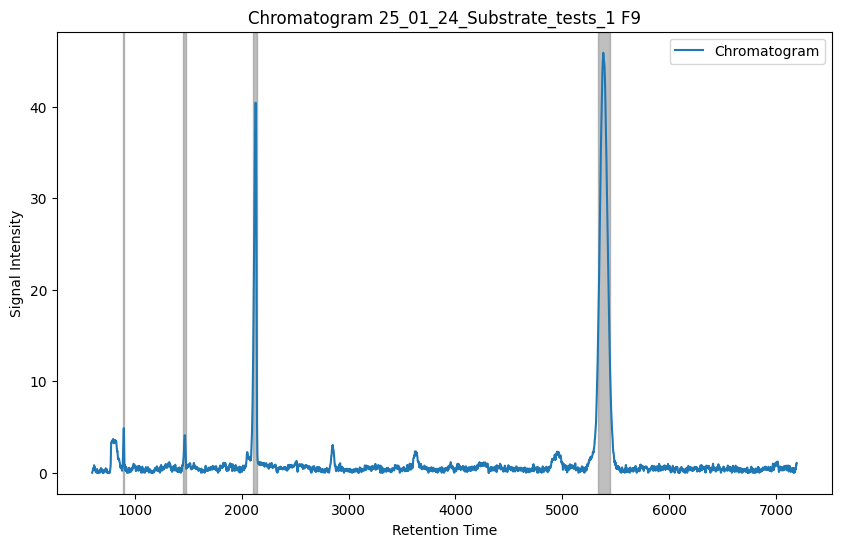

F10


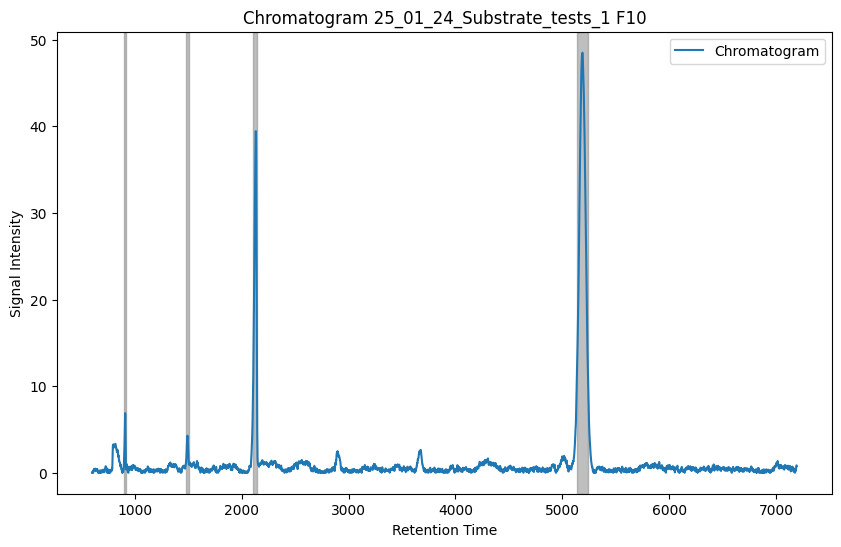

F11


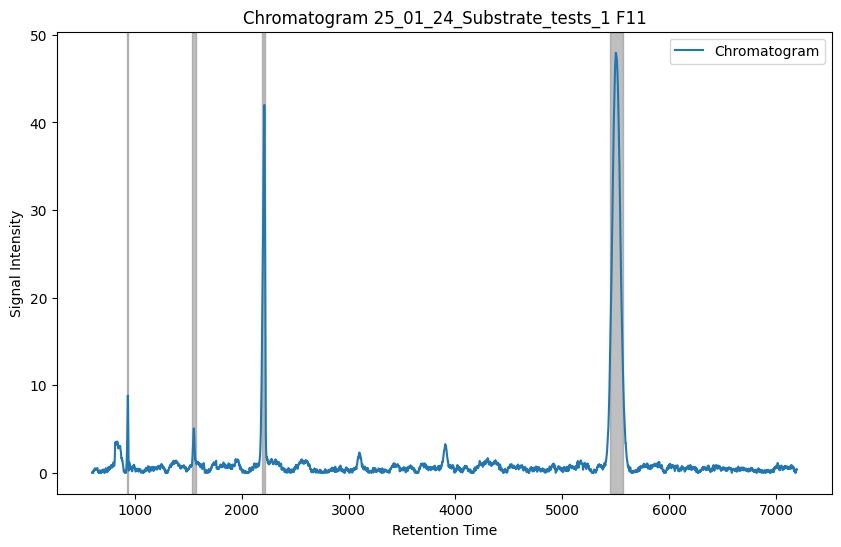

F12


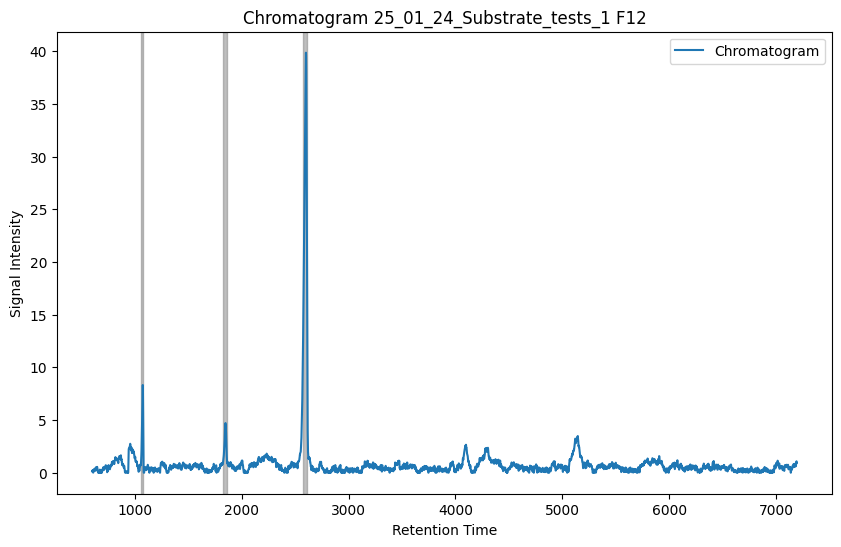

G1


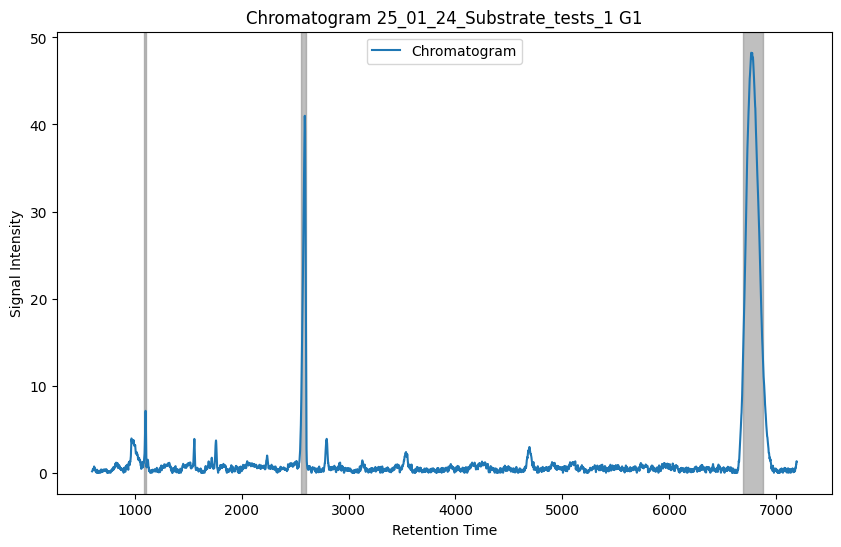

G2


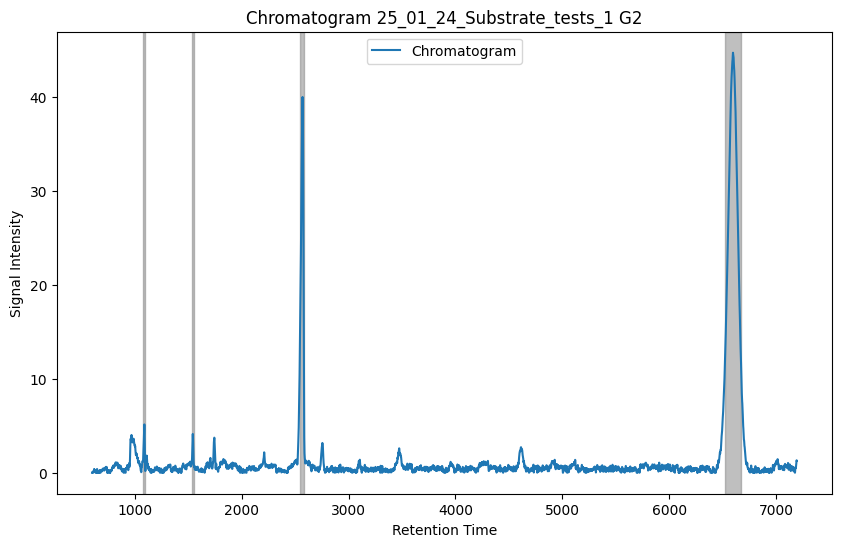

G3


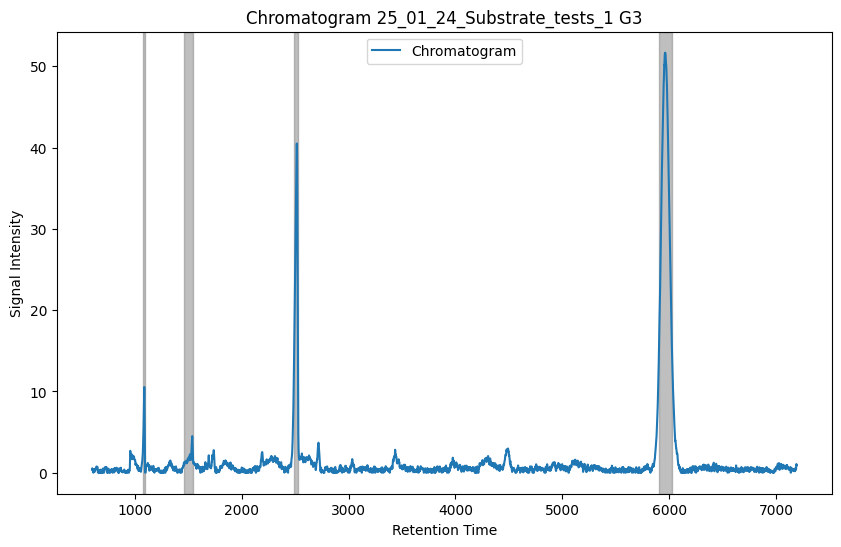

G4


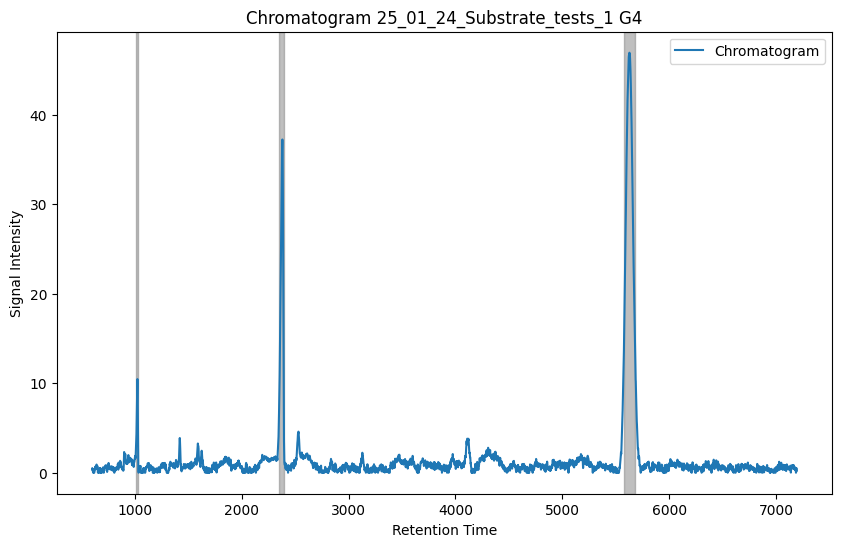

G5


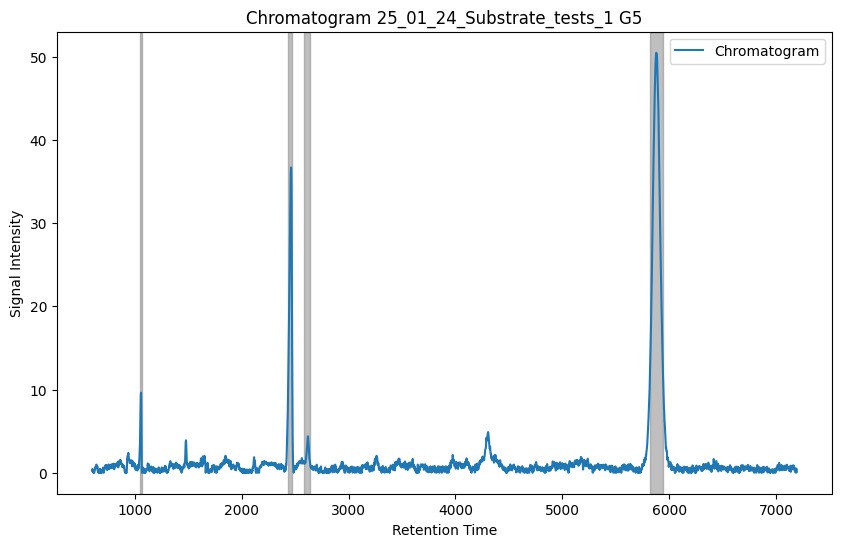

G6


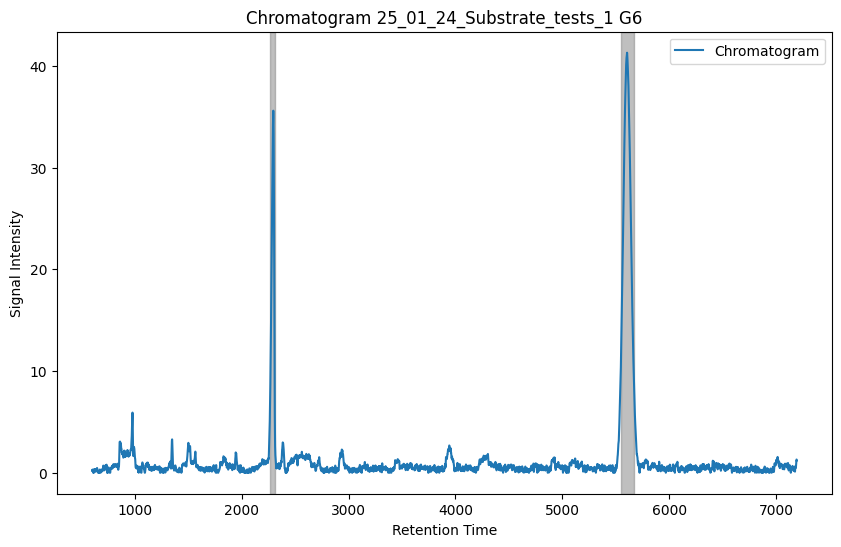

G7


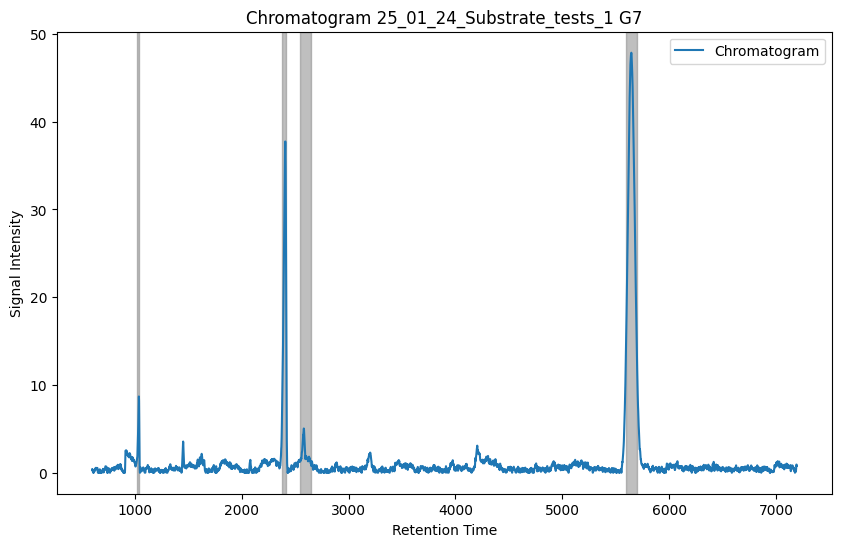

G8


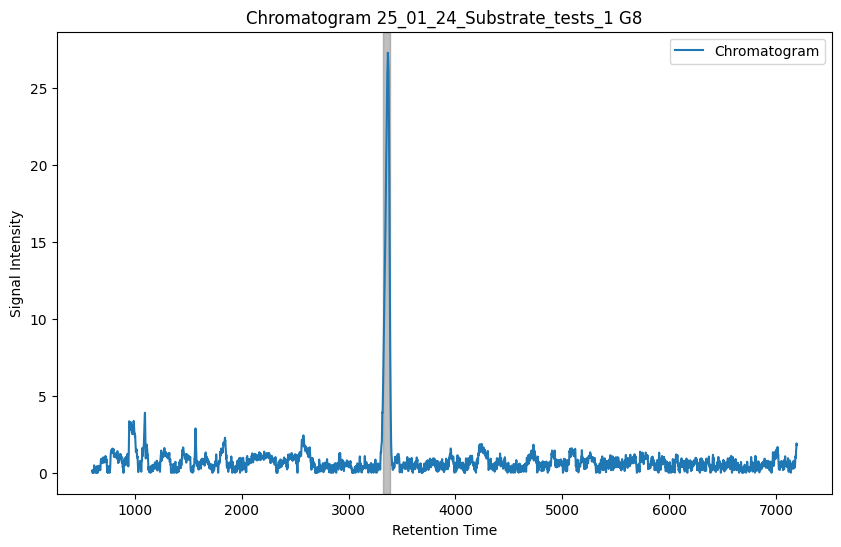

G9


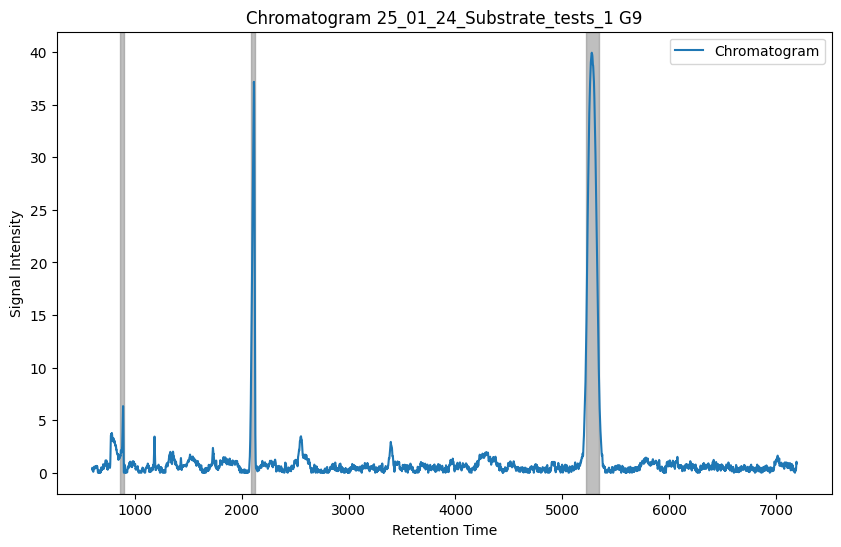

G10


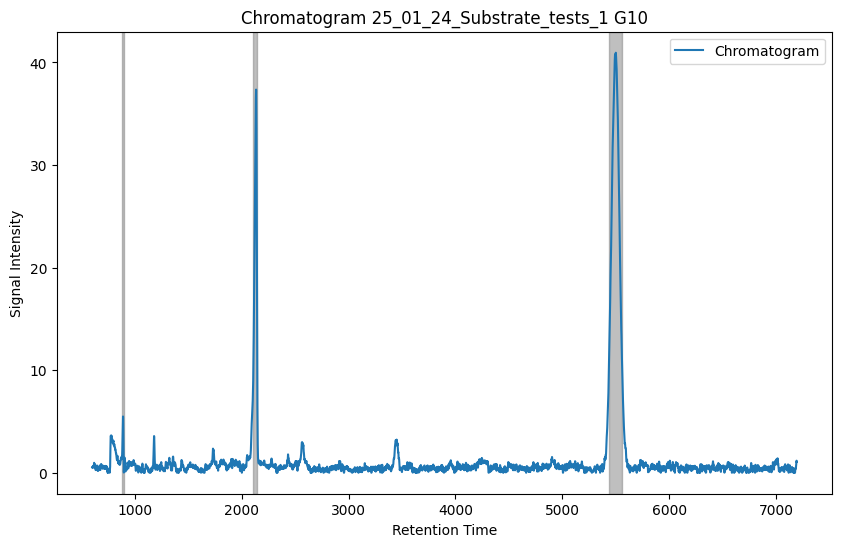

G11


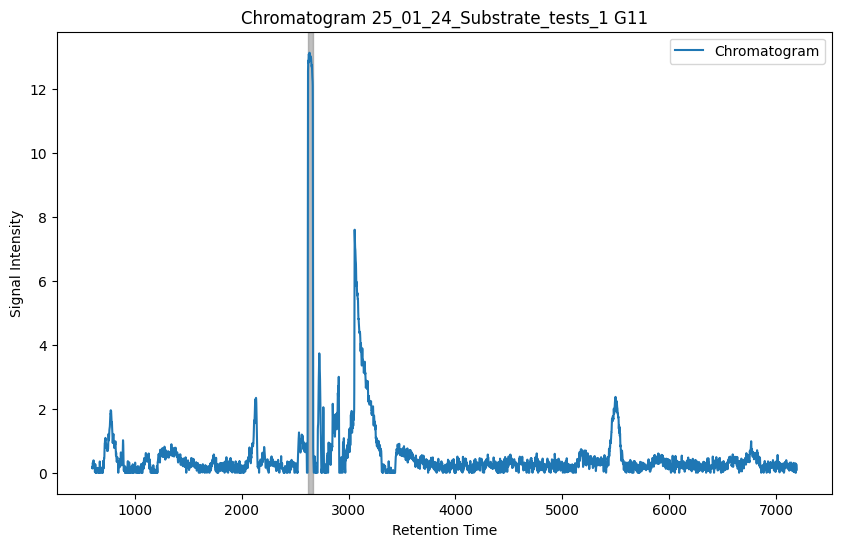

G12


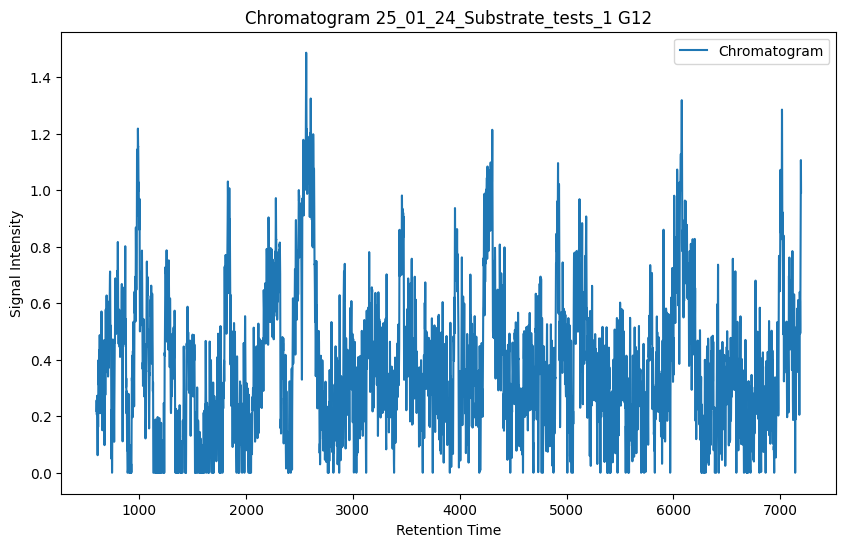

H1


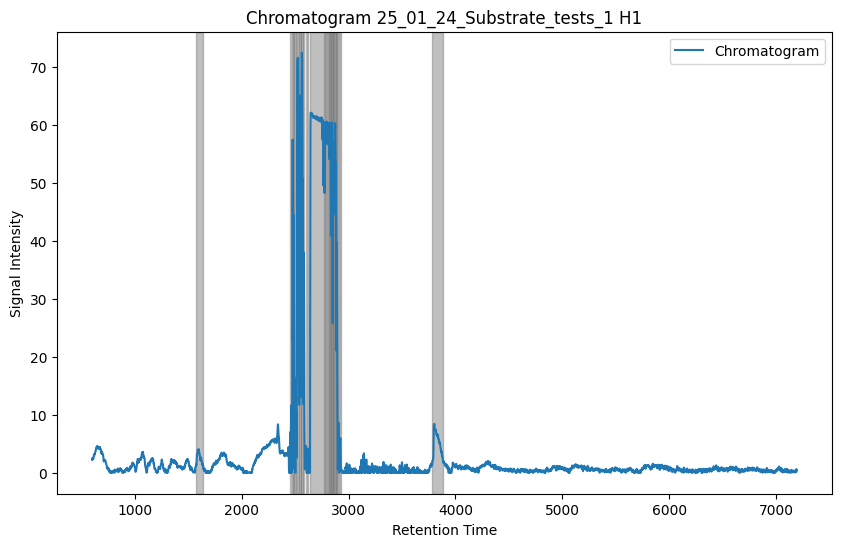

H2


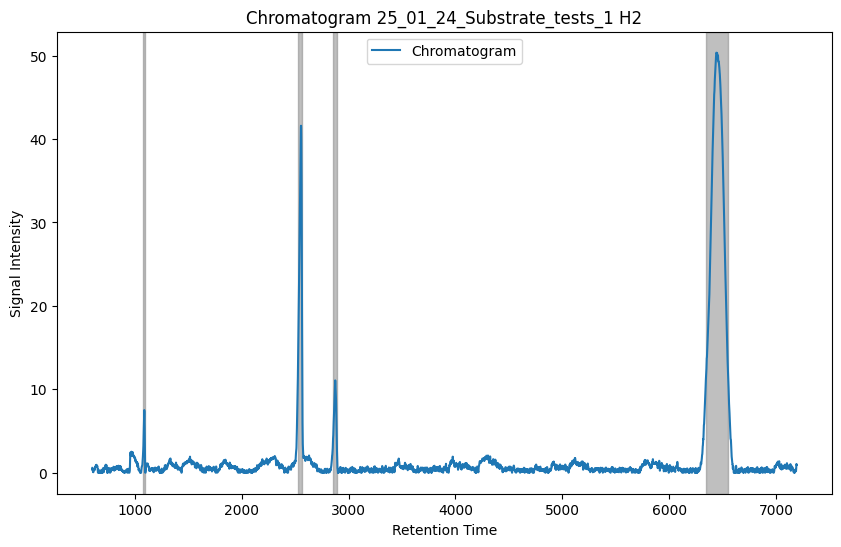

H3


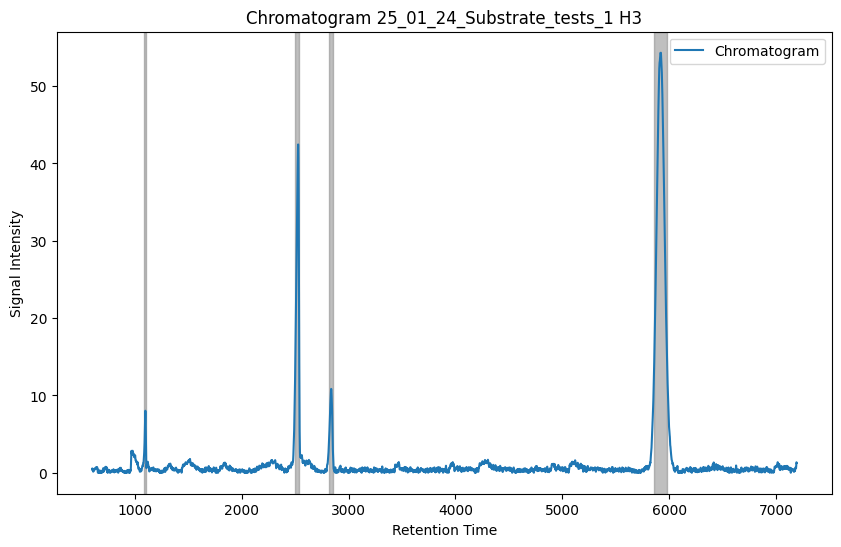

H4


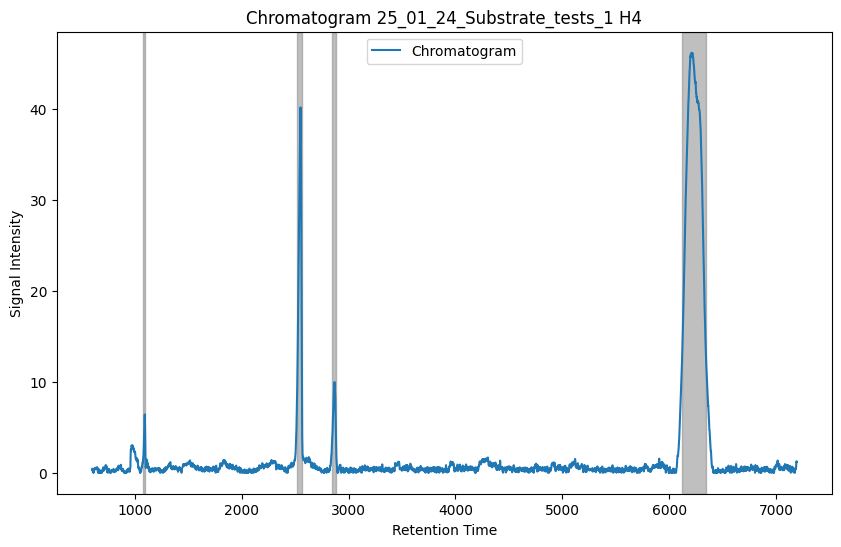

H5


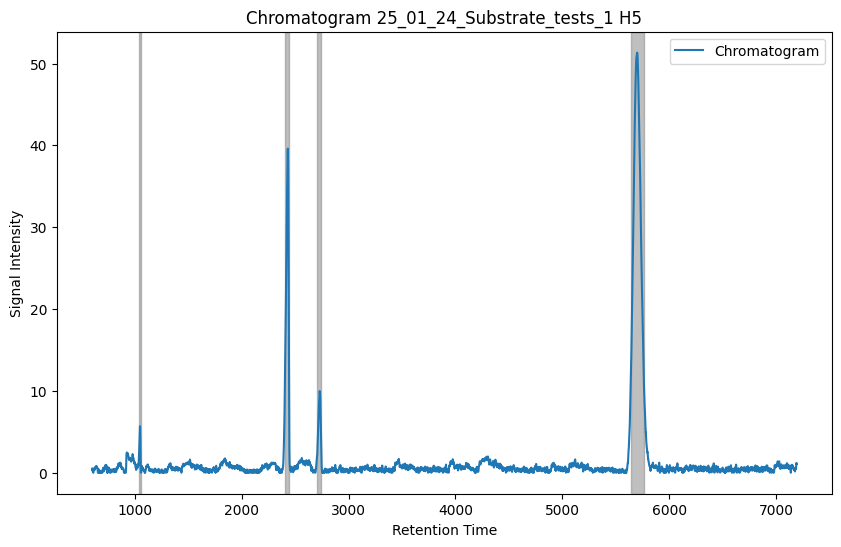

H6


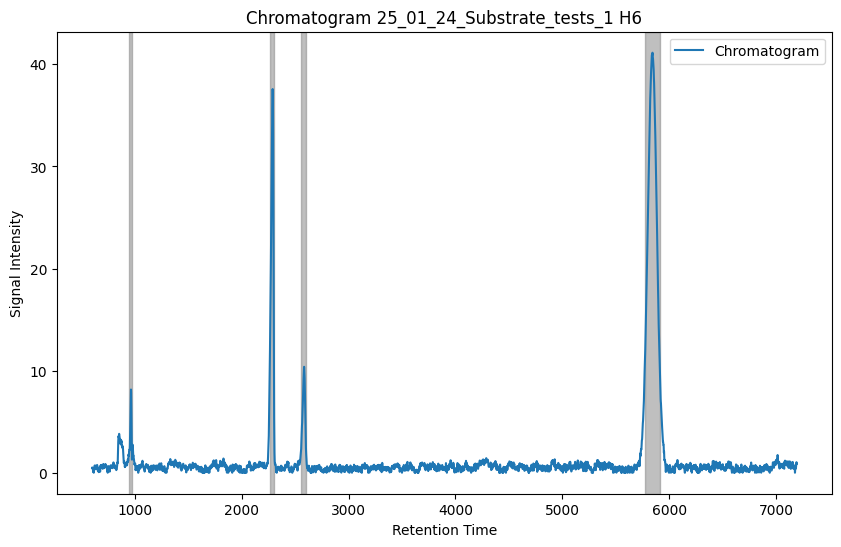

H7


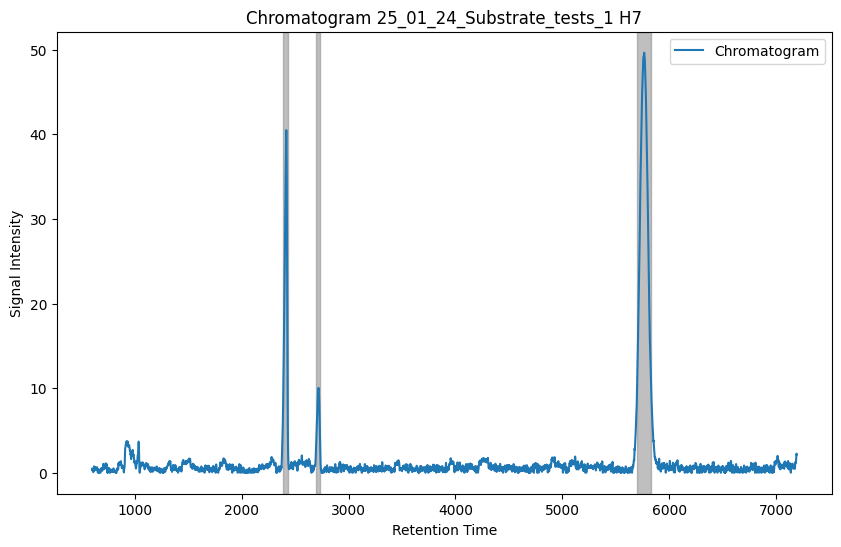

H8


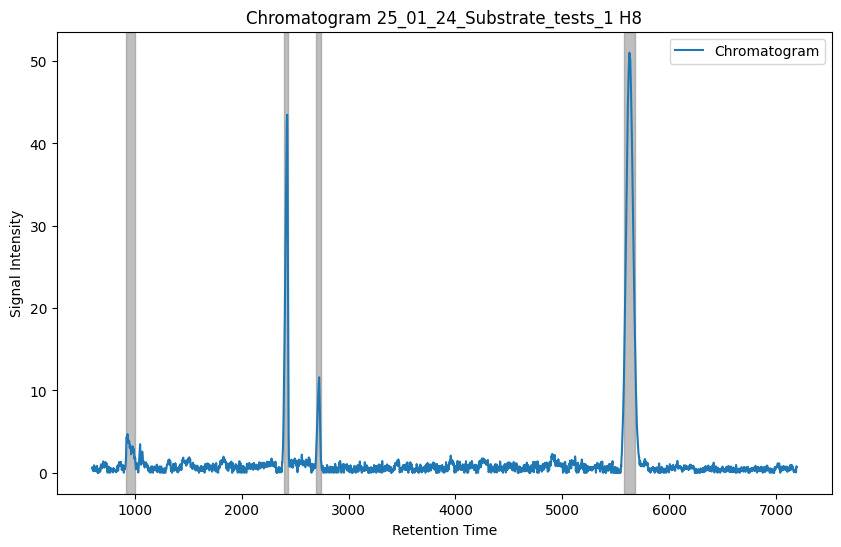

H9


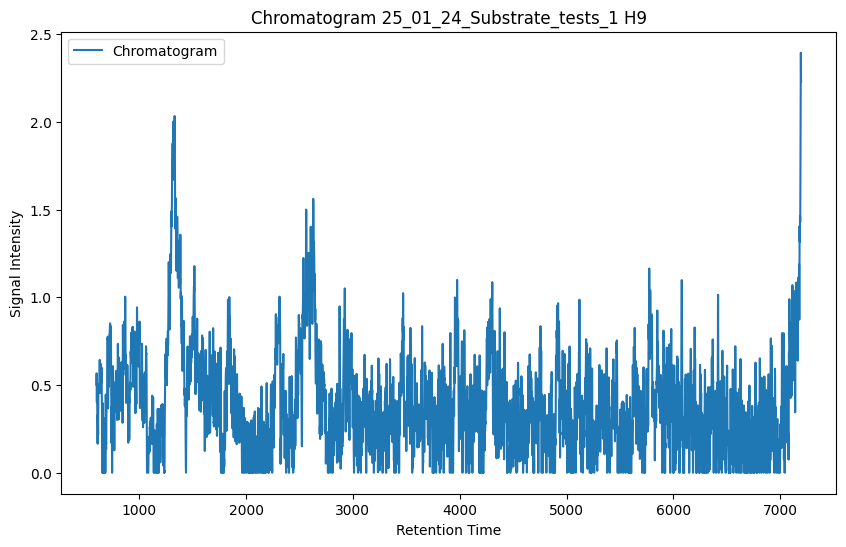

H10


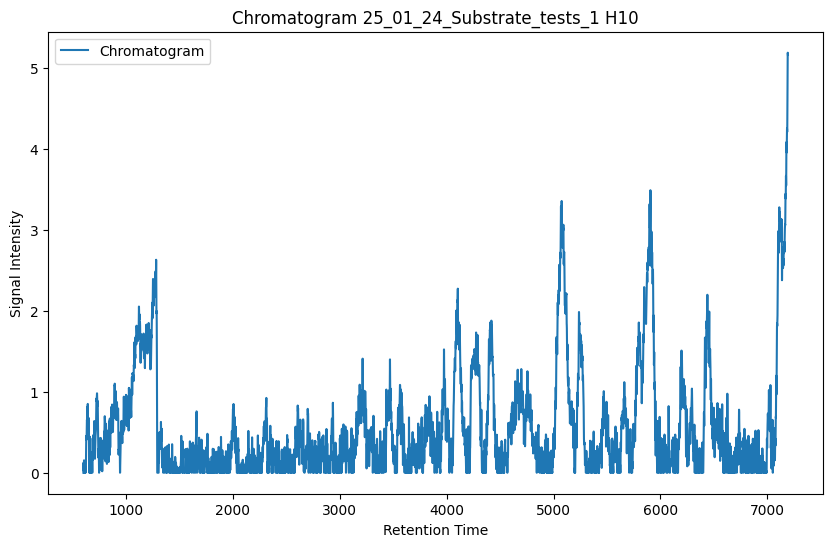

H11


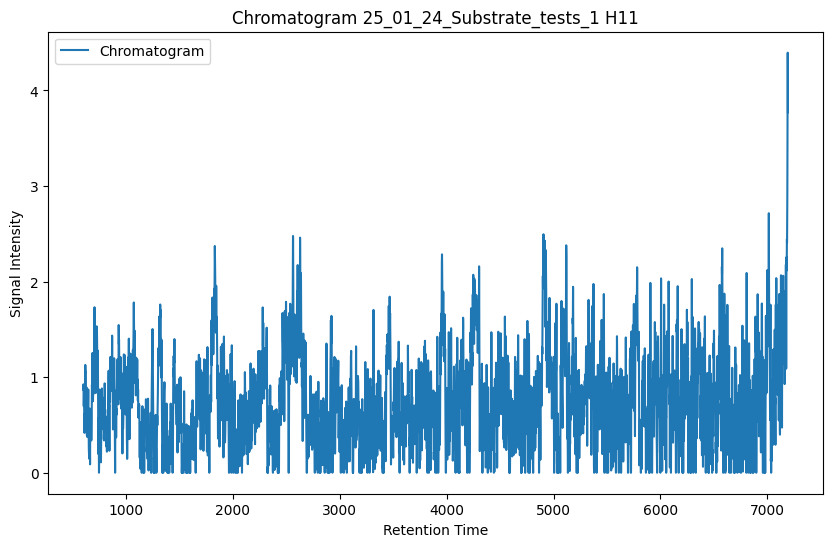

H12


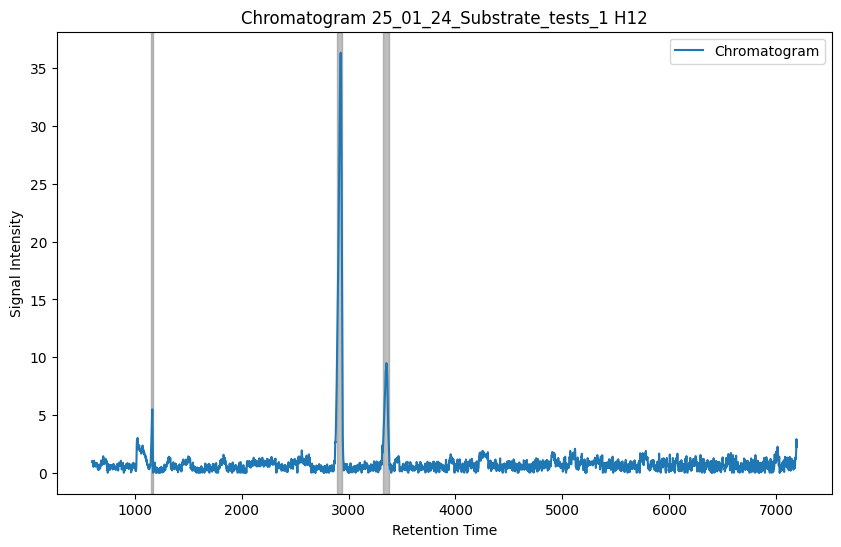

A1


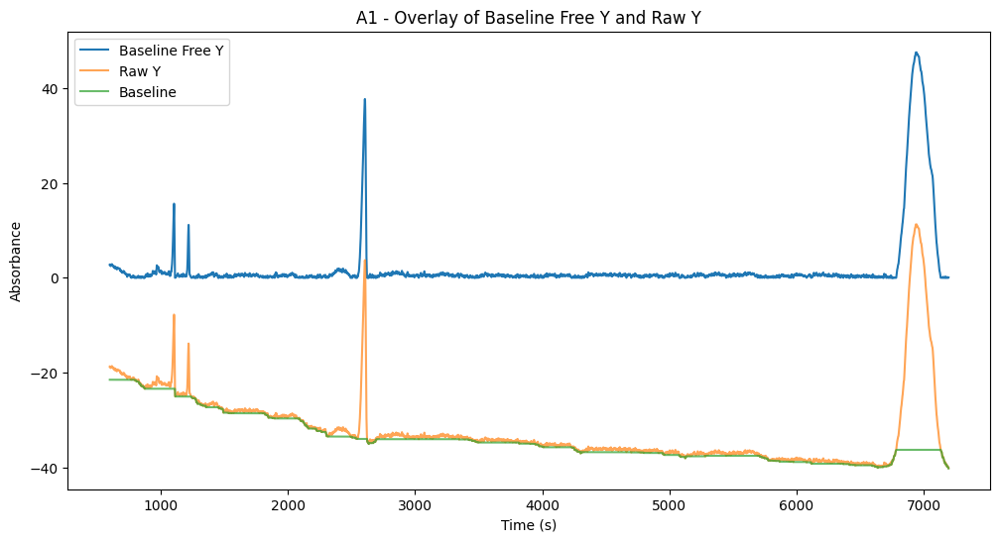

A2


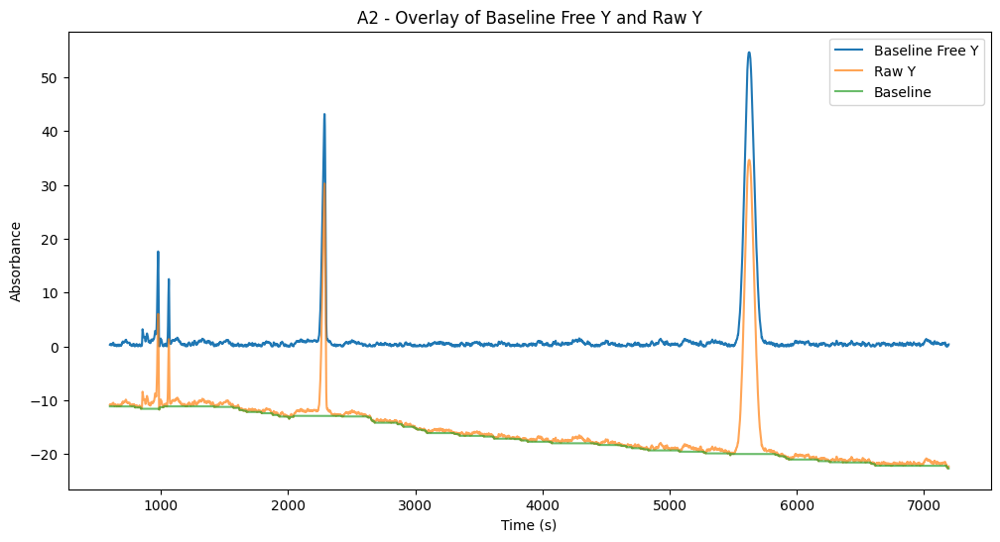

A3


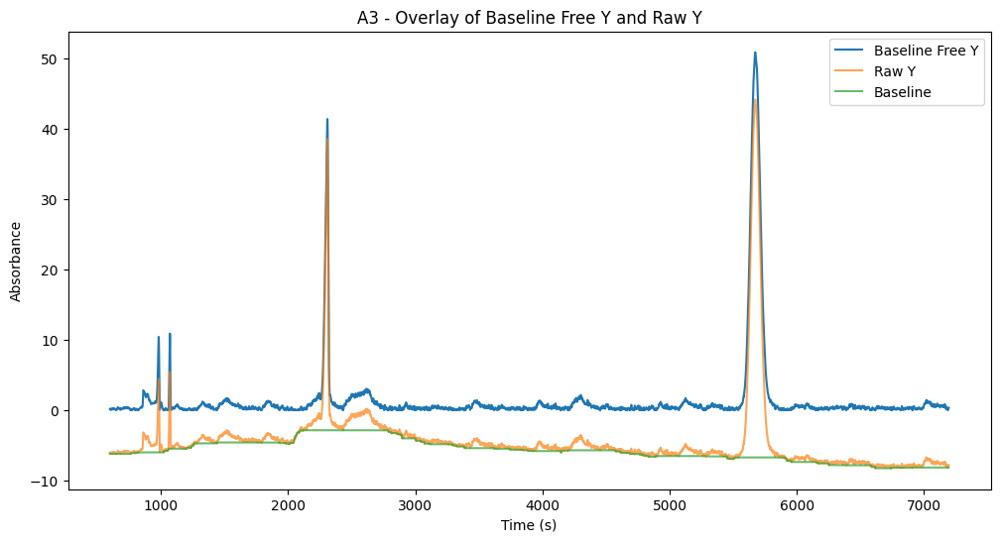

A4


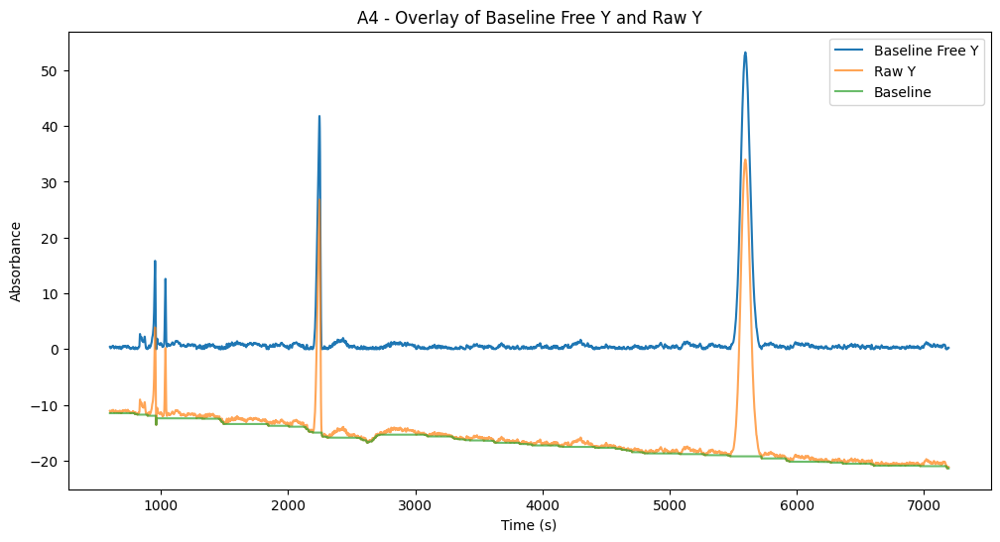

A5


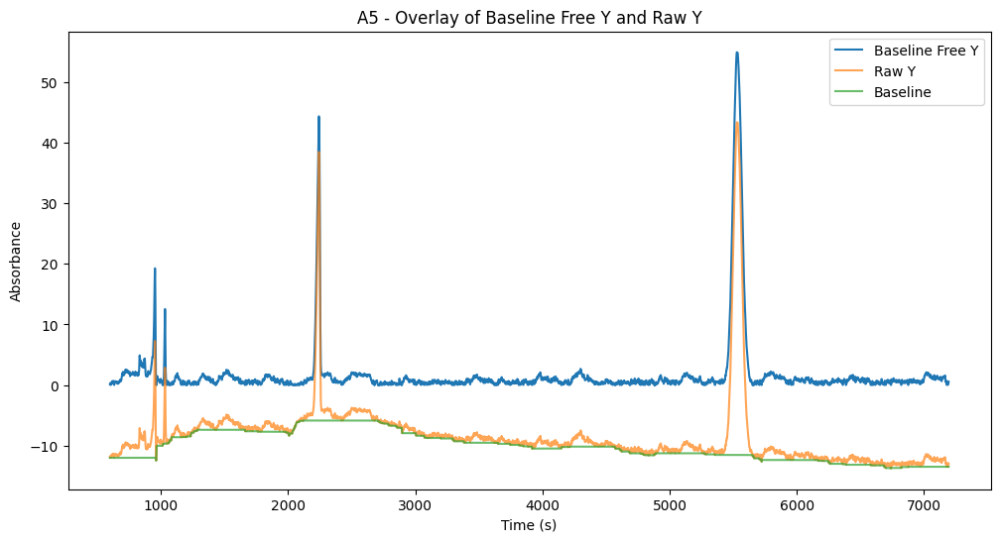

A6


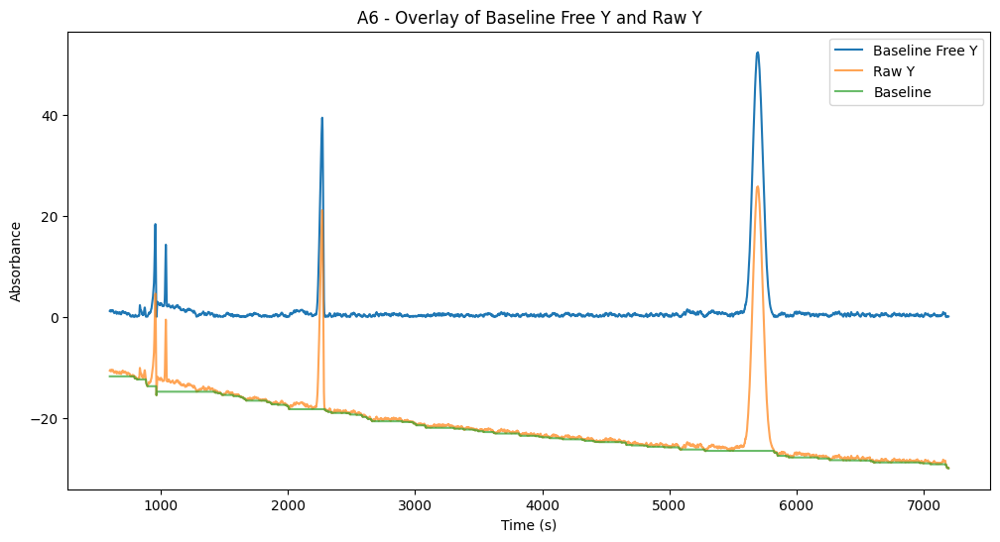

A7


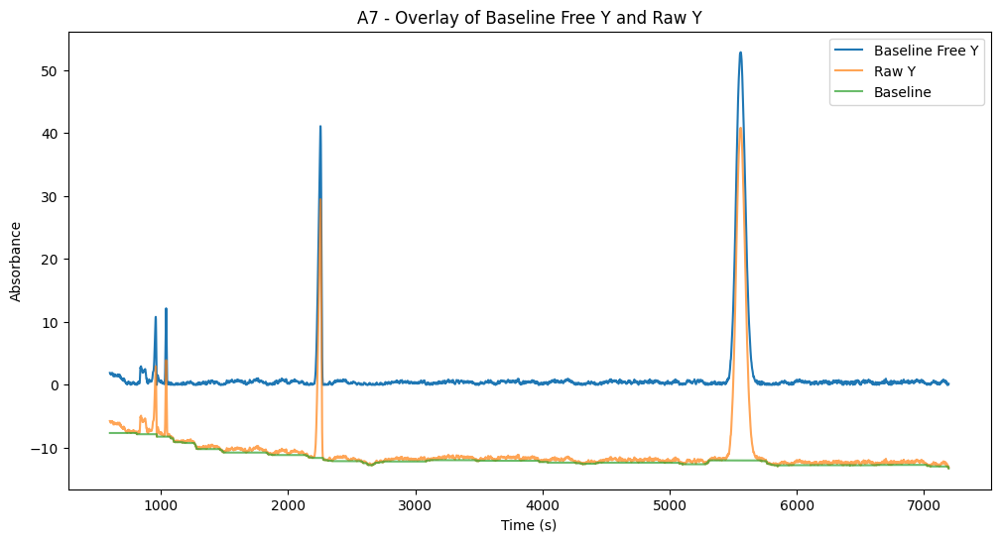

A8


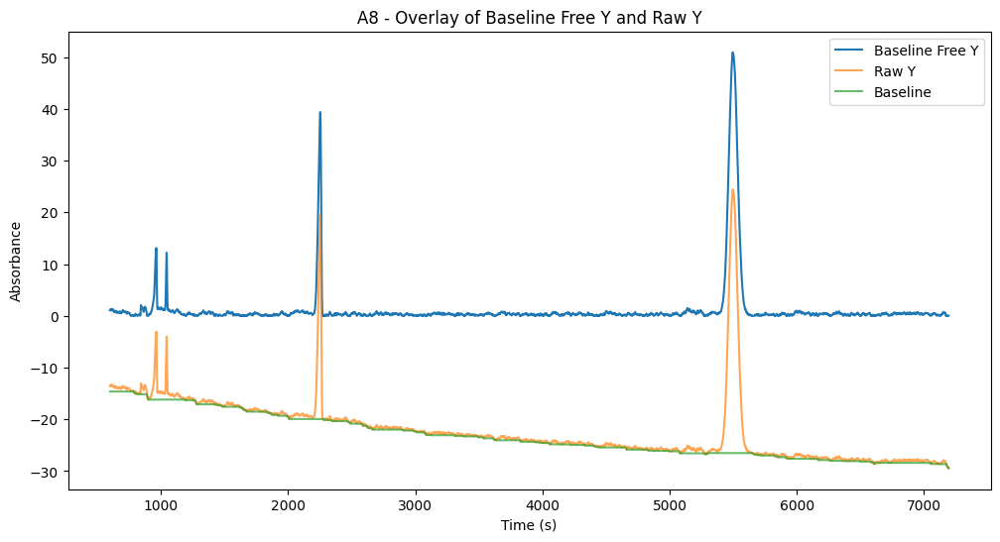

A9


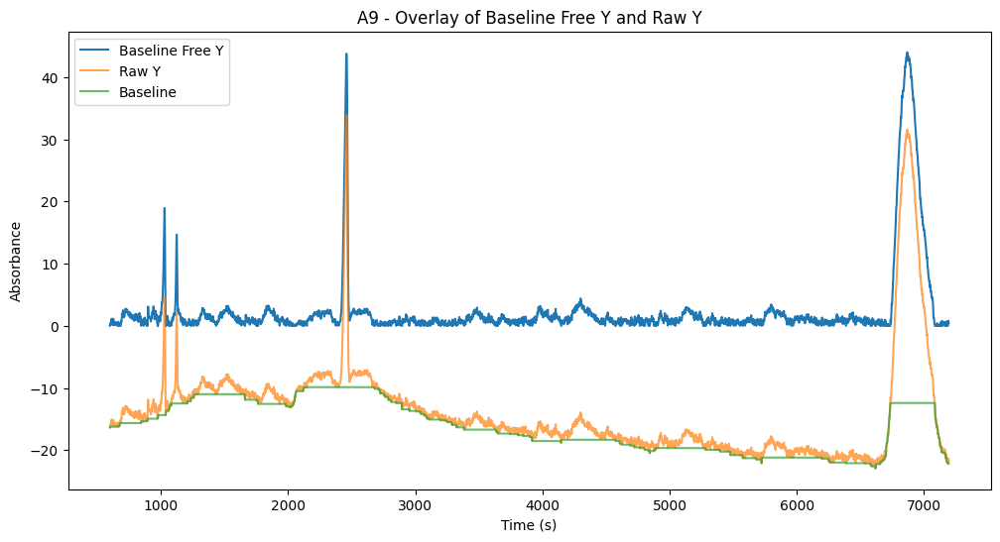

A10


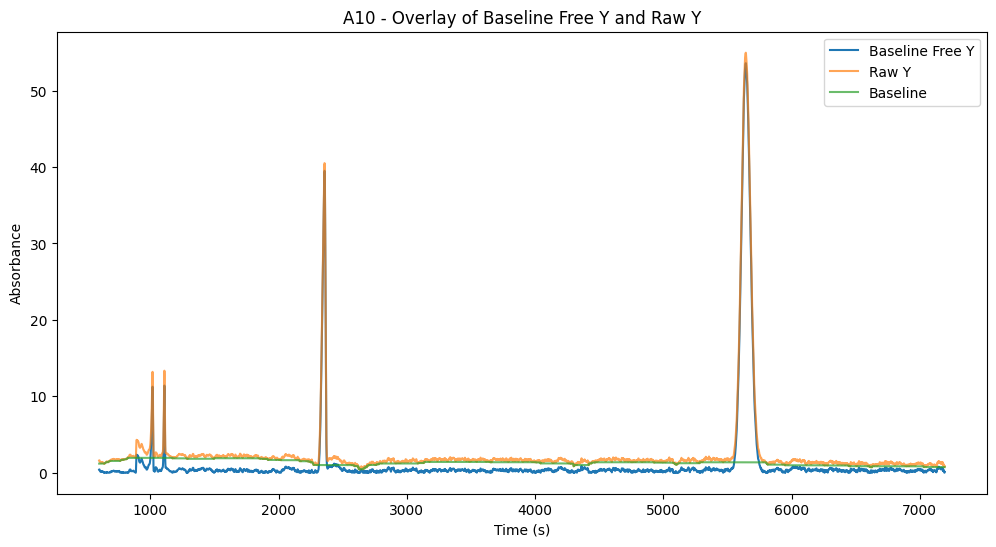

A11


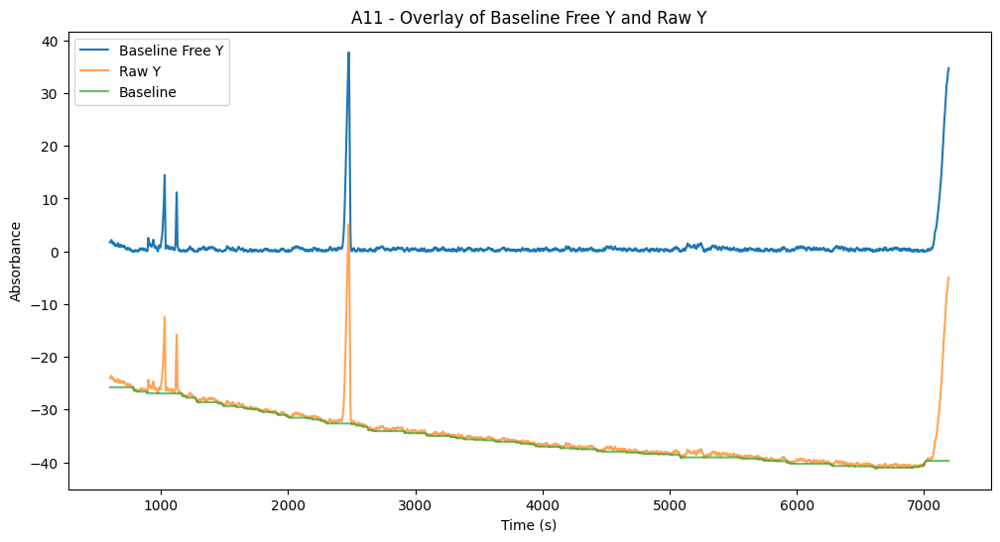

A12


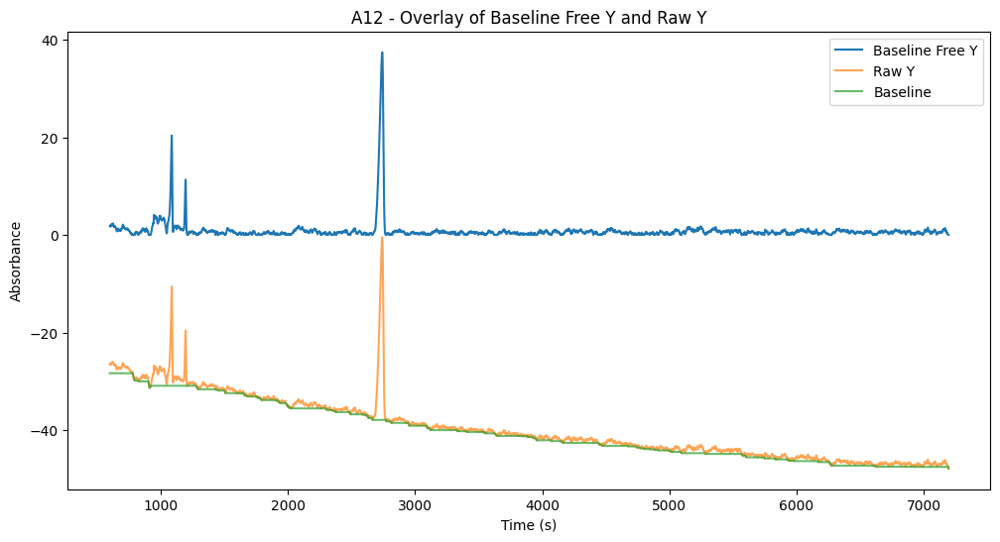

B1


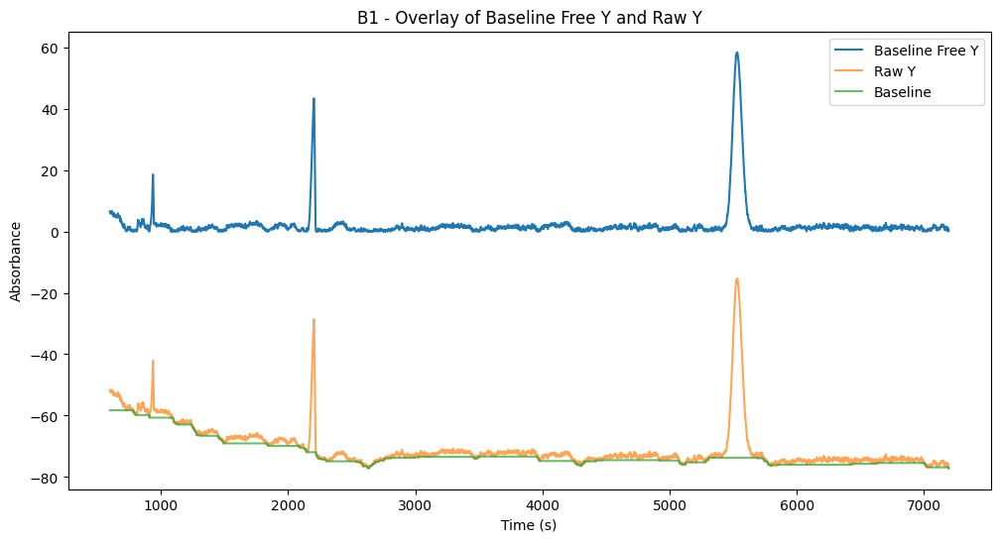

B2


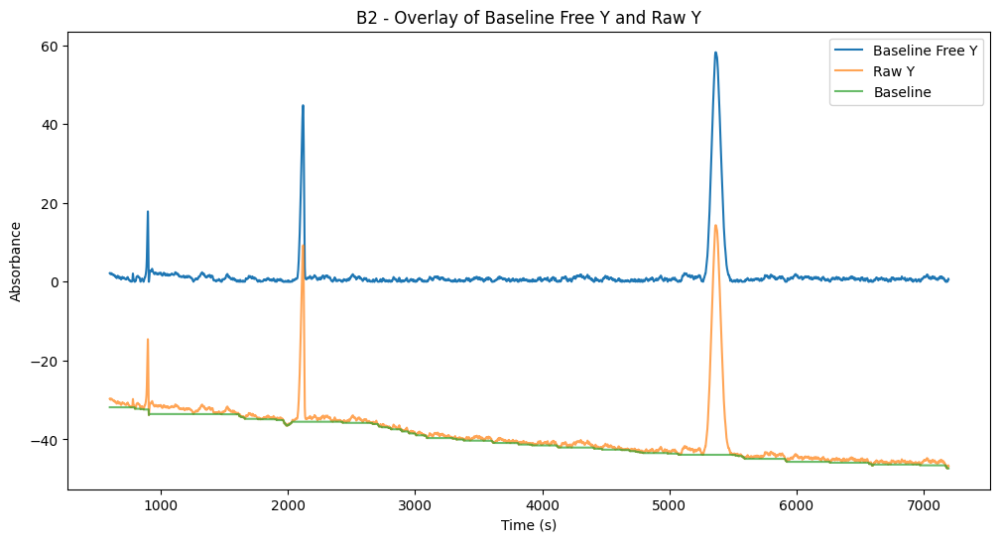

B3


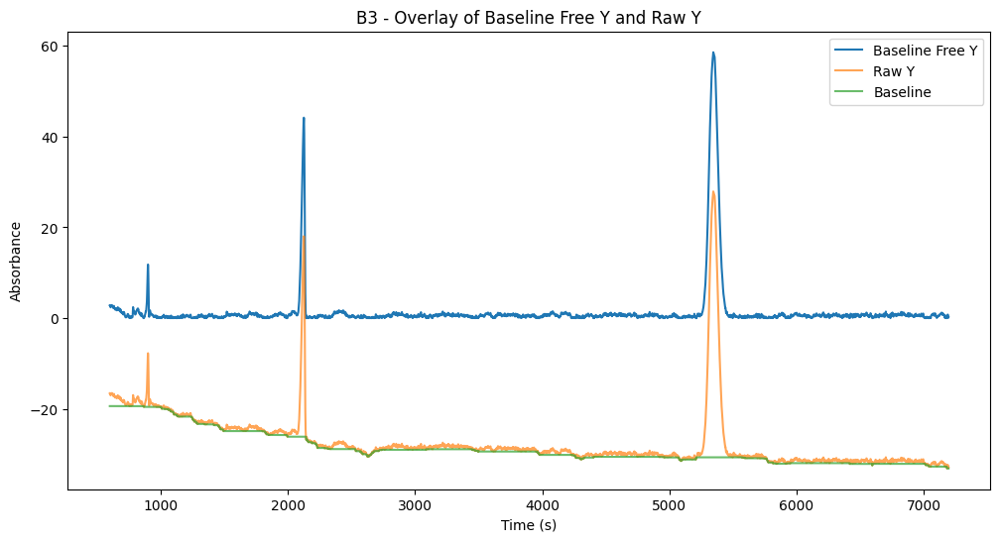

B4


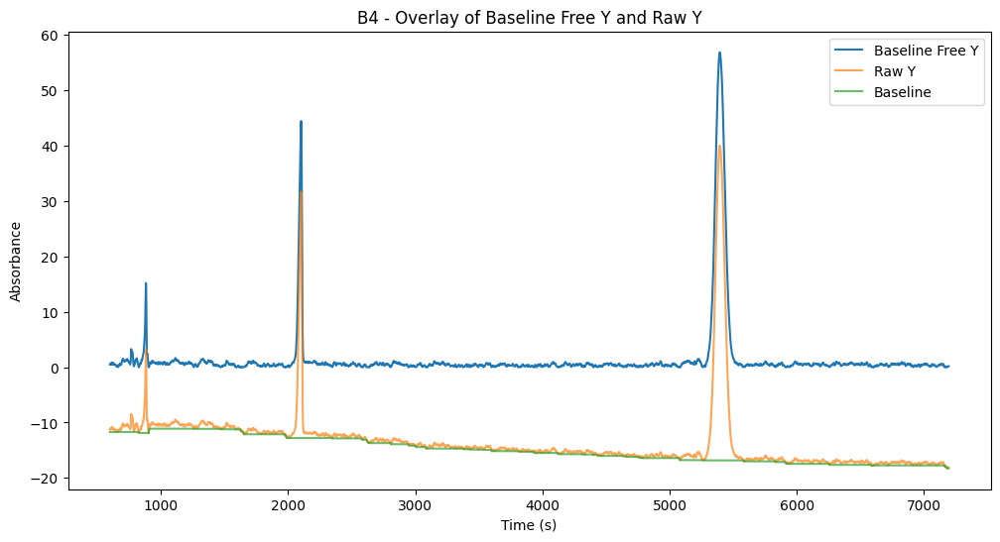

B5


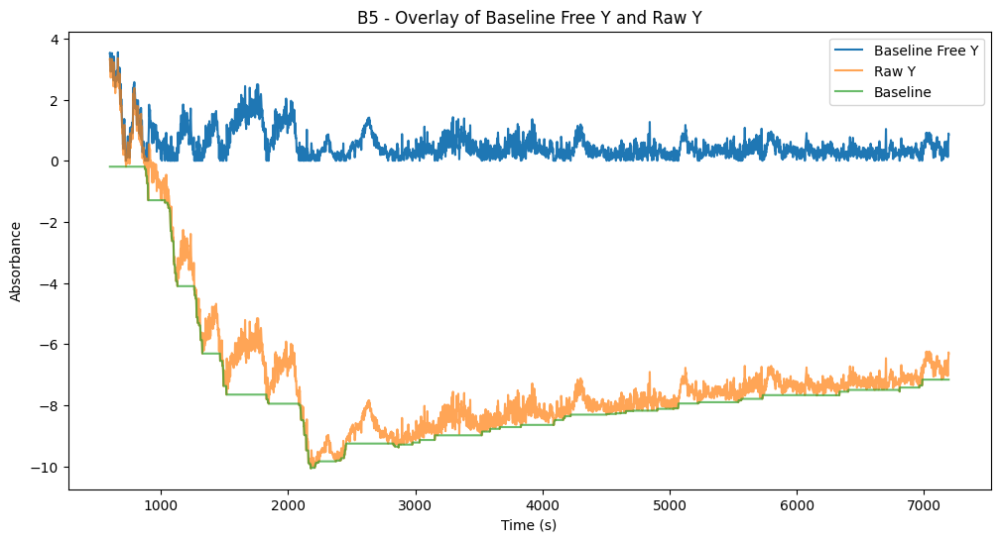

B6


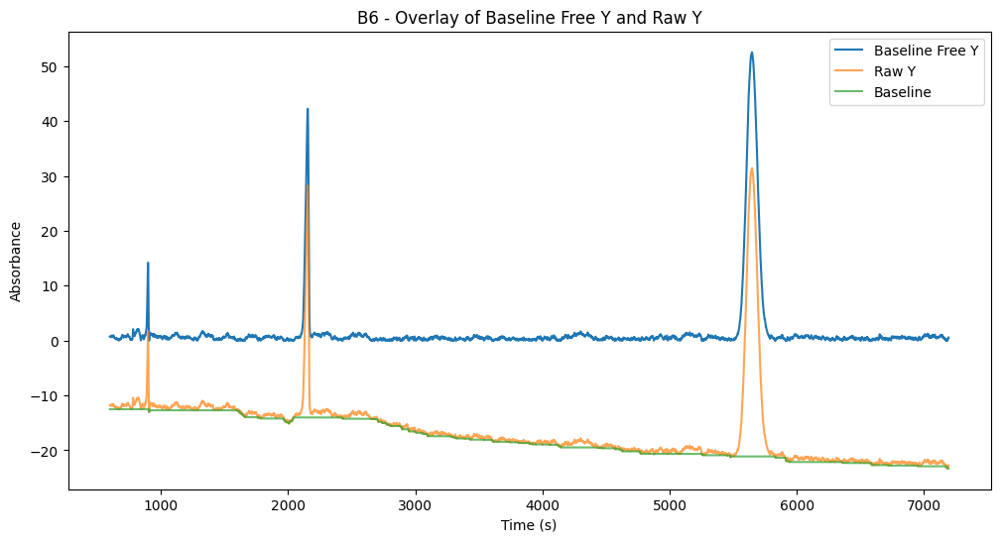

B7


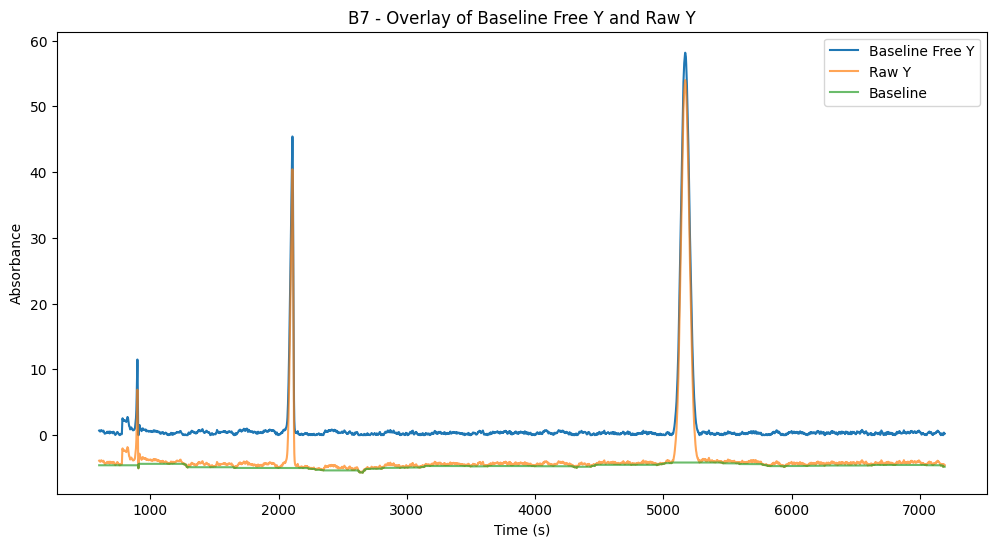

B8


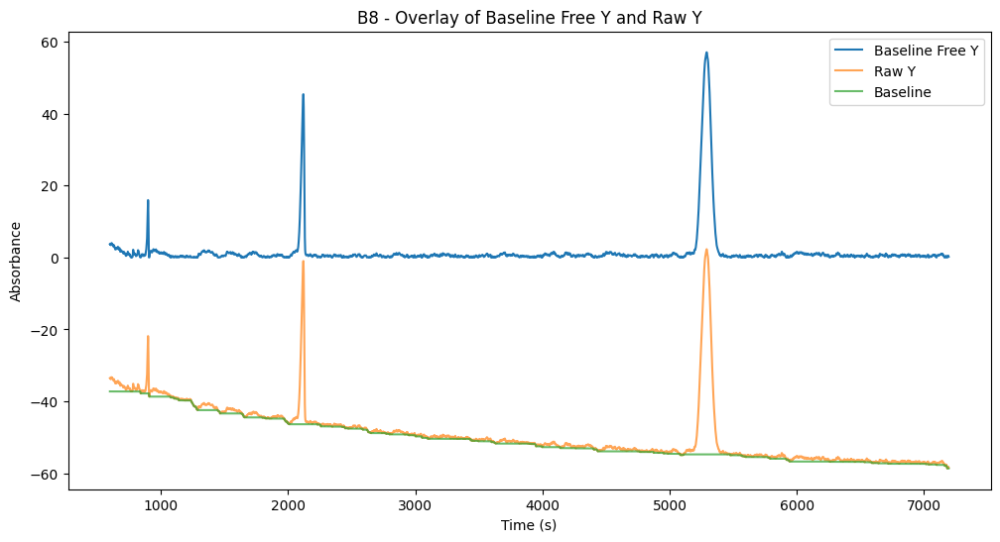

B9


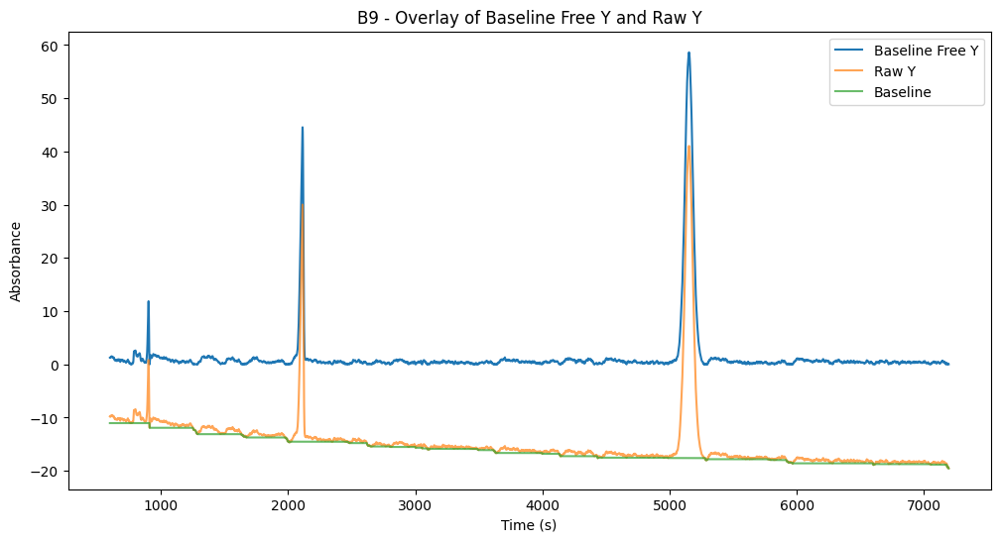

B10


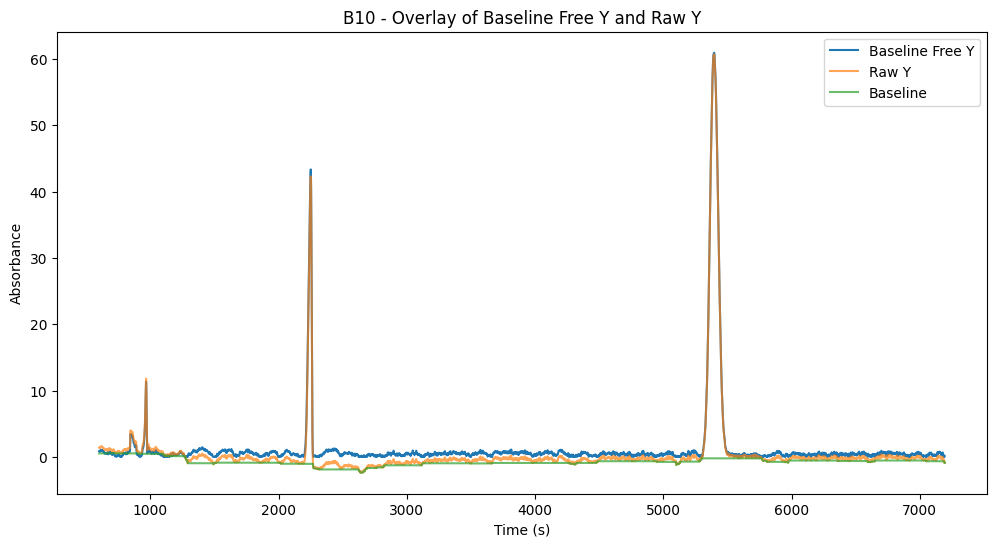

B11


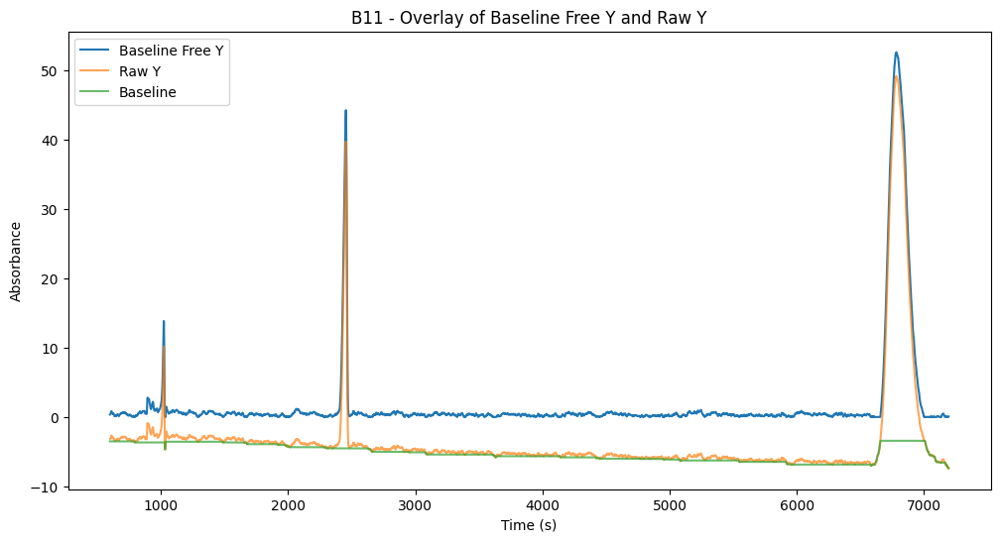

B12


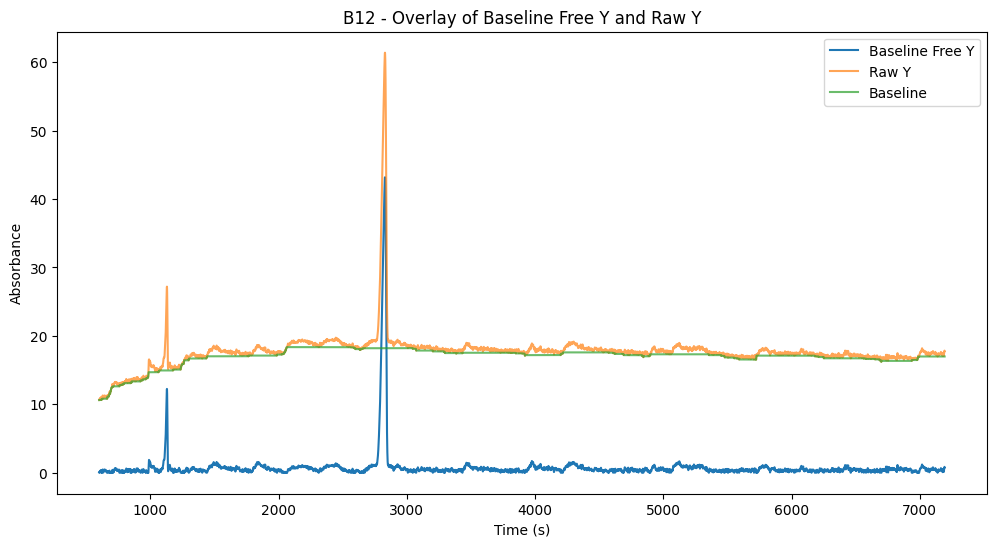

C1


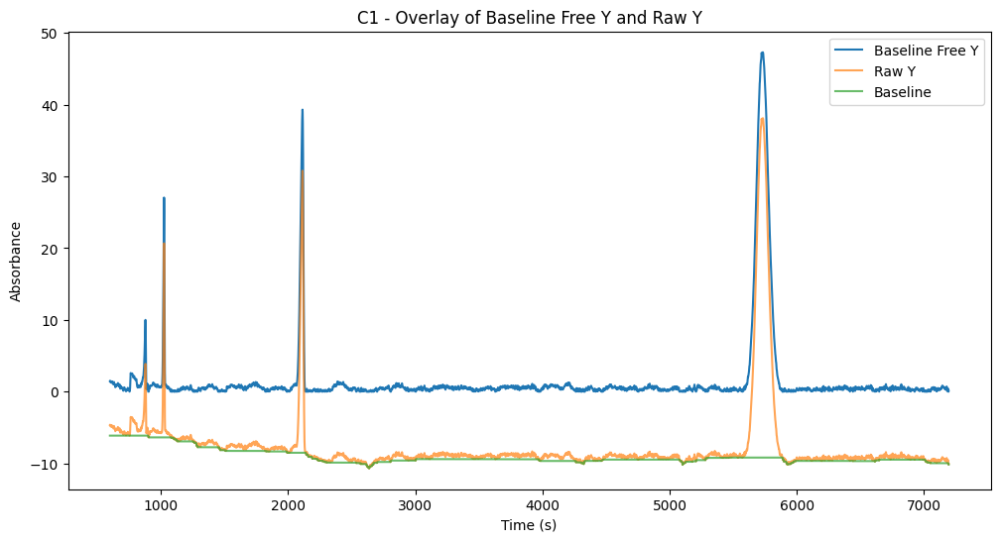

C2


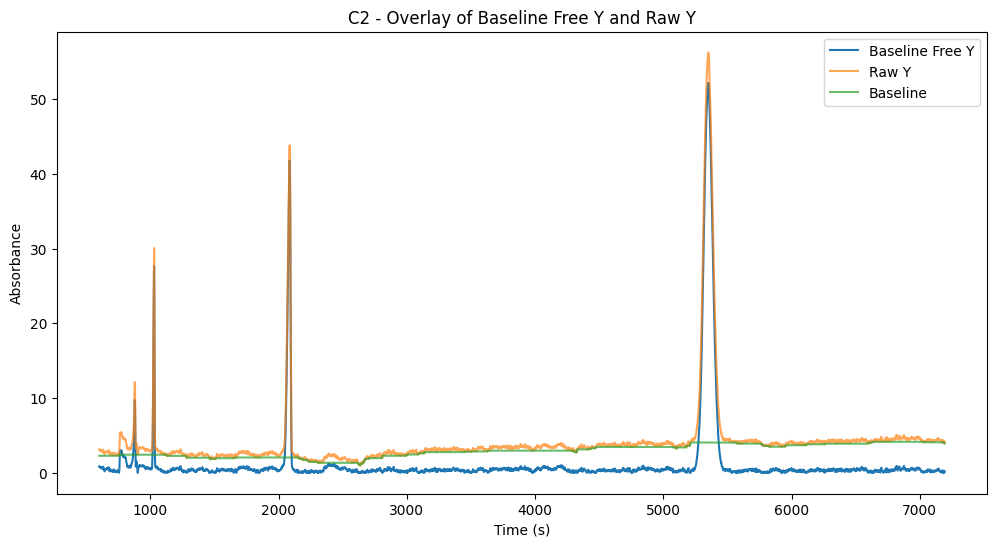

C3


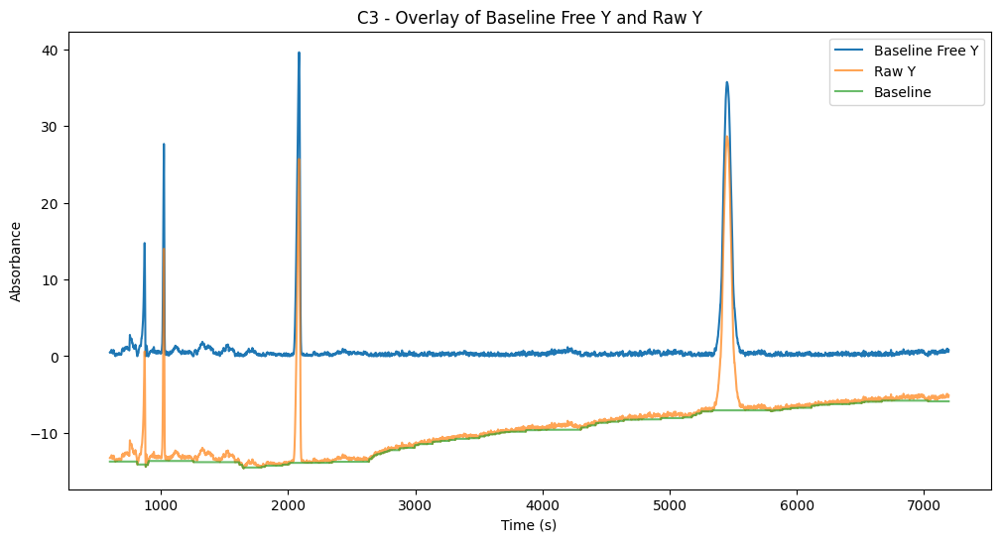

C4


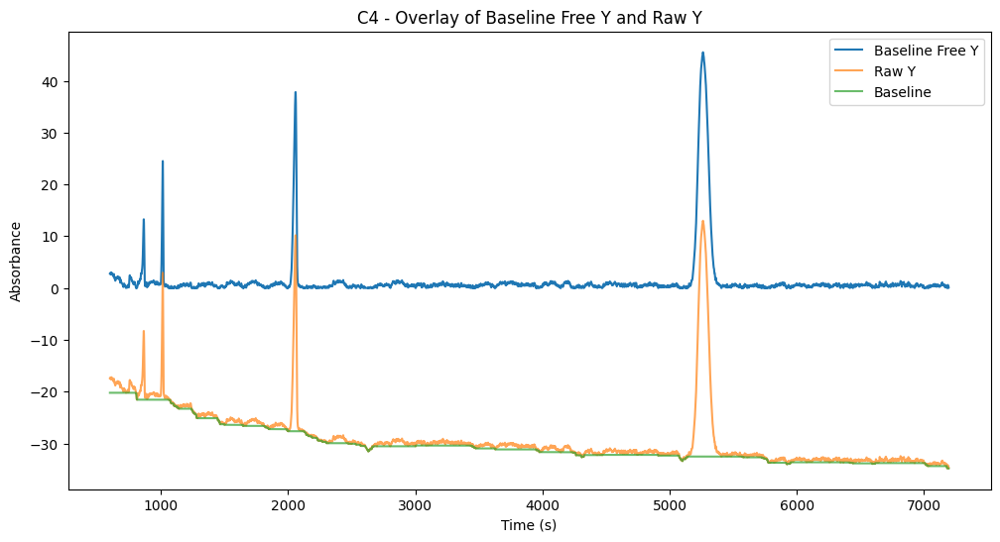

C5


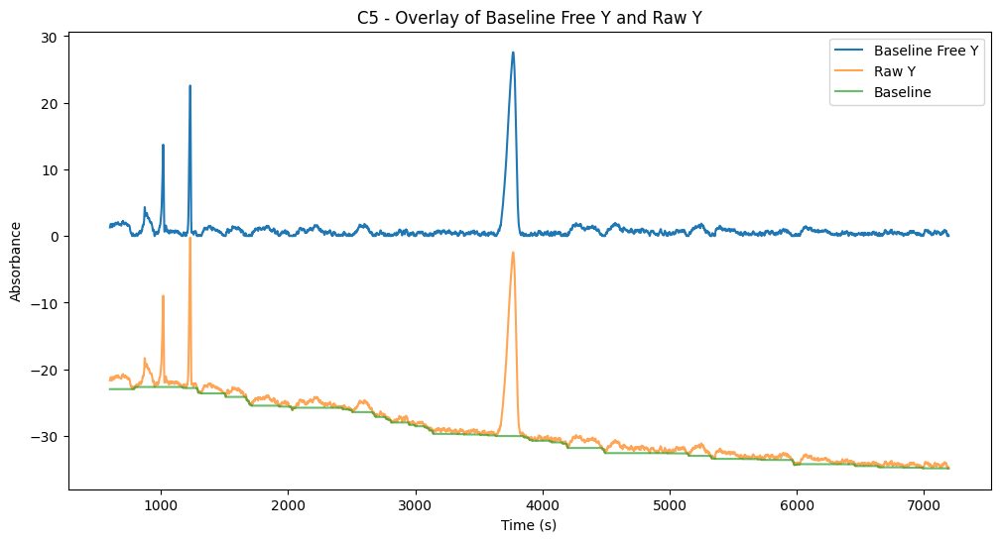

C6


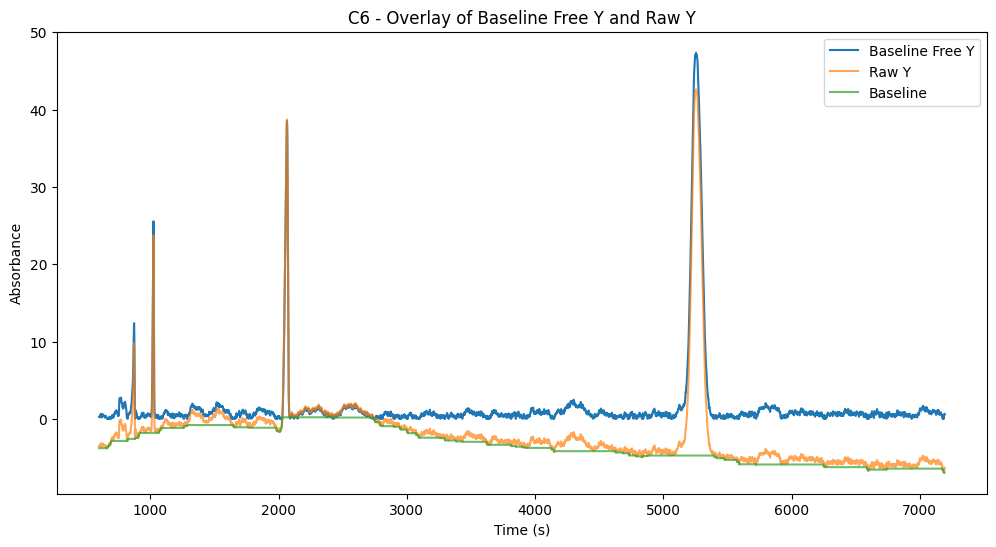

C7


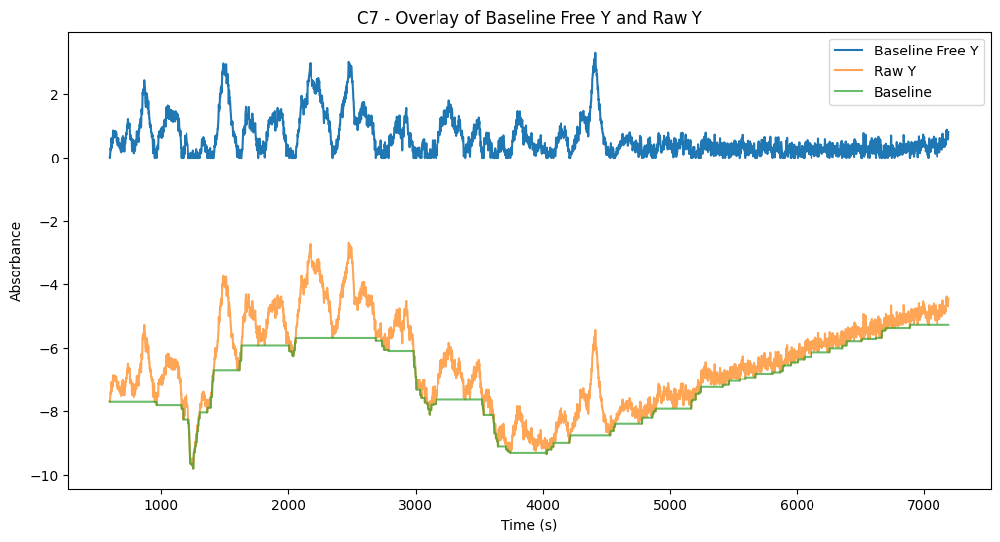

C8


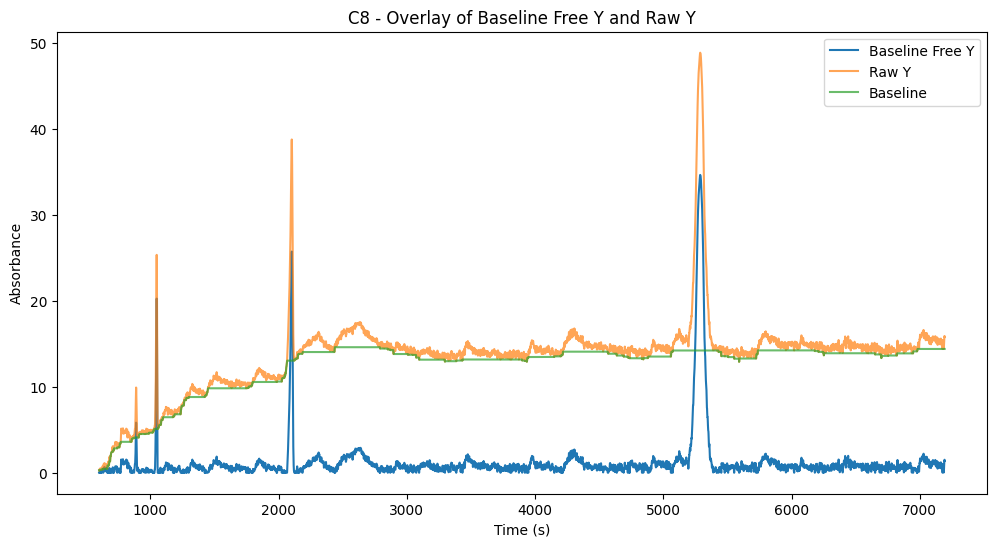

C9


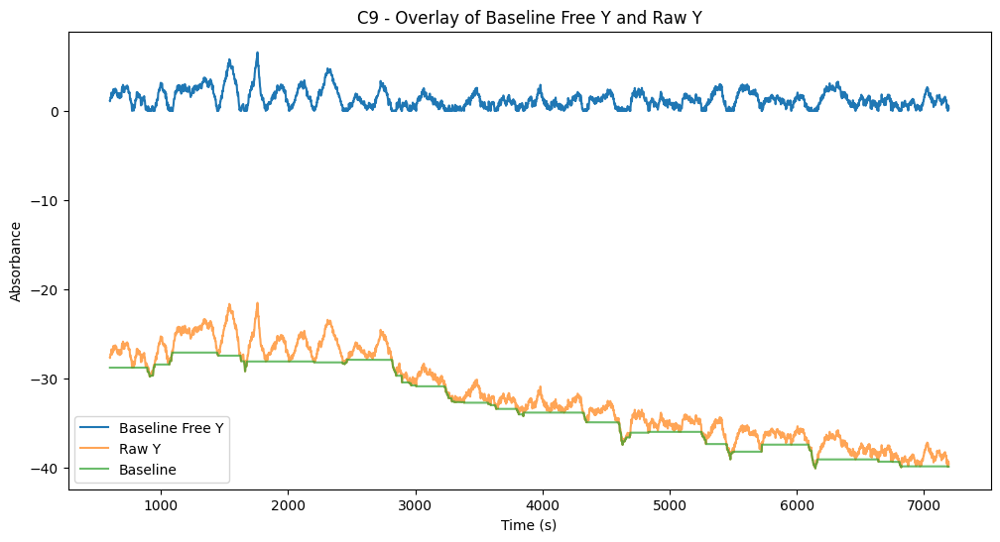

C10


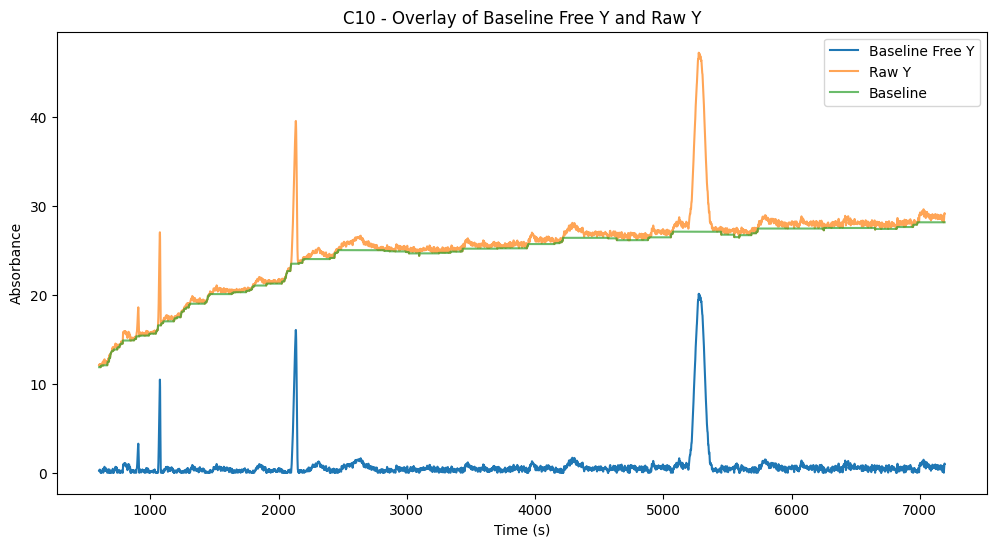

C11


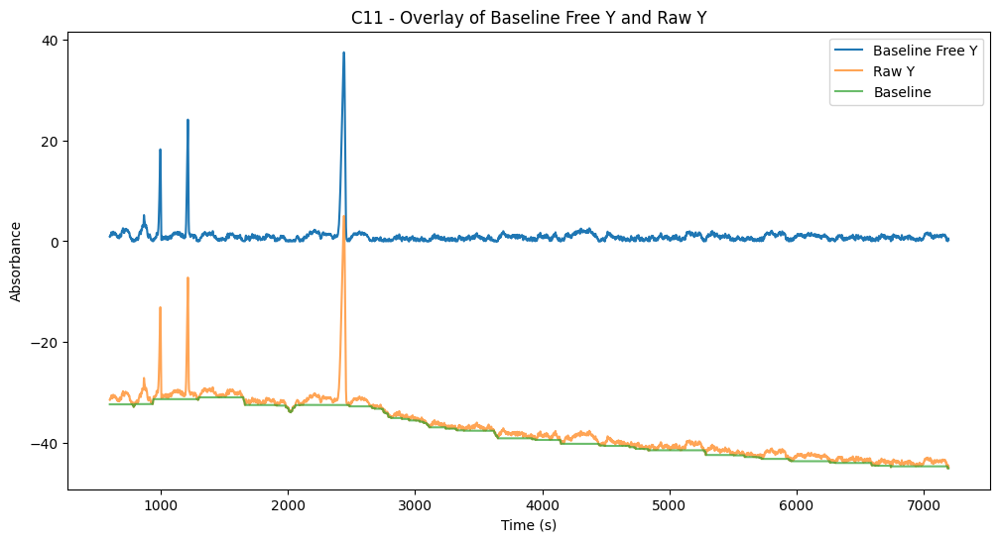

C12


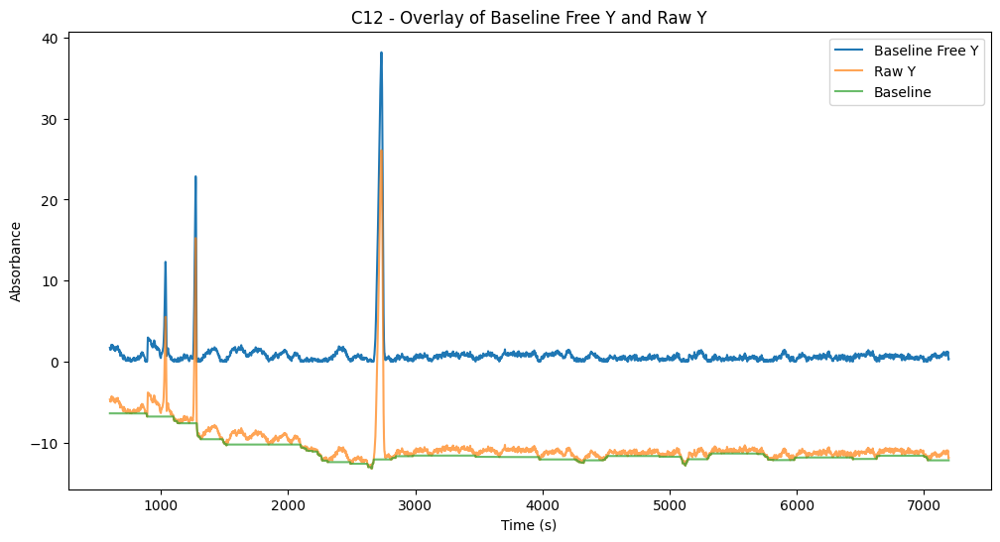

D1


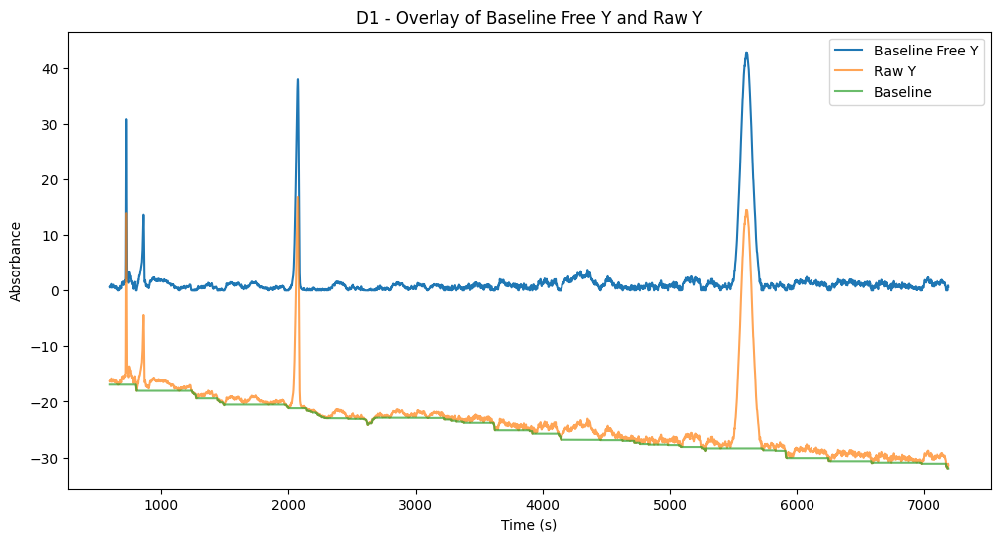

D2


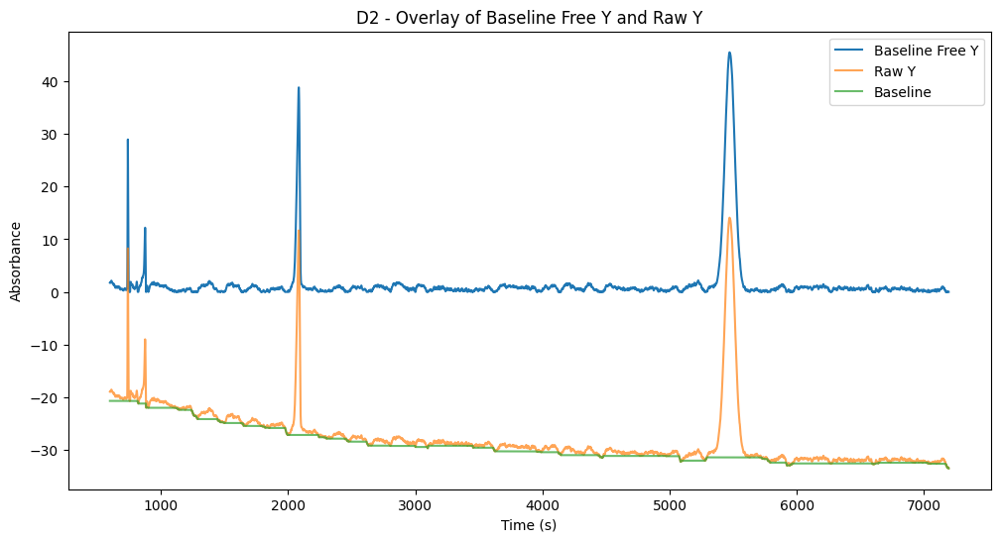

D3


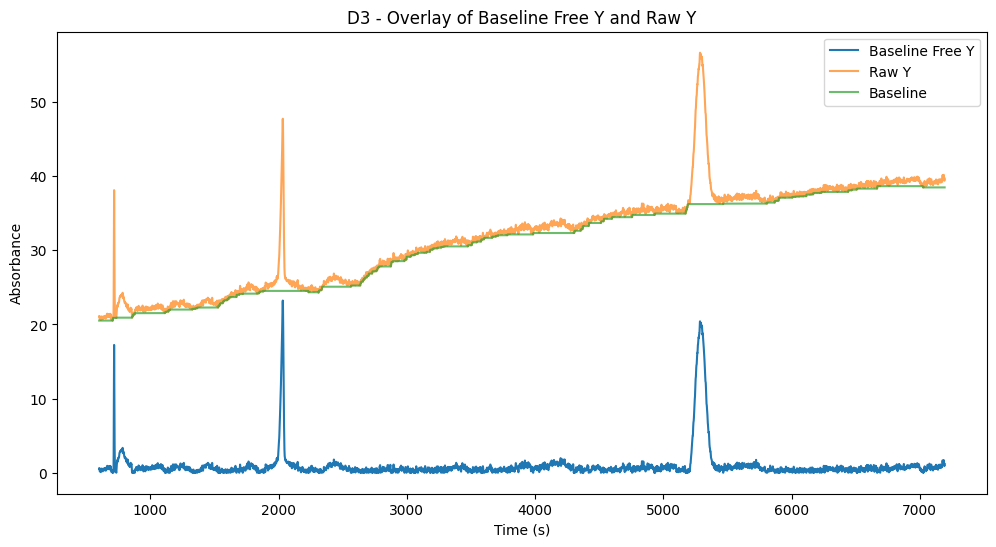

D4


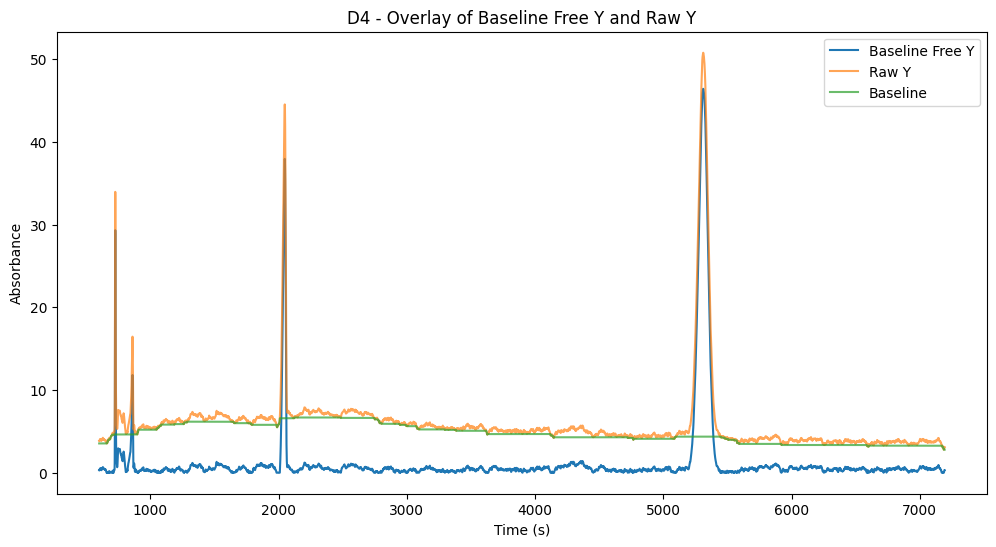

D5


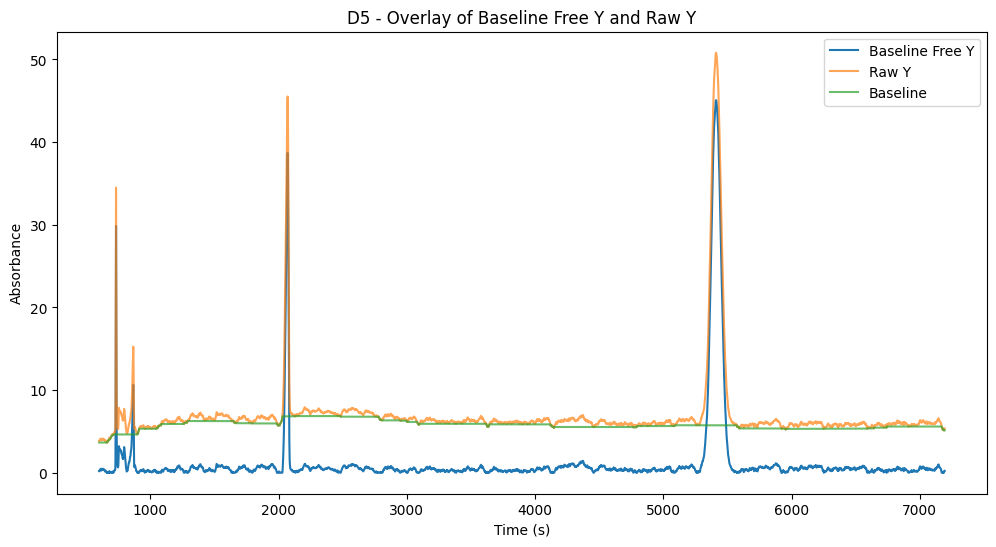

D6


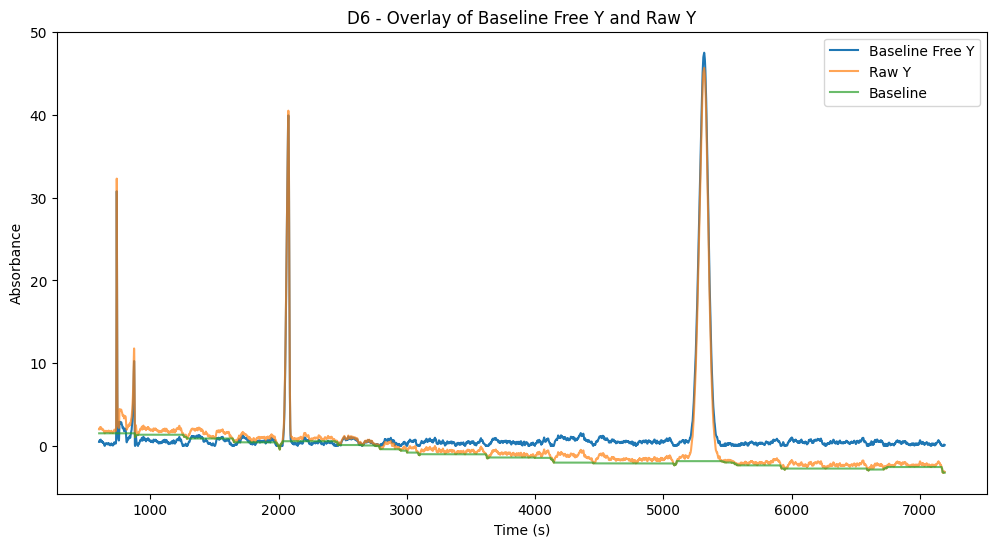

D7


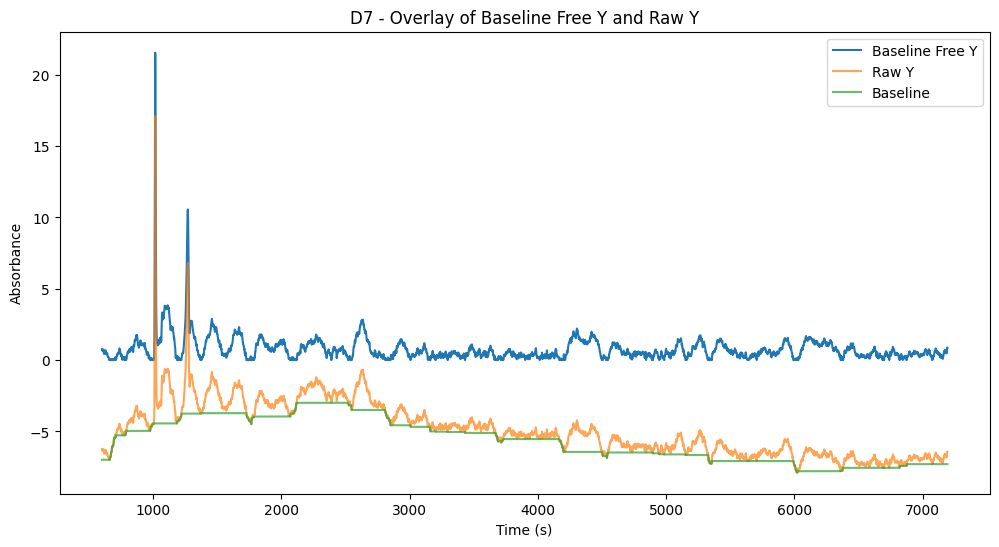

D8


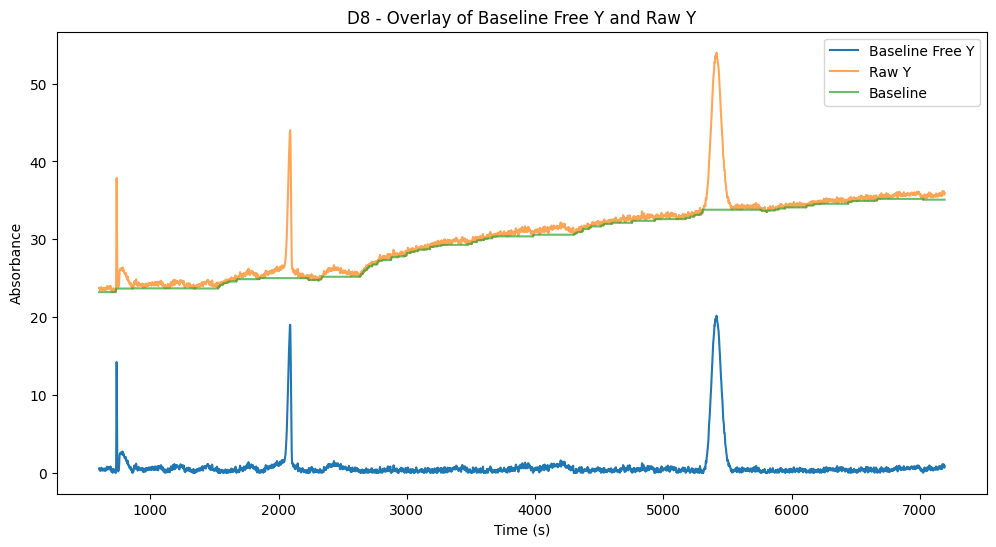

D9


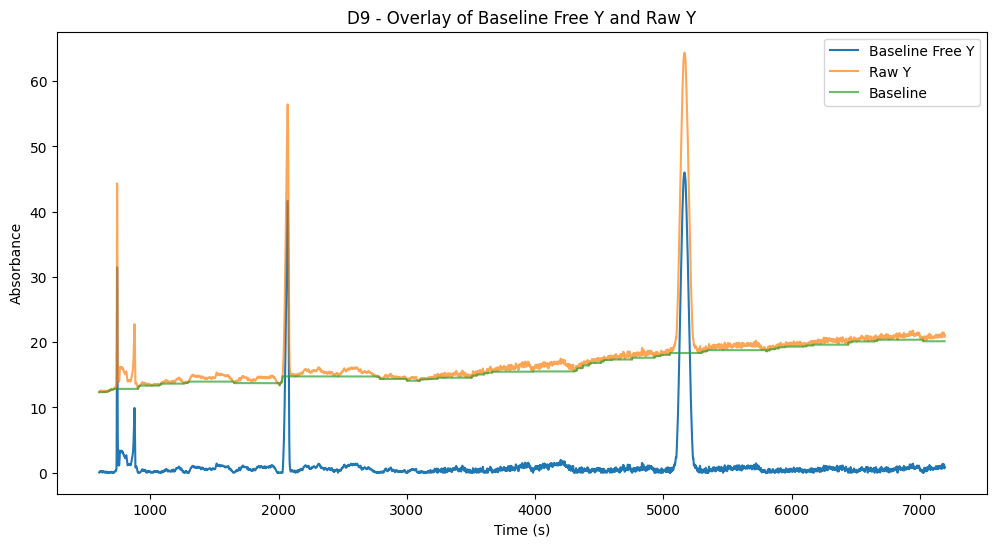

D10


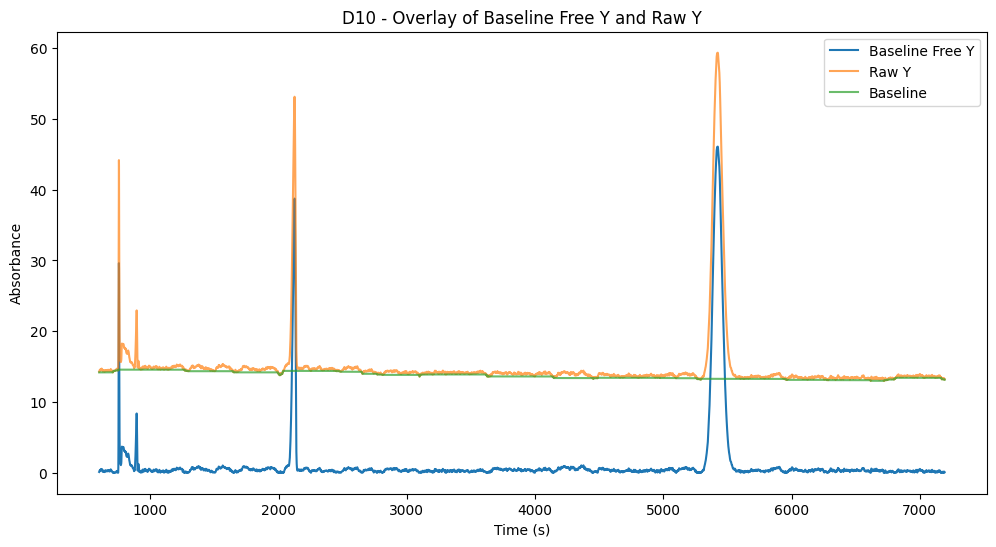

D11


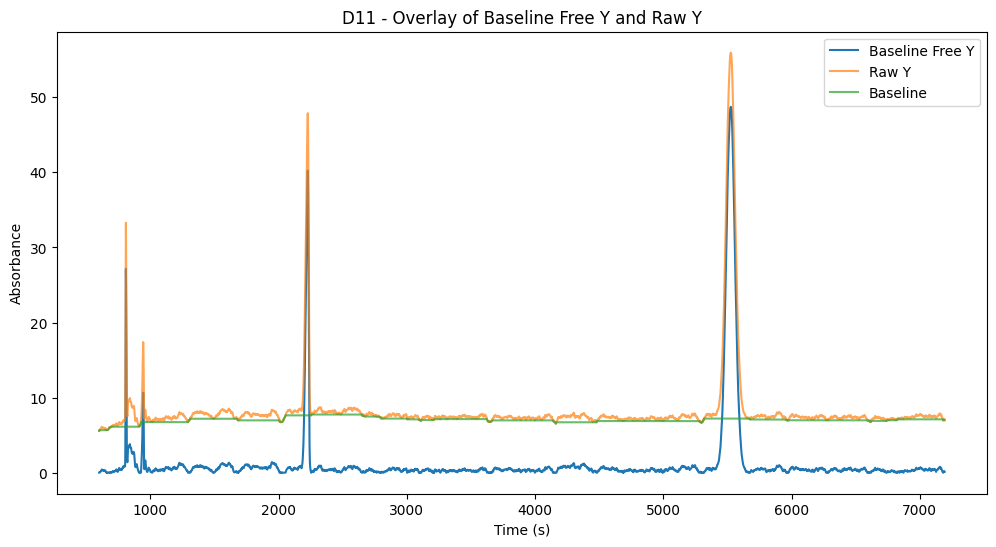

D12


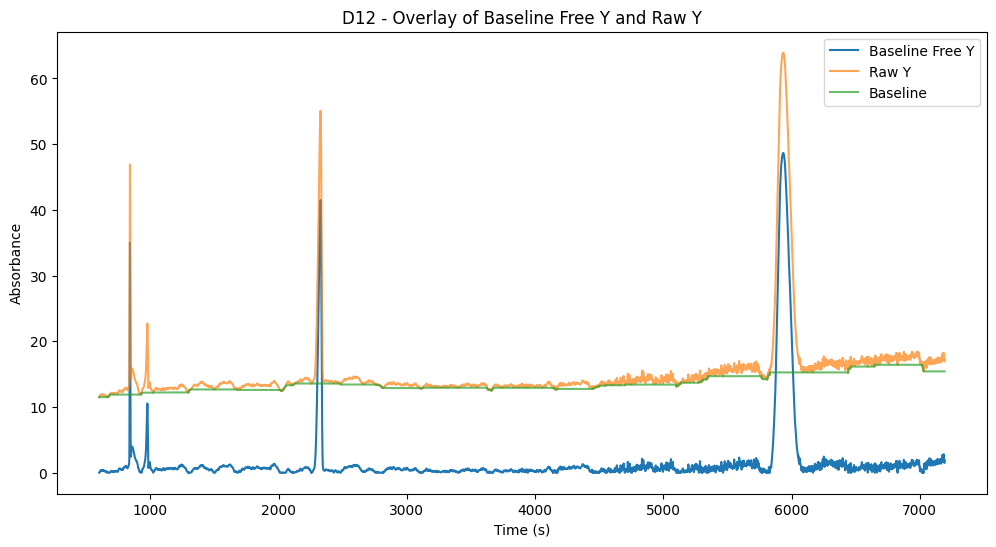

E1


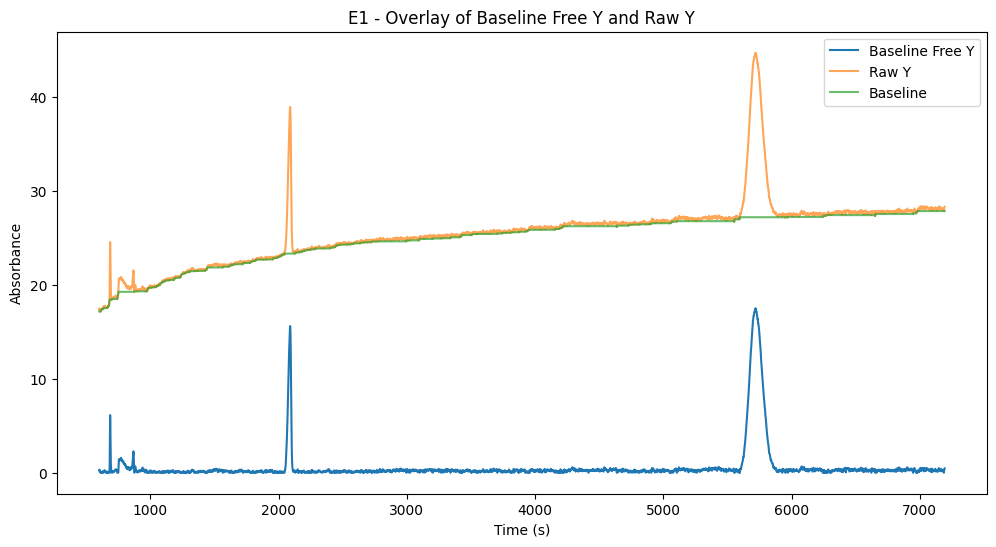

E2


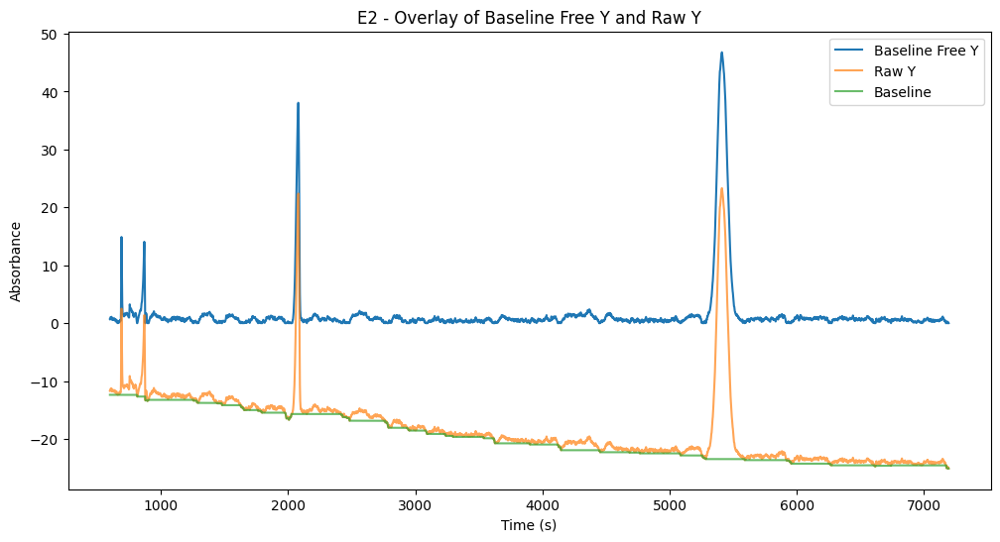

E3


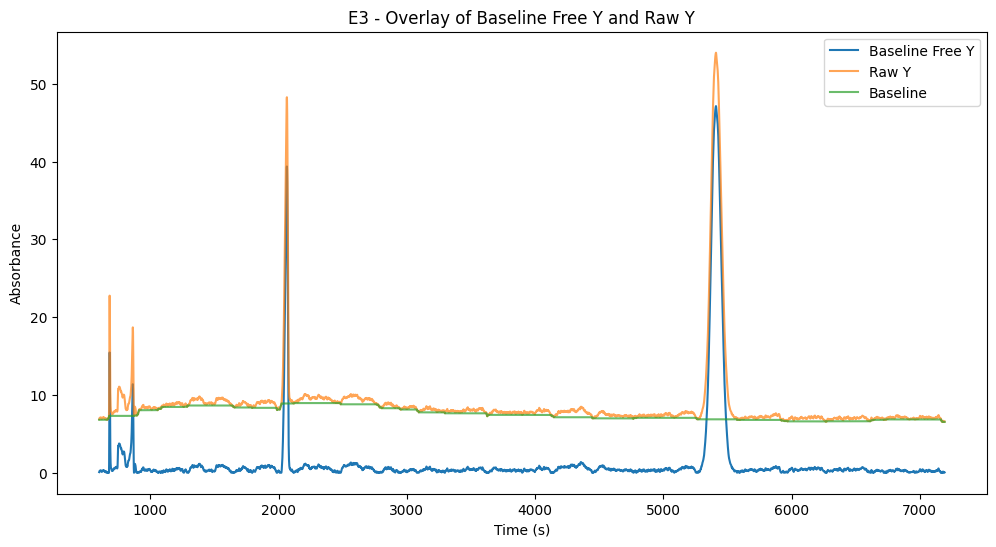

E4


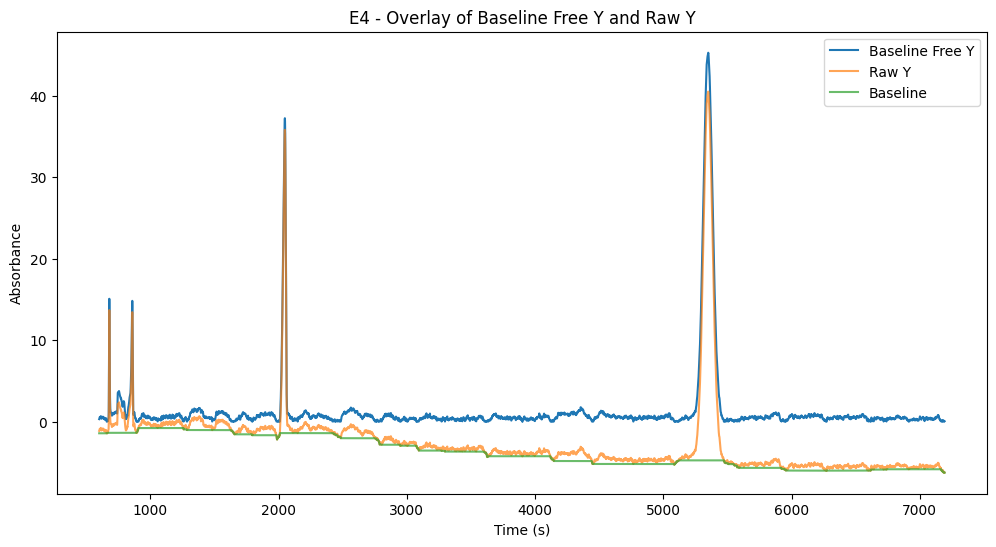

E5


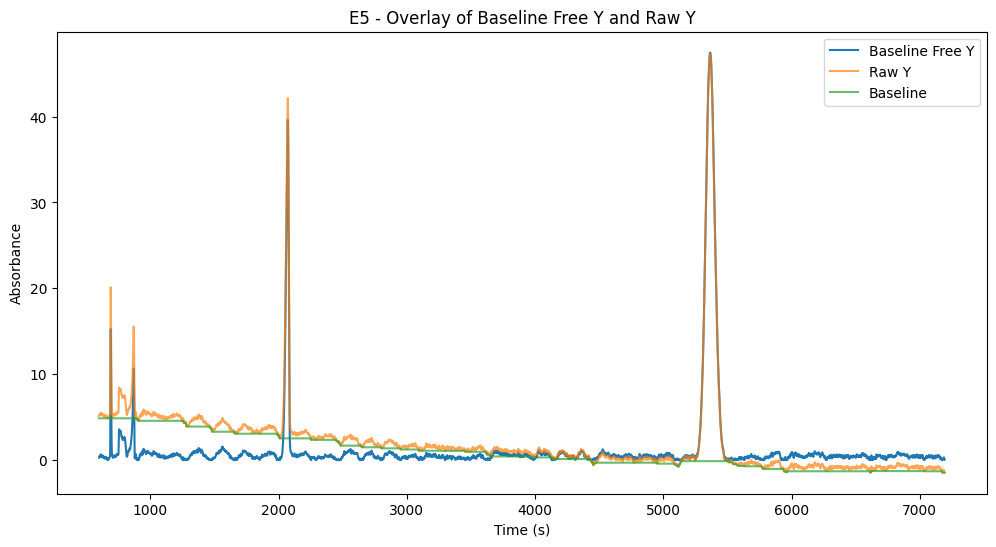

E6


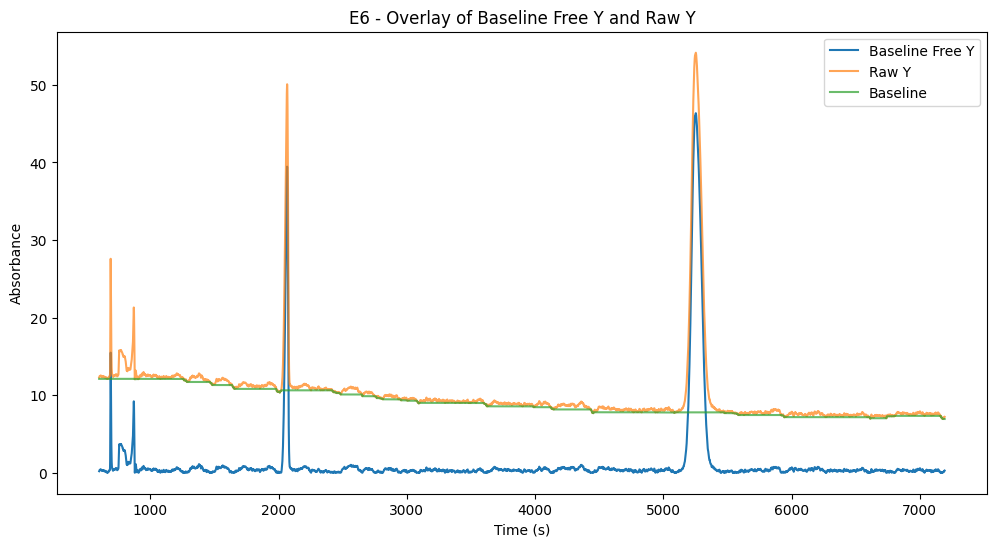

E7


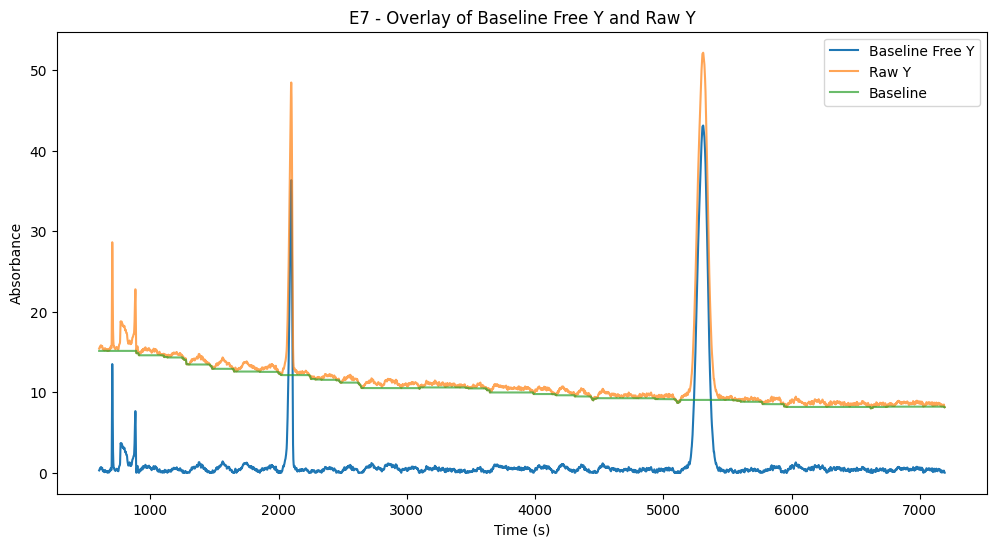

E8


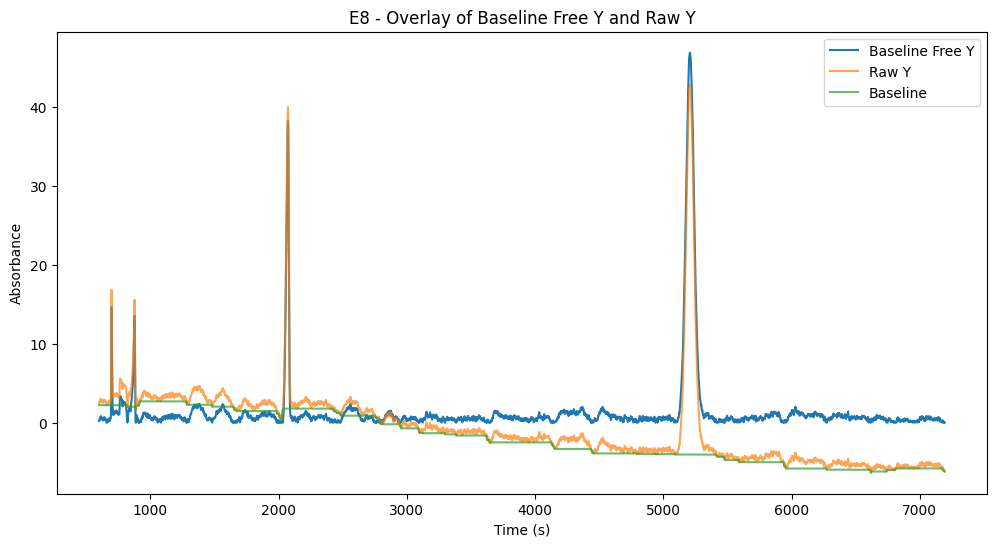

E9


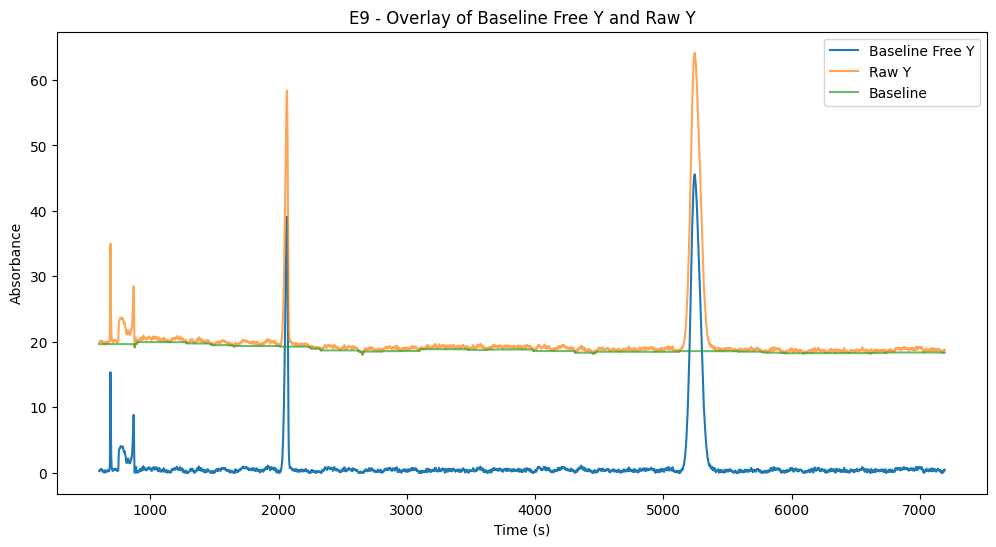

E10


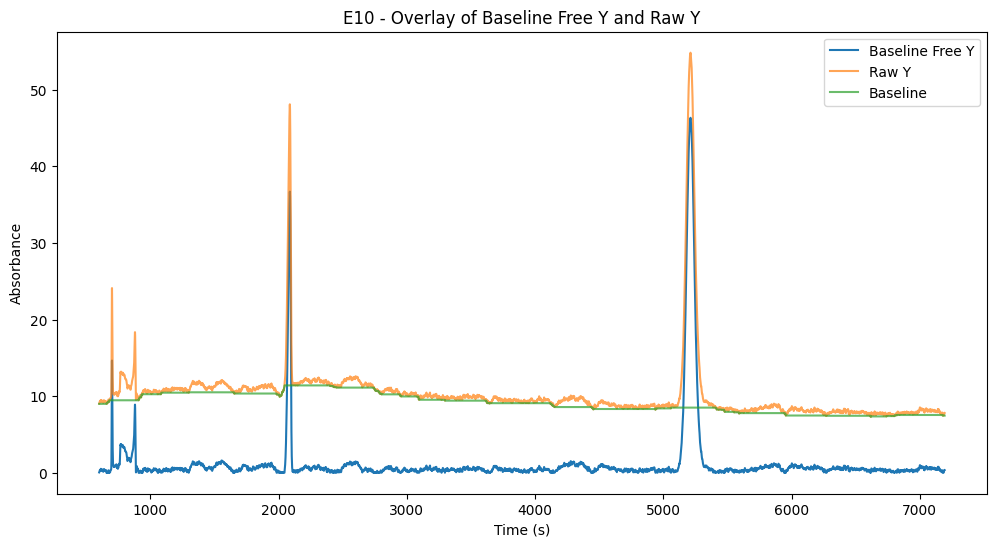

E11


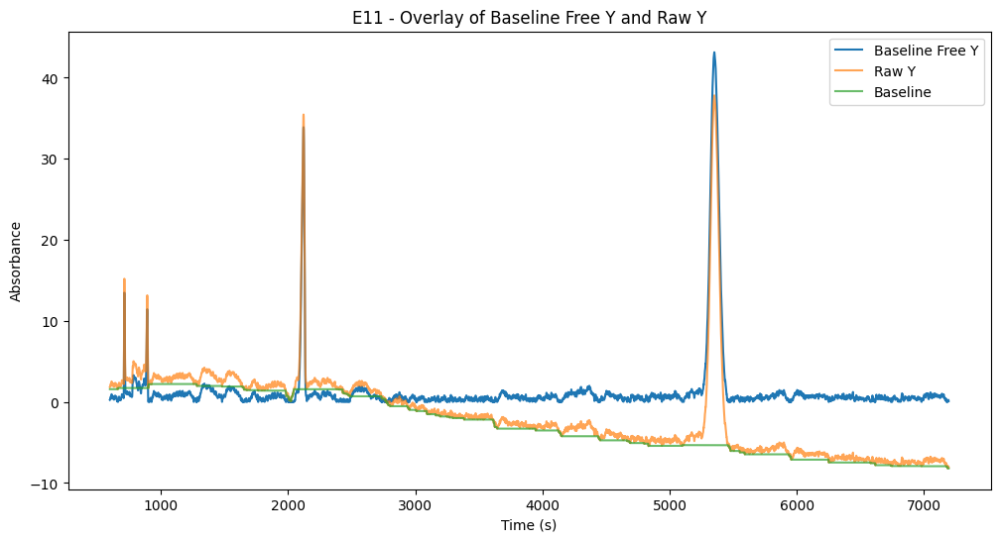

E12


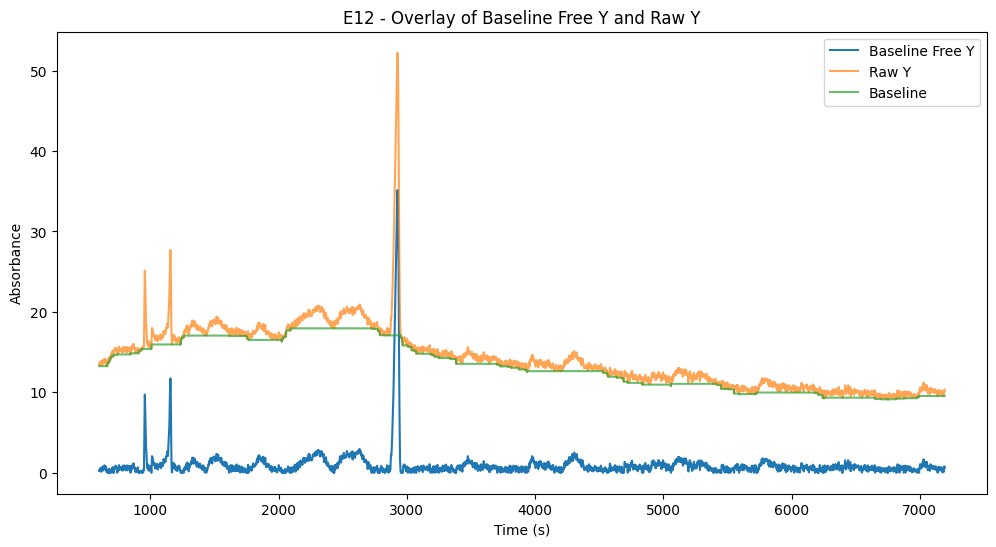

F1


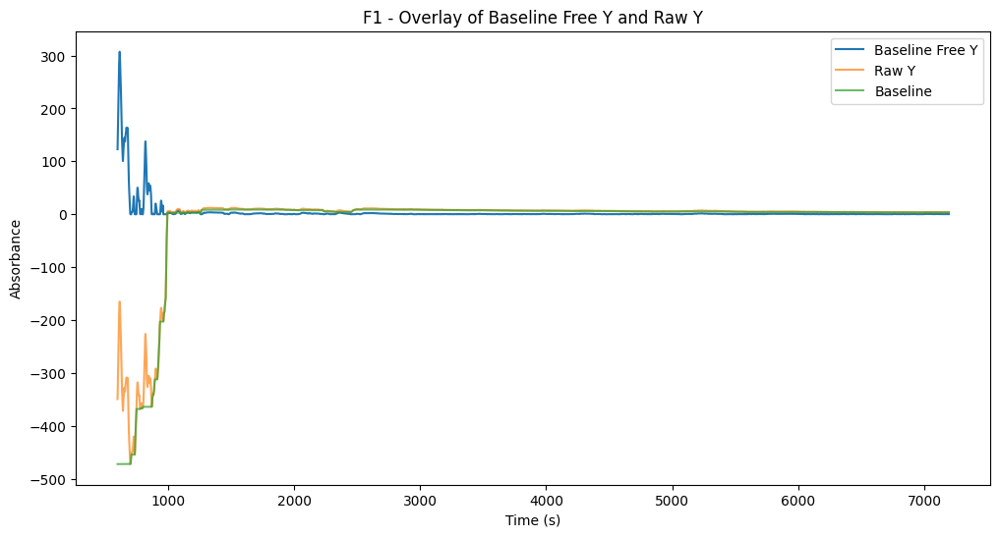

F2


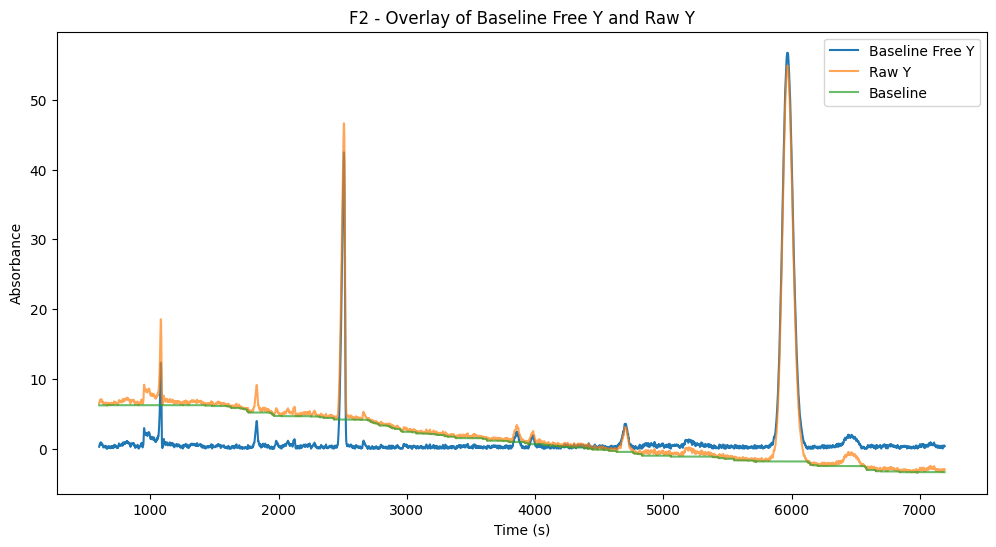

F3


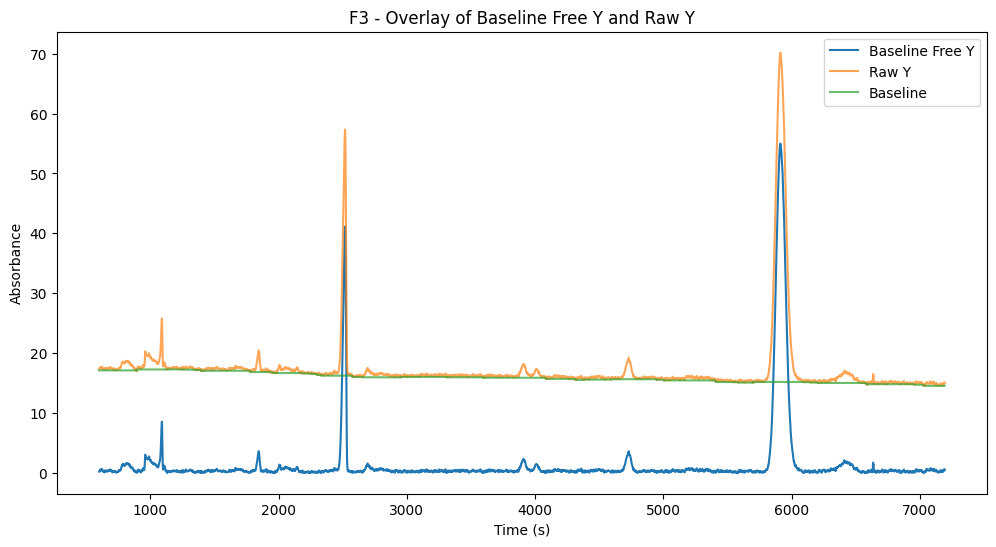

F4


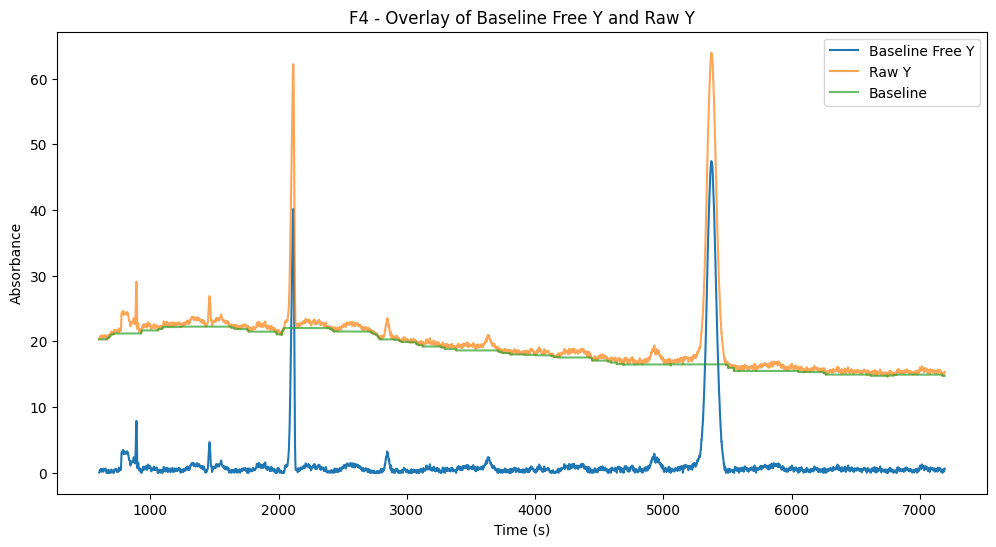

F5


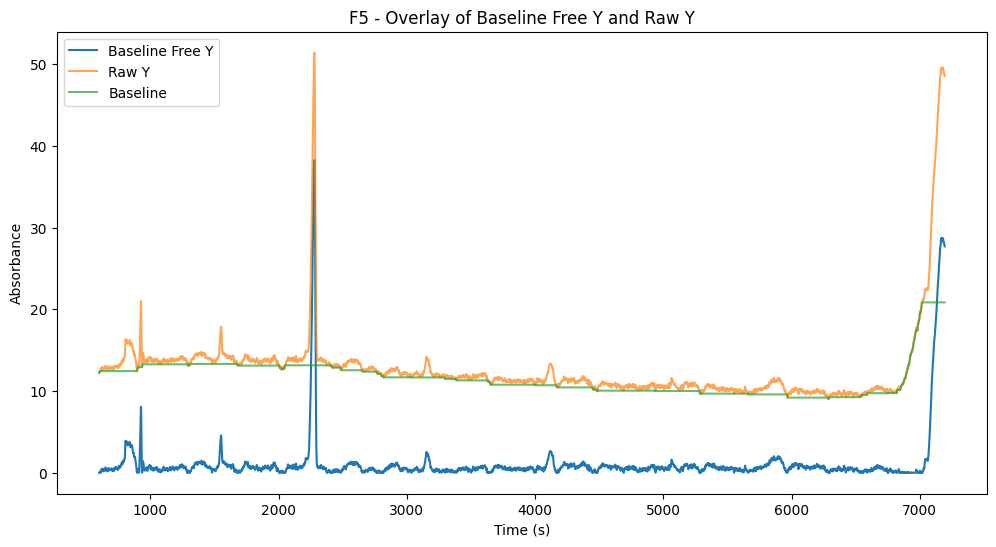

F6


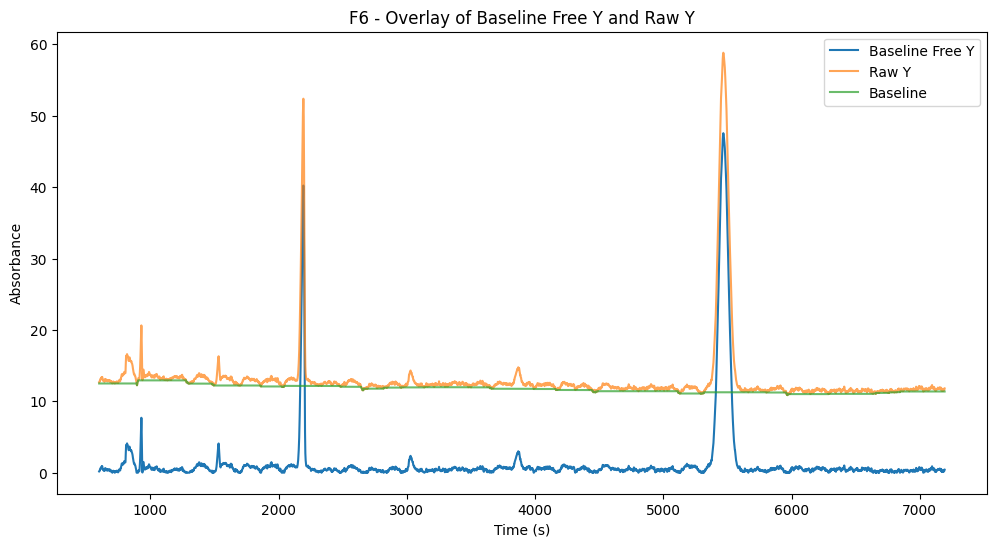

F7


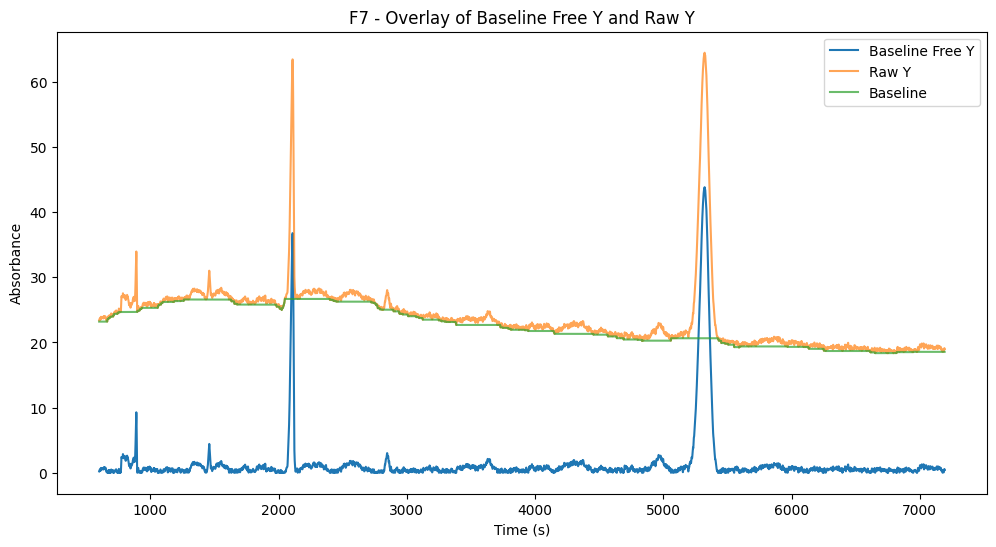

F8


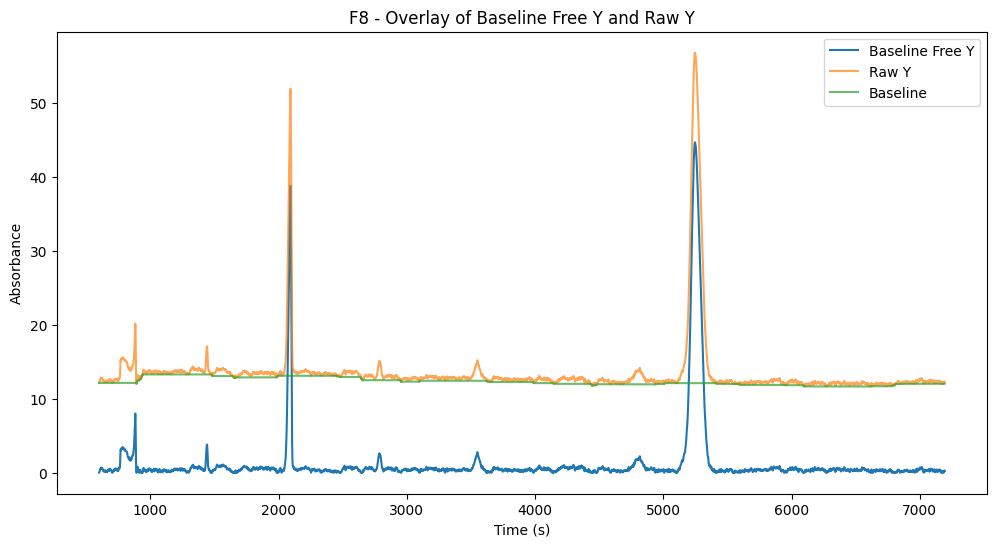

F9


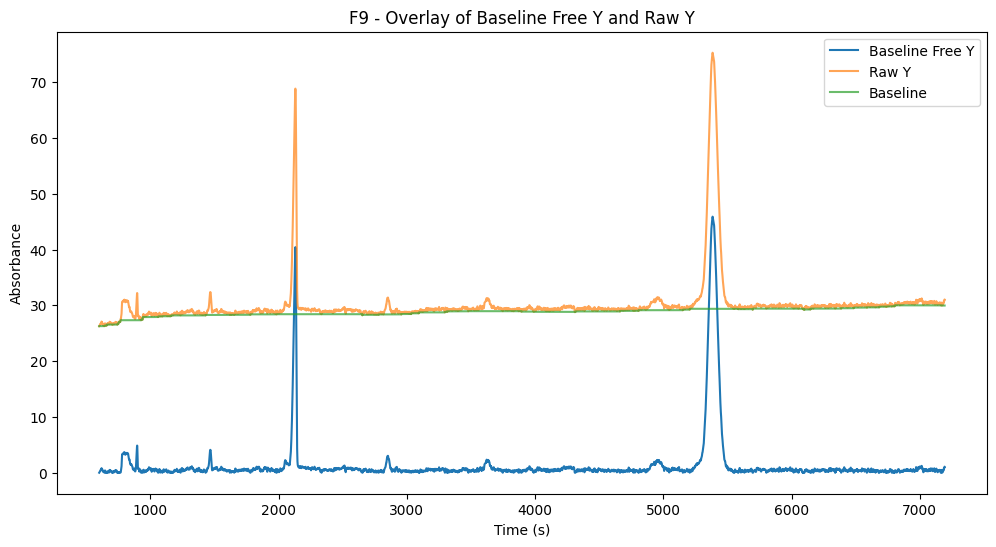

F10


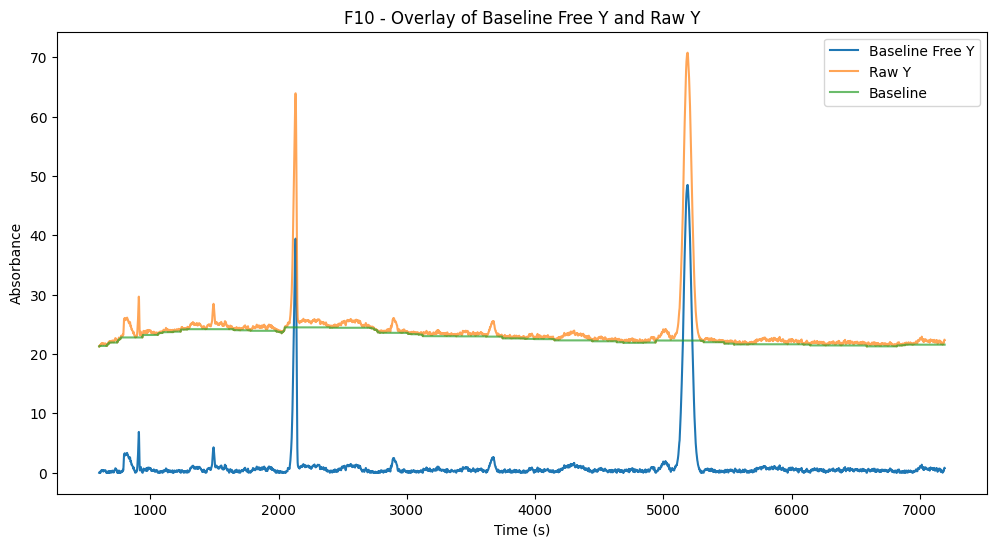

F11


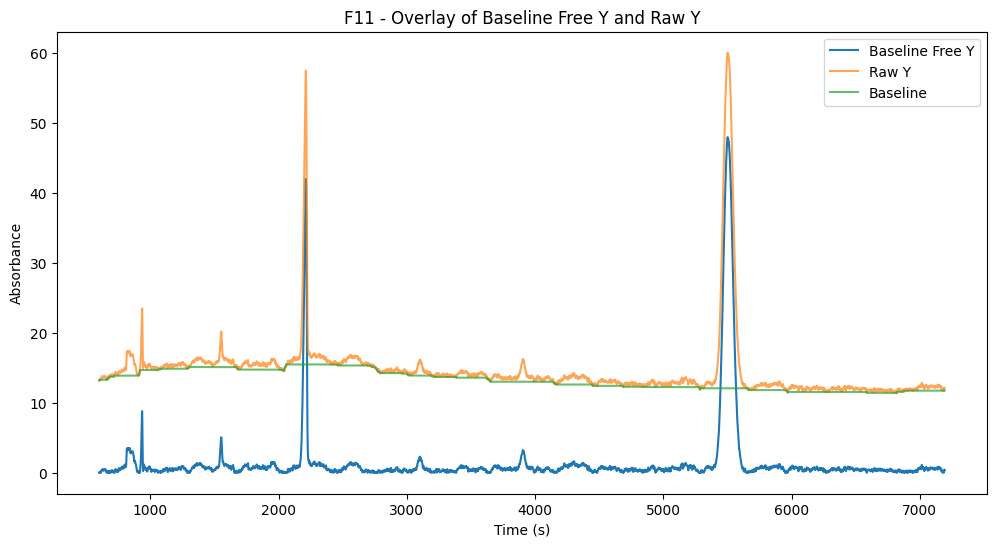

F12


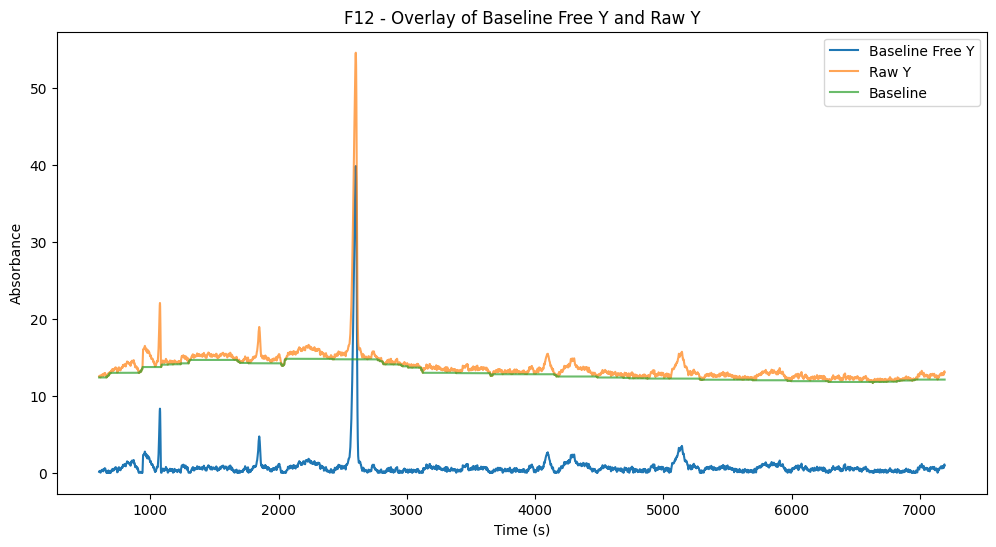

G1


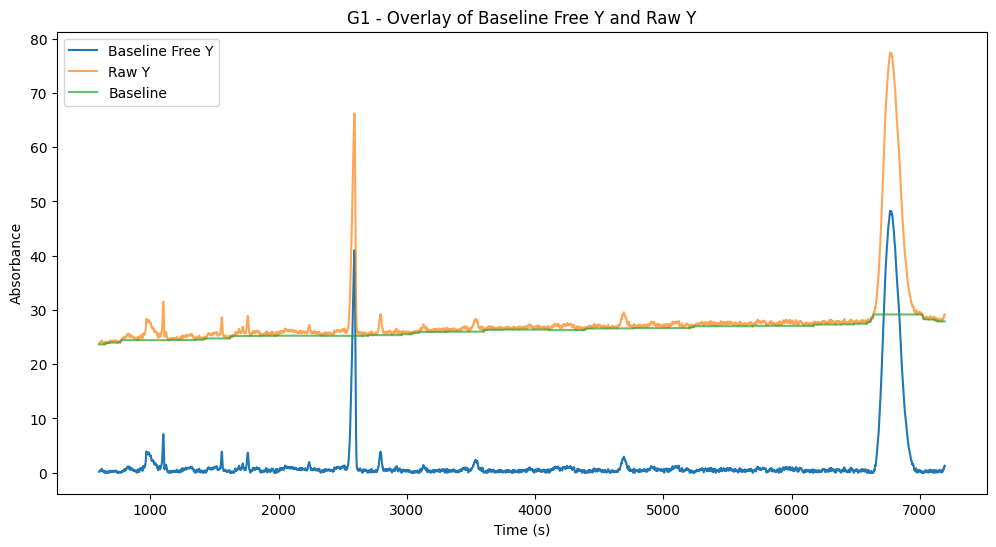

G2


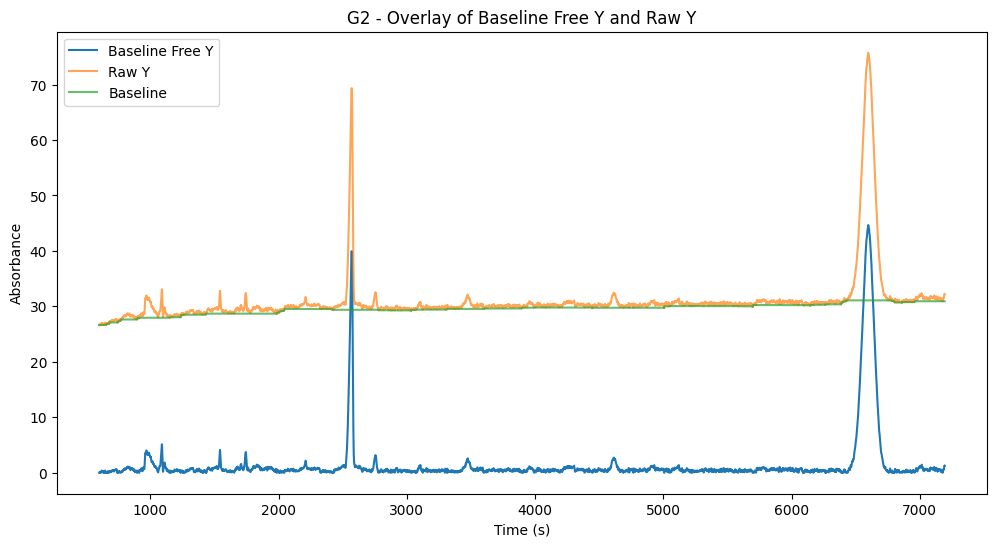

G3


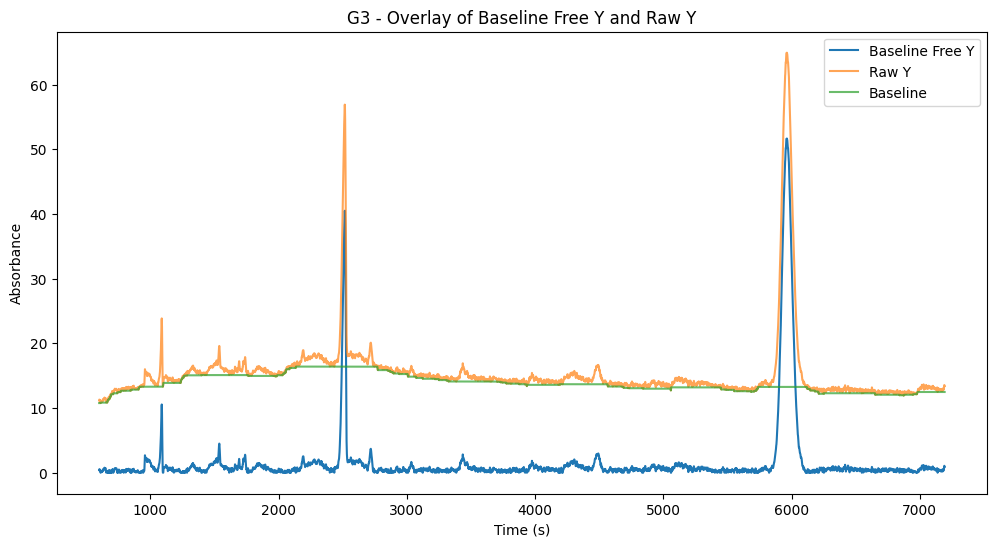

G4


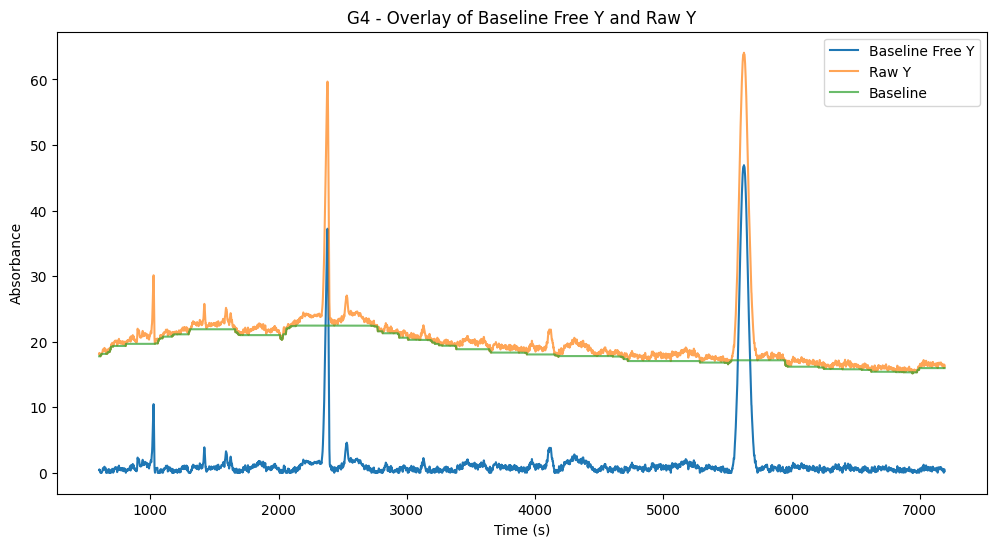

G5


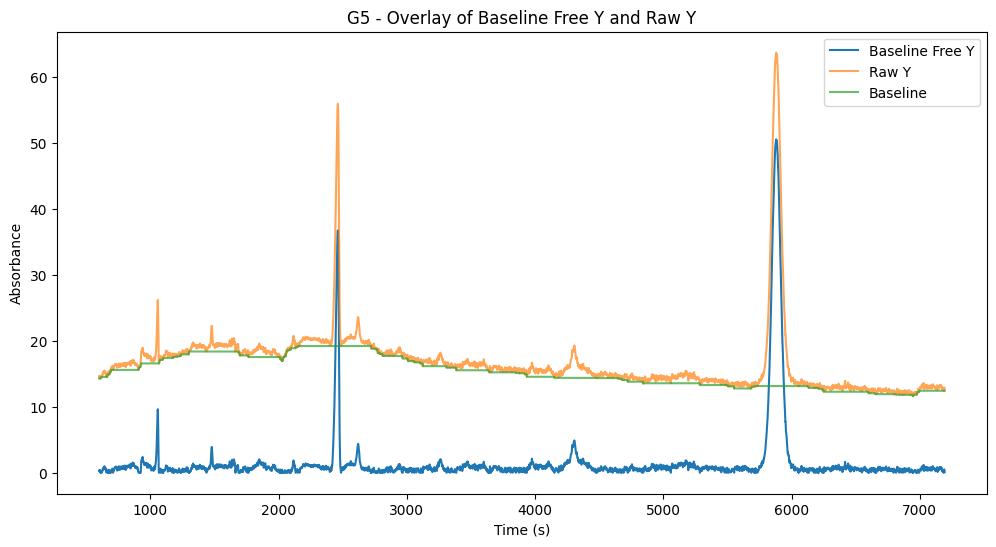

G6


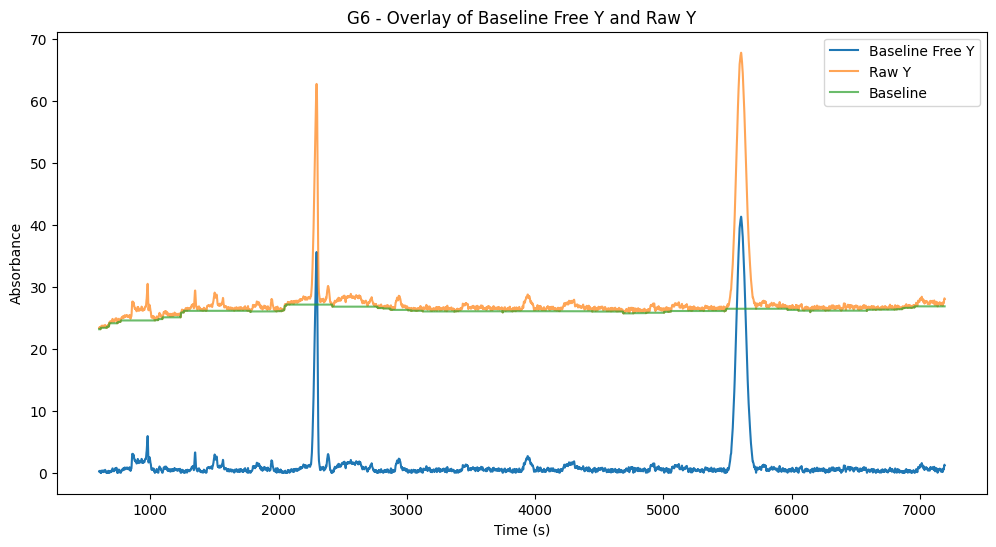

G7


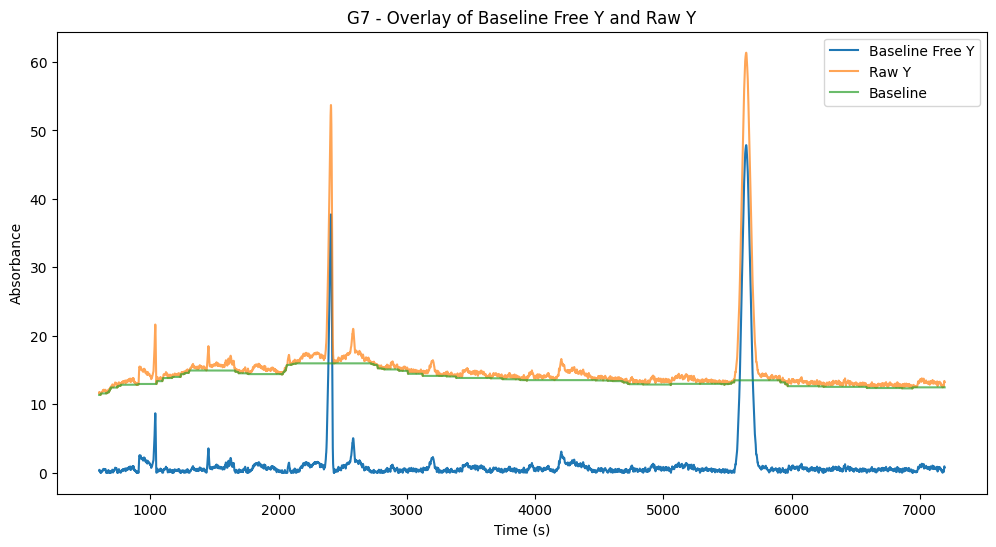

G8


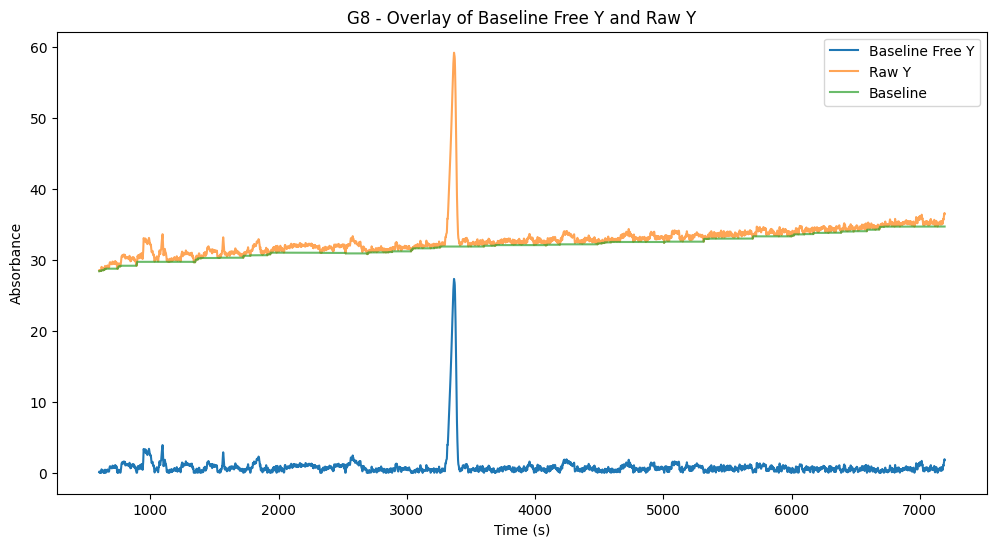

G9


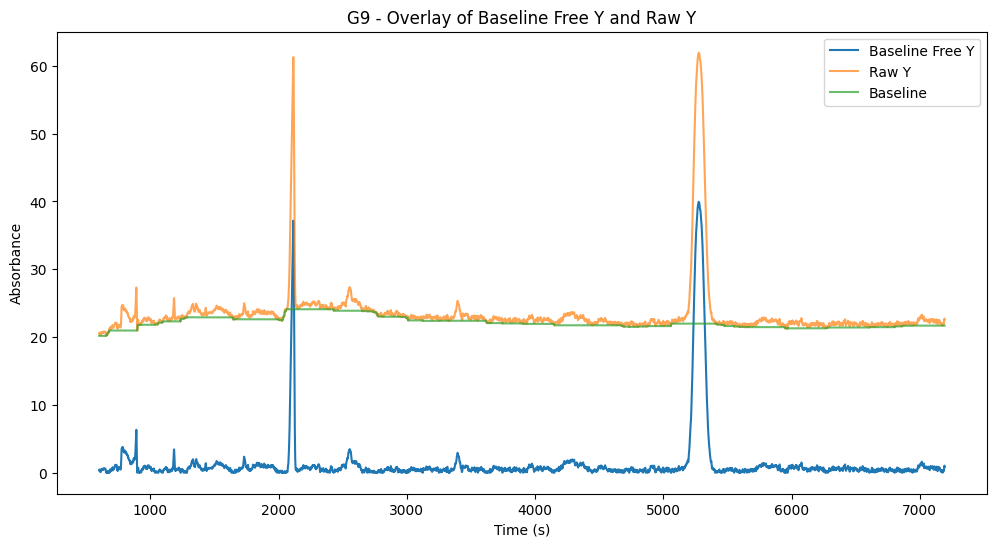

G10


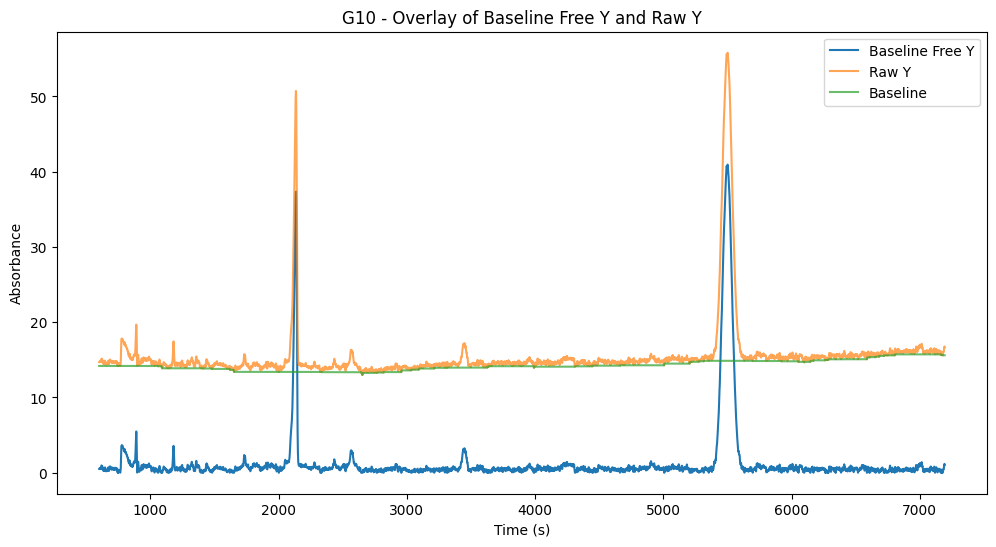

G11


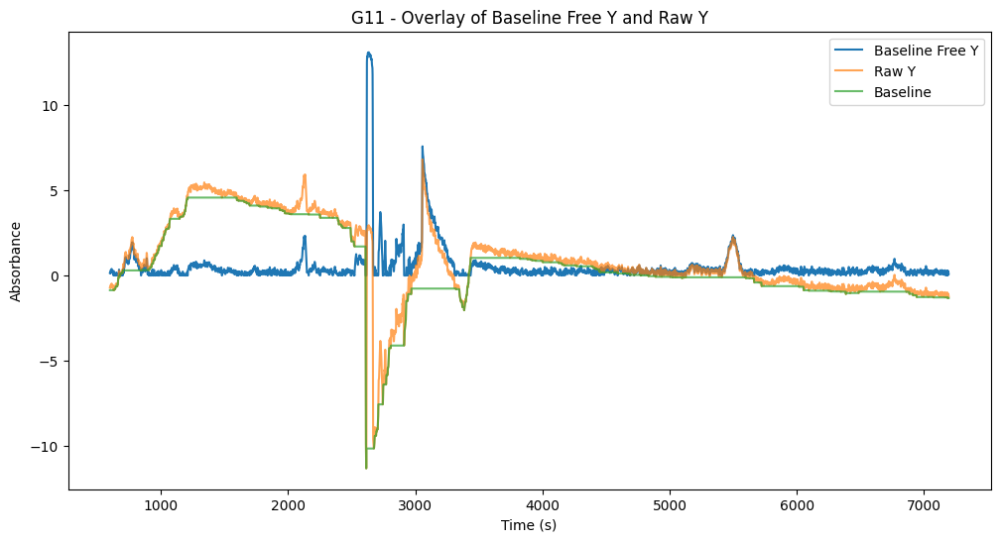

G12


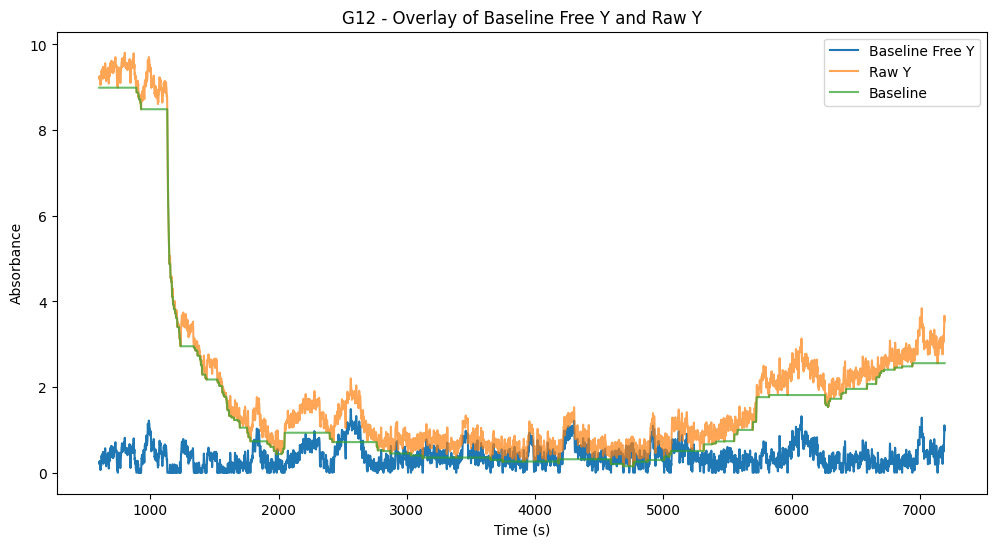

H1


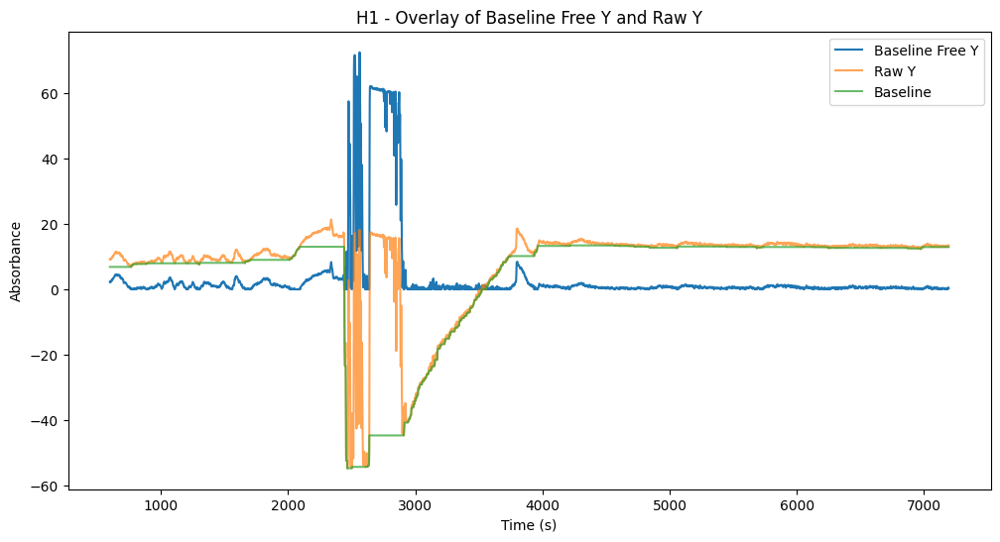

H2


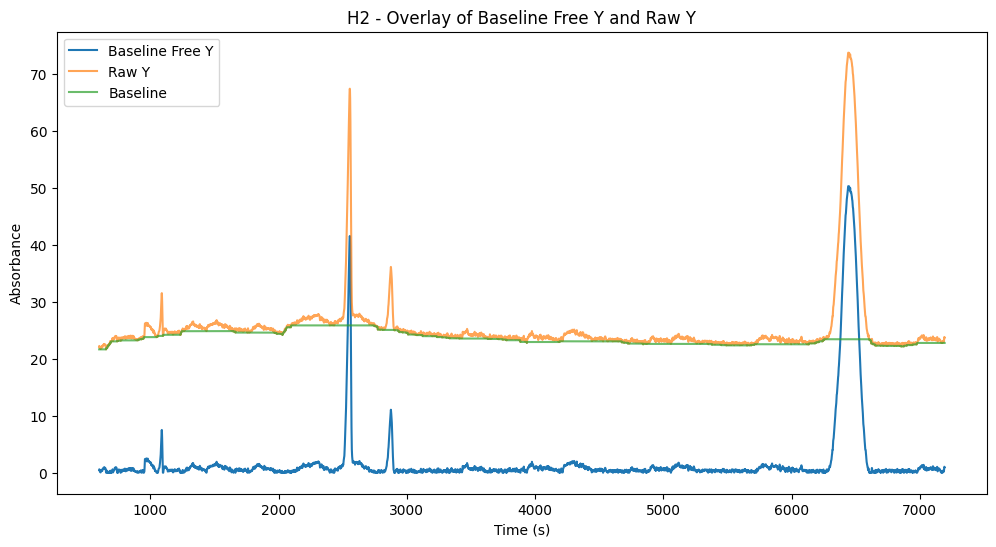

H3


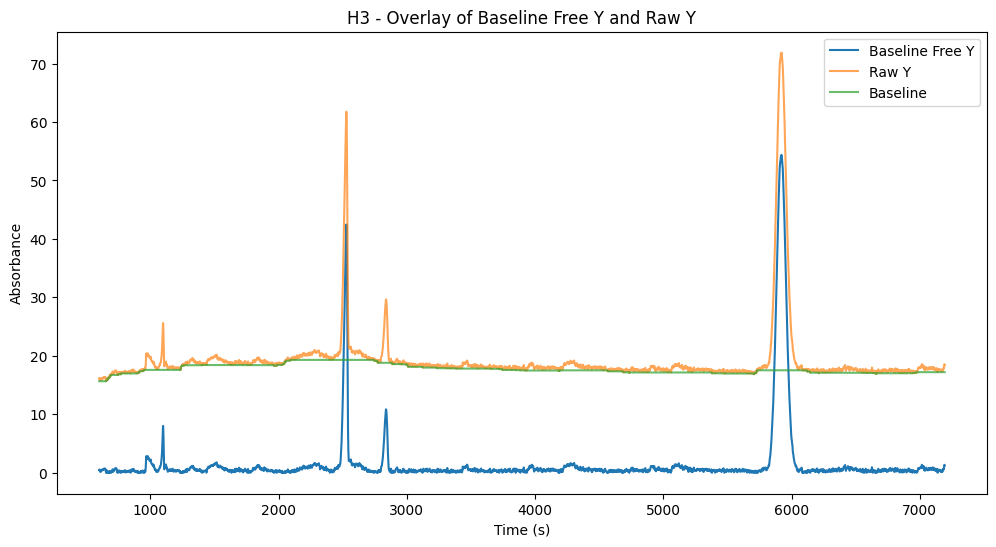

H4


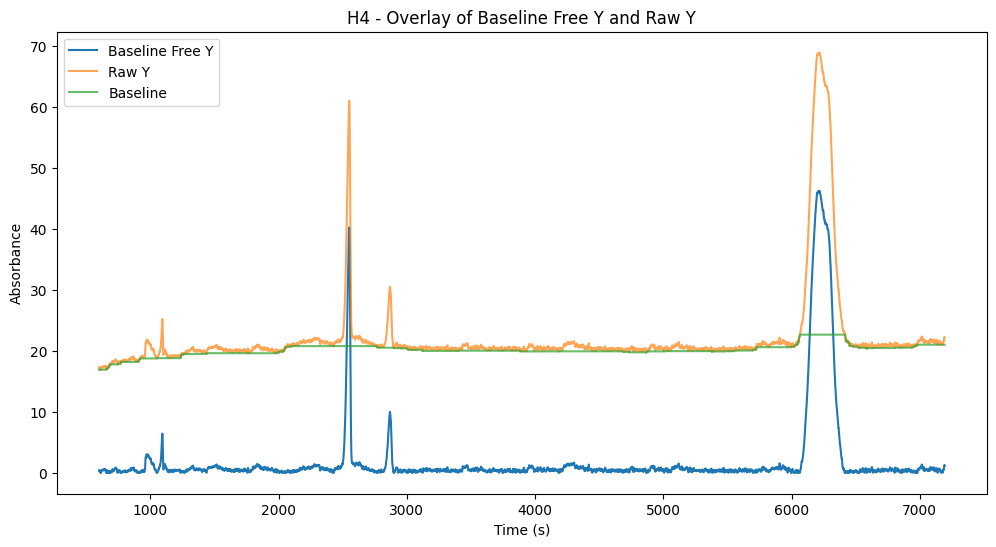

H5


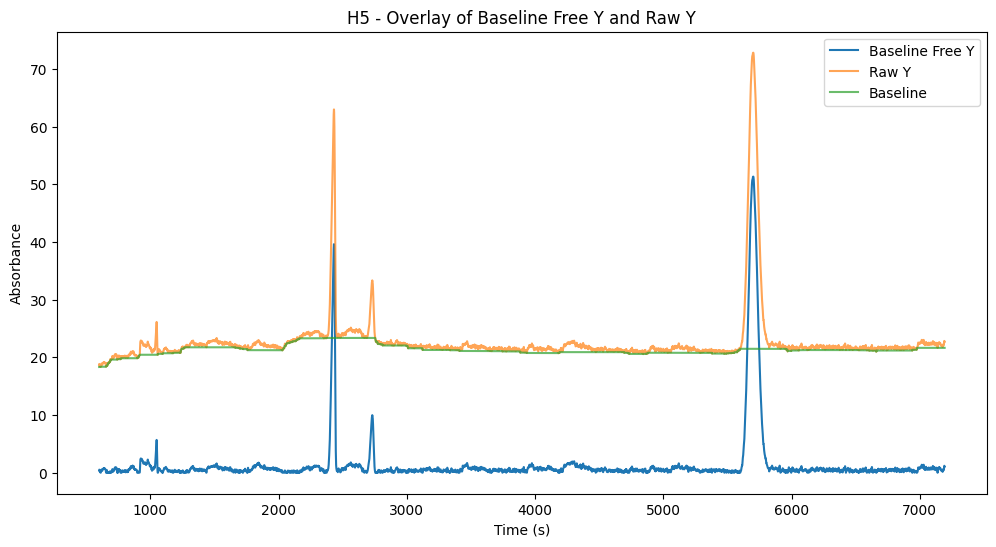

H6


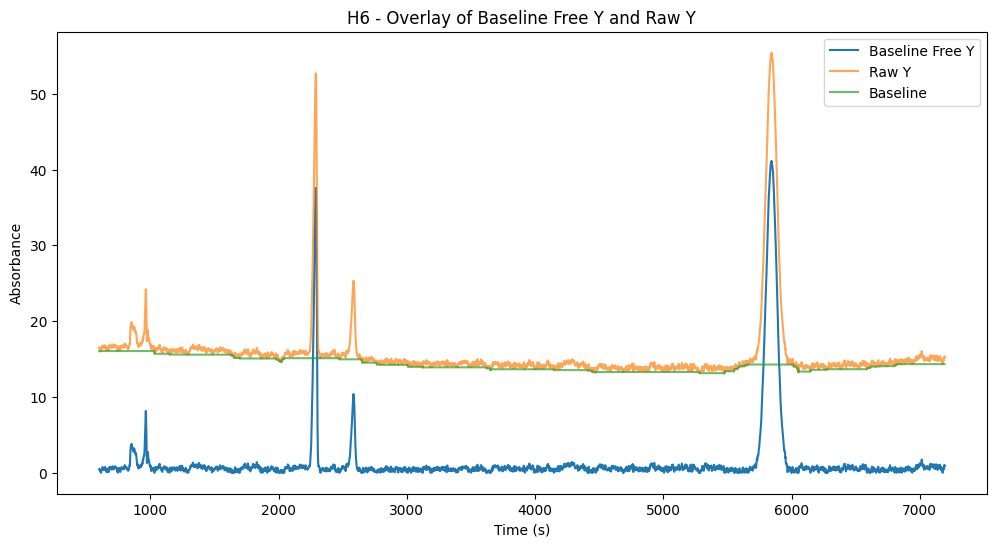

H7


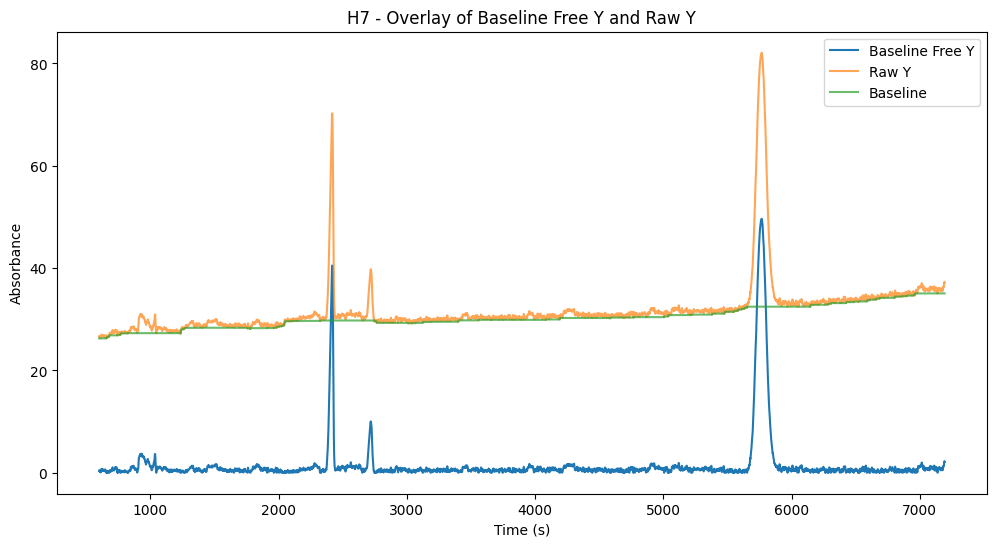

H8


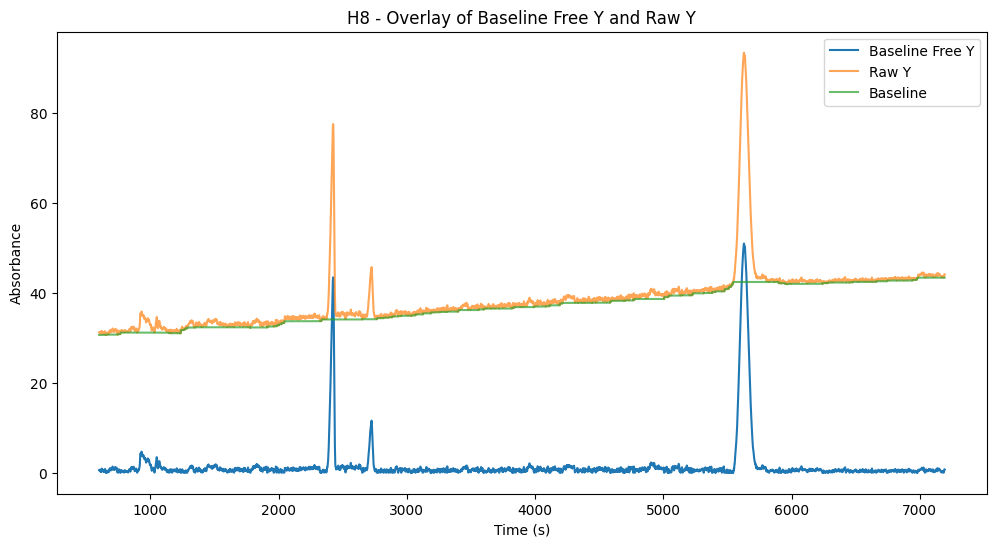

H9


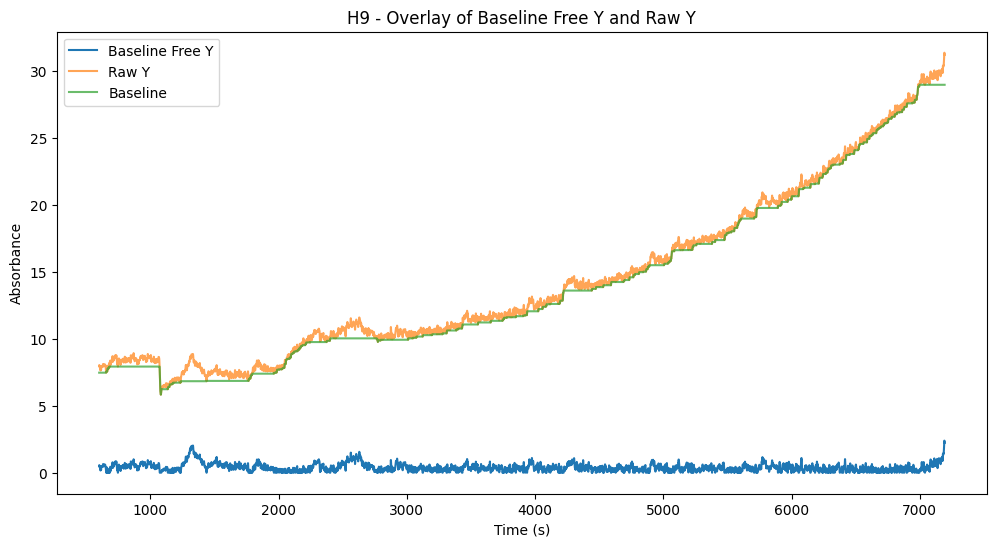

H10


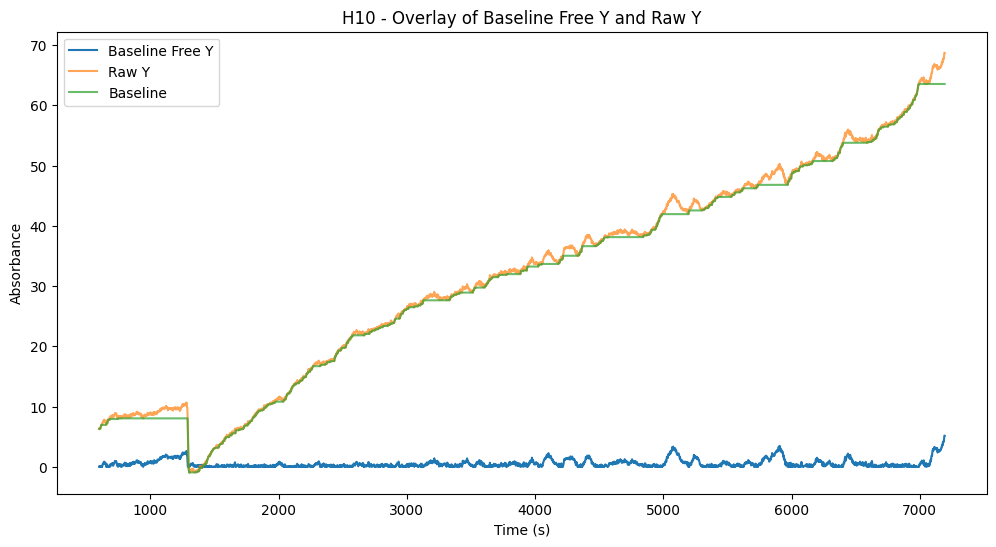

H11


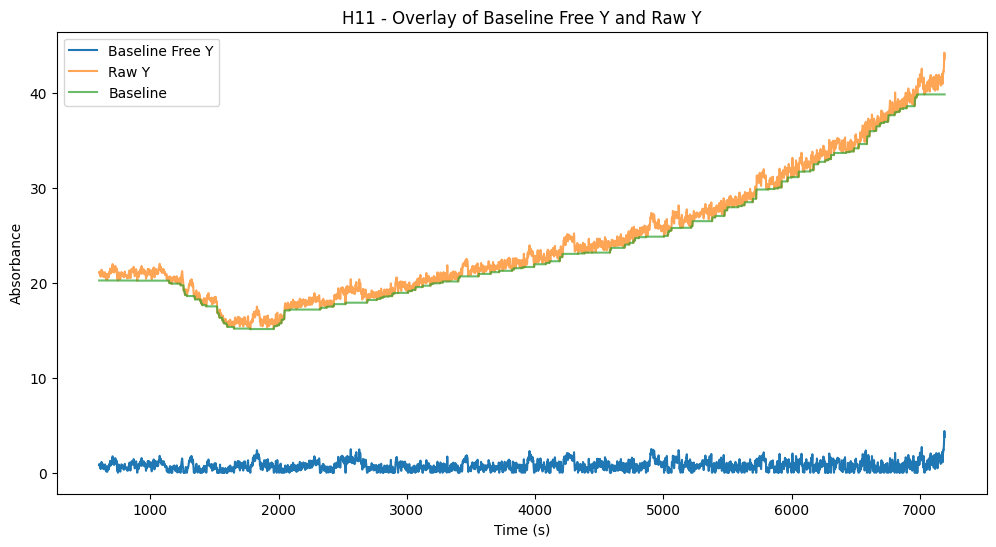

H12


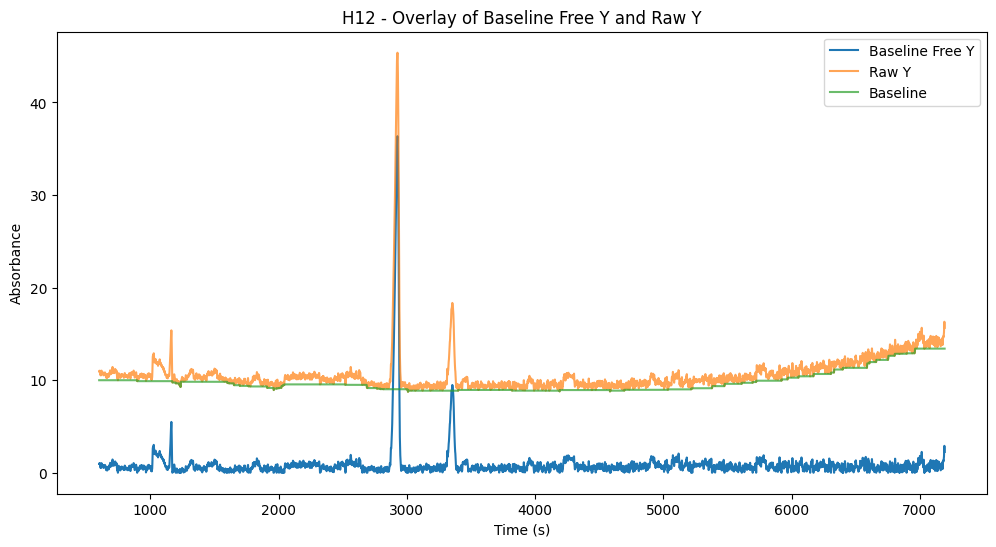

In [36]:
processed_data_folder =  f"{experiment_folder}processed_data/"
if not os.path.exists(processed_data_folder):
    os.makedirs(processed_data_folder)
log_file_path = f"{processed_data_folder}/experiment_log.txt"
summary_graph_filename = f"{processed_data_folder}/summary_graph.png"
peak_table_file_path = f"{processed_data_folder}/peak_info.csv"
json_file_path = f"{processed_data_folder}/chromatography_data.json"
chromatograms_folder = f"{processed_data_folder}/chromatograms/"

def load_chromatography_data(filepath):
    # Create an empty dictionary to store the data
    data = {}

    # List all files in the directory
    pattern = re.compile(r'^[A-H][1-9]|1[0-2]\.txt$')
    for filename in os.listdir(filepath):
        # Check if the file is a text file
        if pattern.match(filename):
            # Construct the full file path
            file_path = os.path.join(filepath, filename)
            
            # Load the file into a NumPy array
            array = np.loadtxt(file_path, delimiter=',')
            
            # Extract the well position from the filename (e.g., A1, B2, etc.)
            well_position = filename.split('.')[0]
            
            # Add the NumPy array to the dictionary
            data[well_position] = array

    return data

def get_baseline_(x,y):
    lam_equation = lambda n: 10**(-6.35 + np.log10(n) * 4.17)
    
    lam = lam_equation(len(x))
    baseline, params = whittaker.asls(y, lam=lam/1, tol=-1, max_iter=8)

    return baseline


from scipy.ndimage import grey_opening
import numpy as np
def get_baseline(x,y, window_size=700):

    structure = np.ones(window_size)
    baseline = grey_opening(y, structure=structure)
    return baseline
    
def analyze_chromatogram(x, y, variance_threshold = 10, prominence=4, width=0,height = 3, rel_height=0.75):
    # Find the peaks in the chromatography data
    peaks, properties = find_peaks(y, prominence=prominence, width=width, height=height)
    # Calculate peak widths
    results_half = peak_widths(y, peaks, rel_height=rel_height)
    peaks_with_info = []

    mask = np.ones(len(y), dtype=int)
    for i in range(len(peaks)):
        peak_index = peaks[i]
        left_ips = int(results_half[2][i])
        right_ips = int(results_half[3][i])
        peak_x = x[peak_index]
        peak_y = y[peak_index]
        width_in_seconds = x[int(right_ips)] - x[int(left_ips)]
        if(peak_y<10 and width_in_seconds > 120):
            continue
        if(peak_y<20 and width_in_seconds > 200):
            continue
        # Calculate the integral of the peak (assuming evenly spaced data)
        peak_integral = trapz(y[left_ips:right_ips], x[left_ips:right_ips])
       
        # Store peak information in a dictionary
        peak_info = {
            "peak_position": peak_x,
            "peak_boundaries": (x[left_ips], x[right_ips]),
            "peak_maximum": peak_y,
            "peak_area": peak_integral,
            "compound":"unknown"
        }
        peaks_with_info.append(peak_info)
        mask[left_ips-40:right_ips+40+1] = 0

    baseline_y = y[mask == 1]
    # Calculate variance of the baseline
    baseline_variance = np.var(baseline_y)
    print(baseline_variance)
    if baseline_variance > variance_threshold:
        
        return "bad", peaks_with_info, "chromatogram failed due to high variability"
    
    #Validate peaks here before sending data back
    if(len(peaks) > 8):
        return "bad",peaks_with_info, "chromatogram failed due to excess of peaks"
    if(len(peaks) < 1): #We always need at least 1 peak
        return "bad",peaks_with_info, "chromatogram failed due to absence of peaks"

    return "good", peaks_with_info, "chromatogram successful"


def process_chromatography_data(folder):
    data = load_chromatography_data(folder)
    processed_data = {}
    peaks = {}

    for key, data_array in data.items():

        processed_data[key] = {}
        x = data_array[:, 0]  # Extract time index x from the array
        y = data_array[:, 1]  # Extract the original y values
        if (not np.isfinite(y).all()):
            y = np.zeros(len(x))
            print(f"No data for well {key}, filling this position with empty data")
            
        #Remove first 10 mins of chromatogram
        x = x[1200:]
        y = y[1200:]
        
        processed_data[key]["x"] = x
        processed_data[key]["y"] = y

        # Apply the get_baseline function to obtain baseline-free data
        baseline_free_y = y - get_baseline(x, y)
        processed_data[key]["baseline_free_y"] = baseline_free_y

        # Analyze chromatogram and validate peaks
        column_status,chromatogram_peaks, message = analyze_chromatogram(x, baseline_free_y)
        
        peaks[key] = chromatogram_peaks
        processed_data[key]["column_status"] = column_status
        processed_data[key]["peaks"] = chromatogram_peaks
        processed_data[key]["column_status_message"] = message
        
    return processed_data
    


def plot_chromatography_data(data):
    # Number of rows and columns for the subplot grid
    n_rows = 8  # For wells A to H
    n_cols = 12 # For wells 1 to 12

    # Create a figure with subplots
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(15, 10))
    fig.subplots_adjust(hspace=0.5, wspace=0.5)

    # Iterate over the dictionary to plot each well's data
    for well_position, values in data.items():
        # Determine the row and column for the subplot
        row = ord(well_position[0]) - ord('A') # Convert 'A'-'H' to 0-7
        col = int(well_position[1:]) - 1       # Convert '1'-'12' to 0-11

        # Plot the data in the corresponding subplot
        axs[row, col].plot(values["x"], values["y"])
        if(well_position[0] == "A"):
            axs[row, col].set_title(well_position)
    
    plt.show()
    
def plot_baseline_corrected_chromatograms(data):
    # Number of rows and columns for the subplot grid
    n_rows = 8  # For wells A to H
    n_cols = 12 # For wells 1 to 12

    # Create a figure with subplots
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(15, 10))
    fig.subplots_adjust(hspace=0.5, wspace=0.5)

    # Iterate over the dictionary to plot each well's data
    for well_position, values in data.items():
       # Determine the row and column for the subplot
        row = ord(well_position[0]) - ord('A') # Convert 'A'-'H' to 0-7
        col = int(well_position[1:]) - 1       # Convert '1'-'12' to 0-11
        
        column_status = values["column_status"]
        plot_color = 'steelblue' if column_status == "good" else 'darkred'  # 'darkred' can be replaced with 'blood red' or any specific red shade

        axs[row, col].plot(values["x"], values["baseline_free_y"], color=plot_color)


        peaks = values["peaks"]
        for peak in peaks:
            x_lim = peak["peak_boundaries"]
            # axs[row, col].fill_between(values["x"], 0, values["baseline_free_y"], where=(values["x"] >= x_lim[0]) & (values["x"] <= x_lim[1]), alpha=1)
            axs[row, col].axvspan(x_lim[0], x_lim[1], color='gray', alpha=0.5)
        if(well_position[0] == "A"):
            axs[row, col].set_title(well_position)
    plt.savefig(summary_graph_filename, dpi=300)
    plt.show()
    
def plot_single_well(data, well_position):
    # Check if the specified well position is in the data
    if well_position in data:
        # Plot the data for the specified well
        plt.figure(figsize=(6, 4))
        plt.plot(data[well_position]["x"], data[well_position]["baseline_free_y"])
        plt.title(f"{well_position}")
        plt.xlabel('Time (s)')
        plt.ylabel('Absorbance')
        plt.show()
    else:
        print(f"No data found for well {well_position}")

def plot_well_data_with_baseline(data, well_position):
    # Check if the specified well position is in the data
    if well_position in data:
        well_data = data[well_position]
        
        # Plot overlay of baseline_free_y and y
        plt.figure(figsize=(12, 6))
        
        # First subplot for overlay of baseline_free_y and y
        plt.subplot(1, 1, 1)
        plt.plot(well_data["x"], well_data["baseline_free_y"], label='Baseline Free Y')
        plt.plot(well_data["x"], well_data["y"], label='Raw Y', alpha=0.7)
        plt.plot(well_data["x"], well_data["y"] - well_data["baseline_free_y"], label='Baseline', alpha=0.7)
        plt.title(f"{well_position} - Overlay of Baseline Free Y and Raw Y")
        plt.xlabel('Time (s)')
        plt.ylabel('Absorbance')
        # plt.ylim(0, 100)
        plt.legend()
        plt.show()
    else:
        print(f"No data found for well {well_position}")

def plot_in_depth_view(data, well_position):
    # Create a plot of the chromatogram with identified peaks
    plt.figure(figsize=(10, 6))
    plt.plot(data[well_position]["x"], data[well_position]["baseline_free_y"], label='Chromatogram')

    for peak_info in data[well_position]["peaks"]:
        peak_x = peak_info["peak_position"]
        peak_y = peak_info["peak_maximum"]
        left_boundary, right_boundary = peak_info["peak_boundaries"]
        peak_area = peak_info["peak_area"]

        # Highlight the peak region
        plt.axvspan(left_boundary, right_boundary, color='gray', alpha=0.5)

        # Label the peak maximum and area
        # plt.text(peak_x, peak_y, f'{peak_info["compound"]}\nRT={peak_x:.2f}\nArea={peak_area:.2f}', fontsize=10, ha='center', va='bottom')

    plt.xlabel('Retention Time')
    plt.ylabel('Signal Intensity')
    plt.legend()
    title = re.findall(r'([^/]+)/?$', experiment_folder)[0]
    plt.title(f'Chromatogram {title} {well_position}')
    
    # Set y-axis limit
    # plt.ylim(0, 100)

    if not os.path.exists(chromatograms_folder):
        os.makedirs(chromatograms_folder)
    plt.savefig(f"{chromatograms_folder}{well_position}.png")
    plt.show()
 
def print_column_status(data):    
    with open(log_file_path, "w") as log_file:
        # Print and log the experiment folder
        print(experiment_folder)
        log_file.write(f"{experiment_folder}\n")
        
        for letter in string.ascii_uppercase[:8]:
            for i in range(1, 13):
                key = f"{letter}{i}"
                if data[key]["column_status"] == "bad":
                    message = f"{key} {data[key]['column_status_message']}\n"
                    print(message, end='')  # Print to terminal
                    log_file.write(message)  # Write to log file

def output_peak_table(data):
    # Writing peak data to a CSV file
    with open(peak_table_file_path, 'w', newline='') as csvfile:
        fieldnames = ['Well', 'Peak Position', 'Peak Width', 'Peak Start', 'Peak End', 'Peak Maximum', 'Peak Area', 'Compound', 'Status']
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames, delimiter=';')
        
        writer.writeheader()
        json_data = {}
        for letter in string.ascii_uppercase[:8]:
            for i in range(1, 13):
                key = f"{letter}{i}"
                json_data[key] = {
                    "peaks":data[key]["peaks"],
                    "column_status":data[key]["column_status"],
                    "column_status_message":data[key]["column_status_message"],
                    "x":list(data[key]["x"]),
                    "y":list(data[key]["y"]),
                    "baseline_free_y":list(data[key]["baseline_free_y"]),
                }
                # if(data[key]['column_status'] != "good"):
                #     continue
                for peak in data[key]["peaks"]:
                    writer.writerow({
                        'Well': key,
                        'Peak Position': str(peak["peak_position"]).replace('.', ','),
                        'Peak Width': str(peak['peak_boundaries'][1]-peak['peak_boundaries'][0]).replace('.', ','),
                        'Peak Start': str(peak['peak_boundaries'][0]).replace('.', ','),
                        'Peak End': str(peak['peak_boundaries'][1]).replace('.', ','),
                        'Peak Maximum': str(peak["peak_maximum"]).replace('.', ','),
                        'Peak Area': str(peak["peak_area"]).replace('.', ','),
                        'Compound': peak["compound"],
                        'Status': data[key]['column_status']
                    })
    # Saving the entire data to a JSON file
    with open(json_file_path, 'w') as jsonfile:
        json.dump(json_data, jsonfile, indent=4)
        print("json saved")
        
processed_data = process_chromatography_data(experiment_folder)
print_column_status(processed_data)
output_peak_table(processed_data)
plot_baseline_corrected_chromatograms(processed_data)
for letter in string.ascii_uppercase[:8]:
    for i in range(1,13):
        print(f"{letter}{i}")
        plot_in_depth_view(processed_data, f"{letter}{i}")

for letter in string.ascii_uppercase[:8]:
    for i in range(1,13):
        print(f"{letter}{i}")
        plot_well_data_with_baseline(processed_data, f"{letter}{i}")

# Identify peaks

In [28]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.sparse import spdiags
from scipy.sparse.linalg import spsolve
from scipy.signal import find_peaks,peak_widths
from scipy.integrate import trapz
from pybaselines import whittaker
import string
import re
import csv
import json

In [33]:
experiment_folder = "../../../data/CE_data/25_01_24_Substrate_tests_1/"


conditions = "7kV 30 mM SDS"
base_peak = "DMSO"
normalizing_peak = "PABA"
compounds_to_identify = ["Phenol","pNPS","Nitro_Phenol","Phenol_sulfate"]

In [34]:
processed_data_folder =  f"{experiment_folder}processed_data/"
log_file_path = f"{processed_data_folder}/experiment_log.txt"
summary_graph_filename = f"{processed_data_folder}/summary_graph.png"
peak_table_file_path = f"{processed_data_folder}/peak_info.csv"
json_file_path = f"{processed_data_folder}/chromatography_data.json"
chromatograms_folder = f"{processed_data_folder}/chromatograms/"

base_compound_info = {
    "DMSO":{
        "7kV 30 mM SDS":{
            "min_retention_time":1500,
            "max_retention_time":2000
        }
    }
}
normalized_compound_info = {
    "PABA":{
         "7kV 30 mM SDS":{
            "DMSO":{
                "min_normalized_retention_time":2.1,
                "max_normalized_retention_time":2.7
            },
         },
    },
}
linearized_compound_info = {
    "Phenol":{
        "7kV 30 mM SDS":{
            "DMSO":{
                "PABA":{
                    "min_linearized_retention_time":0.2, 
                    "ideal_linearized_retention_time":0.225,
                    "max_linearized_retention_time":0.25
                }
            }
        }
    },
    "pNPS":{
        "7kV 30 mM SDS":{
            "DMSO":{
                "PABA":{
                    "min_linearized_retention_time":1.40, 
                    "ideal_linearized_retention_time":1.52,
                    "max_linearized_retention_time":1.60
                }
            }
        }
    },
    "Nitro_Phenol":{
        "7kV 30 mM SDS":{
            "DMSO":{
                "PABA":{
                    "min_linearized_retention_time":1.23, 
                    "ideal_linearized_retention_time":1.295,
                    "max_linearized_retention_time":1.35
                }
            }
        }
    },
    "Phenol_sulfate":{
        "7kV 30 mM SDS":{
            "DMSO":{
                "PABA":{
                    "min_linearized_retention_time":1.70, 
                    "ideal_linearized_retention_time":1.77,
                    "max_linearized_retention_time":1.85
                }
            }
        }
    },
    "Phenyl_glucose":{
        "7kV 30 mM SDS":{
            "DMSO":{
                "PABA":{
                    "min_linearized_retention_time":0.03, 
                    "ideal_linearized_retention_time":0.07,
                    "max_linearized_retention_time":0.15
                }
            }
        }
    }
}

def plot_in_depth_view(data, well_position):
    # Create a plot of the chromatogram with identified peaks
    plt.figure(figsize=(10, 6))
    plt.plot(data[well_position]["x"], data[well_position]["baseline_free_y"], label='Chromatogram')

    for peak_info in data[well_position]["peaks"]:
        peak_x = peak_info["peak_position"]
        peak_y = peak_info["peak_maximum"]
        left_boundary, right_boundary = peak_info["peak_boundaries"]
        peak_area = peak_info["peak_area"]

        # Highlight the peak region
        plt.axvspan(left_boundary, right_boundary, color='gray', alpha=0.5)

        # Label the peak maximum and area
        plt.text(peak_x, peak_y, f'{peak_info["compound"]}\nRT={peak_x:.2f}\nArea={peak_area:.2f}', fontsize=10, ha='center', va='bottom')

    plt.xlabel('Retention Time')
    plt.ylabel('Signal Intensity')
    plt.legend()
    title = re.findall(r'([^/]+)/?$', experiment_folder)[0]
    plt.title(f'Chromatogram {title} {well_position}')

    if not os.path.exists(chromatograms_folder):
        os.makedirs(chromatograms_folder)
    plt.savefig(f"{chromatograms_folder}{well_position}.png")
    plt.show()
  
def identify_compounds(data, well, conditions = "7kV 30 mM SDS",base_compound = "DMSO", normalized_compound = "PABA", compounds_required = [], compounds_possible = ["Phenyl_glucose","Phenol","pNPS","Nitro_Phenol","Phenol_sulfate"]):
    well_data = data[well]
    # print(well_data)
    if(well_data["column_status"] != "good"):
        # print(f"well_data was already bad for {well}, returning")
        return well_data
    peaks = well_data["peaks"]
    
    #Identify base compounds in peaks
    specific_base_compound_info = base_compound_info[base_compound][conditions]
    base_peak = None
    base_min = specific_base_compound_info["min_retention_time"]
    base_max = specific_base_compound_info["max_retention_time"]
    peaks_sorted_by_size = sorted(peaks, key=lambda peak: peak['peak_area'], reverse=True)
    base_peak_candidates = peaks_sorted_by_size[0:3]
    for candidate in base_peak_candidates:
        if(candidate["peak_position"] > base_min and candidate["peak_position"] < base_max):
            base_peak = candidate
            base_peak["compound"] = base_compound
            peaks = [d for d in peaks if d != base_peak]
            # print("identified base peak!")
            break
    if (not base_peak):
        data[well]["column_status"] = "bad"
        data[well]["column_status_message"] = f"no peak for the base compound {base_compound} could be found"
        return "bad", well_data, f"no peak for the base compound {base_compound} could be found"
        
    #Identify normalized compound in peaks
    normalizing_peak = None
    min_normalized_retention_time = normalized_compound_info[normalized_compound][conditions][base_compound]["min_normalized_retention_time"]
    max_normalized_retention_time = normalized_compound_info[normalized_compound][conditions][base_compound]["max_normalized_retention_time"]

    peaks_within_range = [peak for peak in peaks if min_normalized_retention_time <= peak['peak_position']/base_peak["peak_position"] <= max_normalized_retention_time]
    
    # Find the peak with the largest peak area among the filtered peaks
    if peaks_within_range:
        largest_peak = max(peaks_within_range, key=lambda x: x['peak_area'])
        normalizing_peak = largest_peak
        normalizing_peak["compound"] = normalized_compound
        peaks = [d for d in peaks if d != normalizing_peak]
        # print("identified normalizing peak!")
        
    if (not normalizing_peak):
        data[well]["column_status"] = "bad"
        data[well]["column_status_message"] = f"no peak for the normalizing compound {normalized_compound} could be found"
        return "bad",well_data, f"no peak for the normalizing compound {normalized_compound} could be found"
        
    #Identify now linearized compounds
    for peak in peaks:
        peak["linearized_retention_time"] = (peak["peak_position"]-base_peak["peak_position"])/(normalizing_peak["peak_position"]-base_peak["peak_position"])

    # print(peaks)
    compound_peaks = {}
    for compound in compounds_required:
        min_retention_time = linearized_compound_info[compound][conditions][base_compound][normalized_compound]["min_linearized_retention_time"]
        max_retention_time = linearized_compound_info[compound][conditions][base_compound][normalized_compound]["max_linearized_retention_time"]
        ideal_retention_time = linearized_compound_info[compound][conditions][base_compound][normalized_compound]["ideal_linearized_retention_time"]
        peaks_within_range = [peak for peak in peaks if min_retention_time <= peak["linearized_retention_time"] <= max_retention_time]
        # print(f"these are the peaks within range for {compound}: {peaks_within_range}")
        if(peaks_within_range):
            candidate = sorted(peaks_within_range, key=lambda peak: abs(peak["linearized_retention_time"] - ideal_retention_time))[0]
            candidate["compound"] = compound
            compound_peaks[compound] = candidate
            peaks = [d for d in peaks if d != candidate]
        else:
            data[well]["column_status"] = "bad"
            data[well]["column_status_message"] = f"no peak for the required compound {compound} could be found"
            return "bad",well_data, f"no peak for the required compound {compound} could be found"
            
    for compound in compounds_possible:
        # print(f"trying to identify possible compound {compound}")
        min_retention_time = linearized_compound_info[compound][conditions][base_compound][normalized_compound]["min_linearized_retention_time"]
        max_retention_time = linearized_compound_info[compound][conditions][base_compound][normalized_compound]["max_linearized_retention_time"]
        ideal_retention_time = linearized_compound_info[compound][conditions][base_compound][normalized_compound]["ideal_linearized_retention_time"]
        peaks_within_range = [peak for peak in peaks if min_retention_time <= peak["linearized_retention_time"] <= max_retention_time]
        # print(f"these are the peaks within range for {compound}: {peaks_within_range}")
        if(peaks_within_range):
            candidate = sorted(peaks_within_range, key=lambda peak: abs(peak["linearized_retention_time"] - ideal_retention_time))[0]
            candidate["compound"] = compound
            compound_peaks[compound] = candidate
            peaks = [d for d in peaks if d != candidate]

    data[well]["column_status_message"] = f"all required peaks {base_compound}, {normalized_compound}, and {compounds_required}, /npeaks:/n{peaks}"
    return "good",well_data, f"all required peaks {base_compound}, {normalized_compound}, and {compounds_required}, \npeaks:\n{peaks}"

def plot_baseline_corrected_chromatograms(data):
    # Number of rows and columns for the subplot grid
    n_rows = 8  # For wells A to H
    n_cols = 12 # For wells 1 to 12

    # Create a figure with subplots
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(15, 10))
    fig.subplots_adjust(hspace=0.5, wspace=0.5)

    # Iterate over the dictionary to plot each well's data
    for well_position, values in data.items():
       # Determine the row and column for the subplot
        row = ord(well_position[0]) - ord('A') # Convert 'A'-'H' to 0-7
        col = int(well_position[1:]) - 1       # Convert '1'-'12' to 0-11
        
        column_status = values["column_status"]
        plot_color = 'steelblue' if column_status == "good" else 'darkred'  # 'darkred' can be replaced with 'blood red' or any specific red shade

        axs[row, col].plot(values["x"], values["baseline_free_y"], color=plot_color)


        peaks = values["peaks"]
        for peak in peaks:
            x_lim = peak["peak_boundaries"]
            # axs[row, col].fill_between(values["x"], 0, values["baseline_free_y"], where=(values["x"] >= x_lim[0]) & (values["x"] <= x_lim[1]), alpha=1)
            axs[row, col].axvspan(x_lim[0], x_lim[1], color='gray', alpha=0.5)
        if(well_position[0] == "A"):
            axs[row, col].set_title(well_position)
    plt.savefig(summary_graph_filename, dpi=300)
    plt.show()
    
def plot_in_depth_view(data, well_position):
    # Create a plot of the chromatogram with identified peaks
    plt.figure(figsize=(10, 6))
    plt.plot(data[well_position]["x"], data[well_position]["baseline_free_y"], label='Chromatogram')

    for peak_info in data[well_position]["peaks"]:
        peak_x = peak_info["peak_position"]
        peak_y = peak_info["peak_maximum"]
        left_boundary, right_boundary = peak_info["peak_boundaries"]
        peak_area = peak_info["peak_area"]

        # Highlight the peak region
        plt.axvspan(left_boundary, right_boundary, color='gray', alpha=0.5)

        # Label the peak maximum and area
        plt.text(peak_x, peak_y, f'{peak_info["compound"]}\nRT={peak_x:.2f}\nArea={peak_area:.2f}', fontsize=10, ha='center', va='bottom')

    plt.xlabel('Retention Time')
    plt.ylabel('Signal Intensity')
    plt.legend()
    title = re.findall(r'([^/]+)/?$', experiment_folder)[0]
    plt.title(f'Chromatogram {title} {well_position}')
    
    # Set y-axis limit
    # plt.ylim(0, 100)

    if not os.path.exists(chromatograms_folder):
        os.makedirs(chromatograms_folder)
    plt.savefig(f"{chromatograms_folder}{well_position}.png")
    plt.show()
    
def output_peak_table(data):
    # Writing peak data to a CSV file
    with open(peak_table_file_path, 'w', newline='') as csvfile:
        fieldnames = ['Well', 'Peak Position', 'Peak Width', 'Peak Start', 'Peak End', 'Peak Maximum', 'Peak Area', 'Compound', 'Status']
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames, delimiter=';')
        
        writer.writeheader()
        json_data = {}
        for letter in string.ascii_uppercase[:8]:
            for i in range(1, 13):
                key = f"{letter}{i}"
                json_data[key] = {
                    "peaks":data[key]["peaks"],
                    "column_status":data[key]["column_status"],
                    "column_status_message":data[key]["column_status_message"],
                    "x":list(data[key]["x"]),
                    "y":list(data[key]["y"]),
                    "baseline_free_y":list(data[key]["baseline_free_y"]),
                }
                # if(data[key]['column_status'] != "good"):
                #     continue
                for peak in data[key]["peaks"]:
                    writer.writerow({
                        'Well': key,
                        'Peak Position': str(peak["peak_position"]).replace('.', ','),
                        'Peak Width': str(peak['peak_boundaries'][1]-peak['peak_boundaries'][0]).replace('.', ','),
                        'Peak Start': str(peak['peak_boundaries'][0]).replace('.', ','),
                        'Peak End': str(peak['peak_boundaries'][1]).replace('.', ','),
                        'Peak Maximum': str(peak["peak_maximum"]).replace('.', ','),
                        'Peak Area': str(peak["peak_area"]).replace('.', ','),
                        'Compound': peak["compound"],
                        'Status': data[key]['column_status']
                    })
    # Saving the entire data to a JSON file
    with open(json_file_path, 'w') as jsonfile:
        json.dump(json_data, jsonfile, indent=4)
        print("json saved")

def print_column_status(data):    
    with open(log_file_path, "w") as log_file:
        # Print and log the experiment folder
        print(experiment_folder)
        log_file.write(f"{experiment_folder}\n")
        
        for letter in string.ascii_uppercase[:8]:
            for i in range(1, 13):
                key = f"{letter}{i}"
                if data[key]["column_status"] == "bad":
                    message = f"{key} {data[key]['column_status_message']}\n"
                    print(message, end='')  # Print to terminal
                    log_file.write(message)  # Write to log file
                    
with open(json_file_path, 'r') as file:
    data = json.load(file)
    
for letter in string.ascii_uppercase[:8]:
    for i in range(1,13):
        identify_compounds(data,f"{letter}{i}")
        
print_column_status(data)
output_peak_table(data)
plot_baseline_corrected_chromatograms(data)
for letter in string.ascii_uppercase[:8]:
    for i in range(1,13):
        print(f"{letter}{i}")
        print(data[f"{letter}{i}"]["column_status"], data[f"{letter}{i}"]["column_status_message"])
        plot_in_depth_view(data, f"{letter}{i}")



FileNotFoundError: [Errno 2] No such file or directory: '../../../data/CE_data/25_01_24_Substrate_tests_1/processed_data//chromatography_data.json'